# Data Analysis of OmniMart Retailer Dataset

# Data Description

The dataset contains detailed information about retail transactions in **OmniMart Retailers**, providing a comprehensive view of customer behavior, product performance, and purchasing patterns.  

---

## Customer Information
- **Customer ID**: Unique identifier for each customer  
- **Name**: Customer’s full name  
- **Email**: Customer’s email address  
- **Phone**: Customer’s contact number  
- **Address**: Customer’s physical address  
- **City, State, Zipcode, Country**: Geographic details of the customer  
- **Age**: Age of the customer  
- **Gender**: Gender of the customer  
- **Income**: Income bracket or level of the customer  
- **Customer Segment**: Classification of customers based on demographics or behavior  

---

## Transaction Details
- **Last Purchase Date**: Date of the most recent purchase  
- **Total Purchases**: Total number of purchases made  
- **Amount Spent**: Total monetary amount spent by the customer  

---

## Product Information
- **Product Category**: Category of the product (e.g., Electronics, Clothing, Groceries)  
- **Product Brand**: Brand name of the product  
- **Product Type**: Specific type or model of the product purchased  

---

## Feedback
- **Feedback**: Customer’s review, feedback, or rating of the product/service  

---

## Transaction Logistics
- **Shipping Method**: Delivery method used (e.g., Express, Standard, Same-Day)  
- **Payment Method**: Method of payment chosen by the customer  
- **Order Status**: Current status of the order (e.g., Shipped, Delivered, Canceled)  


# Notebook Structure

1. Import Dependencies
2. loading the dataset
3. Visualizing the dataset
4. Features Classification
5. Important Pre-computation/Cleaning
6. Exploratory Data Analysis - Univariate Analysis of Numerical Variables
7. Exploratory Data Analysis - Univariate Analysis of Categorical Variables
8. Exploratory Data Analysis -Bivariate Analysis
9. Exploratory Data Analysis -Multivariate Analysis
10. Exploratory Data Analysis - Timeseries Analysis - Absolute Values of the KPI's
11. Exploratory Data Analysis - Timeseries Analysis - Growth of the KPI's

12. Special analysis
13. Business Recommendation

# 1. Importing Dependencies

In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')

# 2. Loading the dataset

In [ ]:
df = pd.read_csv('retail_data.csv')

# 3. Visualizing the dataset

In [ ]:
df.head()

,Transaction_ID,Customer_ID,Name,Email,Phone,Address,City,State,Zipcode,Country,...,Total_Amount,Product_Category,Product_Brand,Product_Type,Feedback,Shipping_Method,Payment_Method,Order_Status,Ratings,products
0,8691788.0,37249.0,Michelle Harrington,Ebony39@gmail.com,1.414787e+09,3959 Amanda Burgs,Dortmund,Berlin,77985.0,Germany,...,324.086270,Clothing,Nike,Shorts,Excellent,Same-Day,Debit Card,Shipped,5.0,Cycling shorts
1,2174773.0,69749.0,Kelsey Hill,Mark36@gmail.com,6.852900e+09,82072 Dawn Centers,Nottingham,England,99071.0,UK,...,806.707815,Electronics,Samsung,Tablet,Excellent,Standard,Credit Card,Processing,4.0,Lenovo Tab
2,6679610.0,30192.0,Scott Jensen,Shane85@gmail.com,8.362160e+09,4133 Young Canyon,Geelong,New South Wales,75929.0,Australia,...,1063.432799,Books,Penguin Books,Children's,Average,Same-Day,Credit Card,Processing,2.0,Sports equipment
3,7232460.0,62101.0,Joseph Miller,Mary34@gmail.com,2.776752e+09,8148 Thomas Creek Suite 100,Edmonton,Ontario,88420.0,Canada,...,2466.854021,Home Decor,Home Depot,Tools,Excellent,Standard,PayPal,Processing,4.0,Utility knife
4,4983775.0,27901.0,Debra Coleman,Charles30@gmail.com,9.098268e+09,5813 Lori Ports Suite 269,Bristol,England,48704.0,UK,...,248.553049,Grocery,Nestle,Chocolate,Bad,Standard,Cash,Shipped,1.0,Chocolate cookies


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 302010 entries, 0 to 302009
Data columns (total 30 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   Transaction_ID    301677 non-null  float64
 1   Customer_ID       301702 non-null  float64
 2   Name              301628 non-null  object 
 3   Email             301663 non-null  object 
 4   Phone             301648 non-null  float64
 5   Address           301695 non-null  object 
 6   City              301762 non-null  object 
 7   State             301729 non-null  object 
 8   Zipcode           301670 non-null  float64
 9   Country           301739 non-null  object 
 10  Age               301837 non-null  float64
 11  Gender            301693 non-null  object 
 12  Income            301720 non-null  object 
 13  Customer_Segment  301795 non-null  object 
 14  Date              301651 non-null  object 
 15  Year              301660 non-null  float64
 16  Month             30

# 4. Features Classification

* Features are divided into numerical and categorical types

In [ ]:
# store numerical columns in a list
numerical_cols = df.select_dtypes(include=np.number).columns.tolist()
print(numerical_cols)

['Transaction_ID', 'Customer_ID', 'Phone', 'Zipcode', 'Age', 'Year', 'Total_Purchases', 'Amount', 'Total_Amount', 'Ratings']


In [ ]:
# store categorical columns in a list
categorical_cols = df.select_dtypes(include='object').columns.tolist()
print(categorical_cols)

['Name', 'Email', 'Address', 'City', 'State', 'Country', 'Gender', 'Income', 'Customer_Segment', 'Date', 'Month', 'Time', 'Product_Category', 'Product_Brand', 'Product_Type', 'Feedback', 'Shipping_Method', 'Payment_Method', 'Order_Status', 'products']


# 5. Pre-Computation And Cleaning

* Conversion of Date to datetime
* Creating 'Generation' By Binning Age Column

## A. Conversion of Date to datetime


In [ ]:
# Try common formats
formats = ["%m/%d/%Y", "%m-%d-%y", "%m-%d-%Y", "%d-%m-%y", "%d-%m-%Y"]

# Start with NaT column
df['Date_clean'] = pd.NaT

for fmt in formats:
    mask = df['Date_clean'].isna()
    df.loc[mask, 'Date_clean'] = pd.to_datetime(df.loc[mask, 'Date'], format=fmt, errors='coerce')

# Check results
df['Date']=df['Date_clean']
df = df.drop('Date_clean', axis=1)

In [ ]:
df['Date'].head()

,Date
0,2023-09-18
1,2023-12-31
2,2023-04-26
3,2023-05-08
4,2024-01-10


## B. Creating 'Generation' By Binning Age Column

In [ ]:
# Binning of ages according to genertaion
df['Generation'] = pd.cut(df['Age'],
                         bins=[ 9, 24, 40, 56, 75],
                          labels=[ 'Gen Z', 'Millennials', 'Gen X', 'Boomers'])

print("Generational Distribution:")
print(df['Generation'].value_counts())

Generational Distribution:
Generation
Gen Z          109303
Millennials     81514
Gen X           74506
Boomers         36514
Name: count, dtype: int64


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 302010 entries, 0 to 302009
Data columns (total 30 columns):
 #   Column            Non-Null Count   Dtype         
---  ------            --------------   -----         
 0   Transaction_ID    301677 non-null  float64       
 1   Customer_ID       301702 non-null  float64       
 2   Name              301628 non-null  object        
 3   Email             301663 non-null  object        
 4   Phone             301648 non-null  float64       
 5   Address           301695 non-null  object        
 6   City              301762 non-null  object        
 7   State             301729 non-null  object        
 8   Zipcode           301670 non-null  float64       
 9   Country           301739 non-null  object        
 10  Age               301837 non-null  float64       
 11  Gender            301693 non-null  object        
 12  Income            301720 non-null  object        
 13  Customer_Segment  301795 non-null  object        
 14  Date

# 6. Exploratory Data Analysis - Univariate Analysis of Numerical Variables
* Quantitative Analysis
* Visualizing Data Distribution using Histograms with KDE
* Visualizing the Discrete Numerical Variables

## A. Quantitative Analysis

* Variables: Age, Total_Purchases, Amount, Total_Amount, Ratings
* Objective: Getting Statistical Overview of Numerical Columns

In [ ]:
print("\n1. Central Tendency, Dispersion, Skewness & Kurtosis of numerical variables:")

num_col = ['Age', 'Total_Purchases', 'Amount', 'Total_Amount', 'Ratings']

for col in num_col:
    print(col.upper())

    # Central tendency
    print(f"Mean   {col}: {df[col].mean():.2f}")
    print(f"Median {col}: {df[col].median():.2f}")

    if col in ['Age', 'Total_Purchases', 'Ratings']:
        print(f"Mode   {col}: {df[col].mode().tolist()}")

    # Dispersion
    print(f"Std Dev {col}: {df[col].std():.2f}")
    print(f"Min     {col}: {df[col].min()}")
    print(f"25% Q1  {col}: {df[col].quantile(0.25):.2f}")
    print(f"50% Q2  {col}: {df[col].quantile(0.50):.2f}")  # same as median
    print(f"75% Q3  {col}: {df[col].quantile(0.75):.2f}")
    print(f"Max     {col}: {df[col].max()}")

    # Skewness & Kurtosis
    print(f"Skewness {col}: {df[col].skew():.2f}")
    print(f"Kurtosis {col}: {df[col].kurt():.2f}")

    print("="*40)




1. Central Tendency, Dispersion, Skewness & Kurtosis of numerical variables:
AGE
Mean   Age: 35.48
Median Age: 32.00
Mode   Age: [20.0]
Std Dev Age: 15.02
Min     Age: 18.0
25% Q1  Age: 22.00
50% Q2  Age: 32.00
75% Q3  Age: 46.00
Max     Age: 70.0
Skewness Age: 0.65
Kurtosis Age: -0.81
TOTAL_PURCHASES
Mean   Total_Purchases: 5.36
Median Total_Purchases: 5.00
Mode   Total_Purchases: [5.0]
Std Dev Total_Purchases: 2.87
Min     Total_Purchases: 1.0
25% Q1  Total_Purchases: 3.00
50% Q2  Total_Purchases: 5.00
75% Q3  Total_Purchases: 8.00
Max     Total_Purchases: 10.0
Skewness Total_Purchases: 0.07
Kurtosis Total_Purchases: -1.22
AMOUNT
Mean   Amount: 255.16
Median Amount: 255.47
Std Dev Amount: 141.39
Min     Amount: 10.00021923
25% Q1  Amount: 132.89
50% Q2  Amount: 255.47
75% Q3  Amount: 377.67
Max     Amount: 499.997911
Skewness Amount: -0.00
Kurtosis Amount: -1.20
TOTAL_AMOUNT
Mean   Total_Amount: 1367.65
Median Total_Amount: 1041.12
Std Dev Total_Amount: 1129.00
Min     Total_Amount:

INSIGHTS

*Age*
* Most customers are young adults in their 20s(18-25)
* The spread is quite high (Std Dev = 13.22, Range = 18–70)
* There is a long right tail (customers up to 70), showing presence of older but fewer buyers
* Your core customer segment = 20–30 years
* Marketing campaigns should target younger audiences (students, working professionals) but also retain older loyal customers with age-relevant offers


*Purchase*
* Distribution is nearly symmetric (Skewness = 0.07)
* Most customers make around 5 purchases
* Encourage mid-frequency buyers (3–5 purchases) to move into the high-frequency group with rewards, discounts, or VIP benefits
* promote bundles or add-ons to increase basket size.


*Total Amount*
* Many customers spend ~1000 total, but a few heavy spenders push the mean up.
* Your top 25% of customers drive majority of revenue
* For buyers below 1000, provide them with rewards that could encourage them to increase their purchases
* Focus retention/relationship building on the top 25% spenders.


*Ratings*
* Customers are neutral-satisfied, but not extremely happy (few 5s).
* Distribution is flat (Kurtosis = -1.26) → ratings are spread out.
* Identify the pain points of customers with ratings 1-2

## B. Visualization of data distribution using Histograms with KDE

* Variables - Age, Amount, Total_Amount
* Objective - show their distribution shapes, skewness, and potential multi-modality

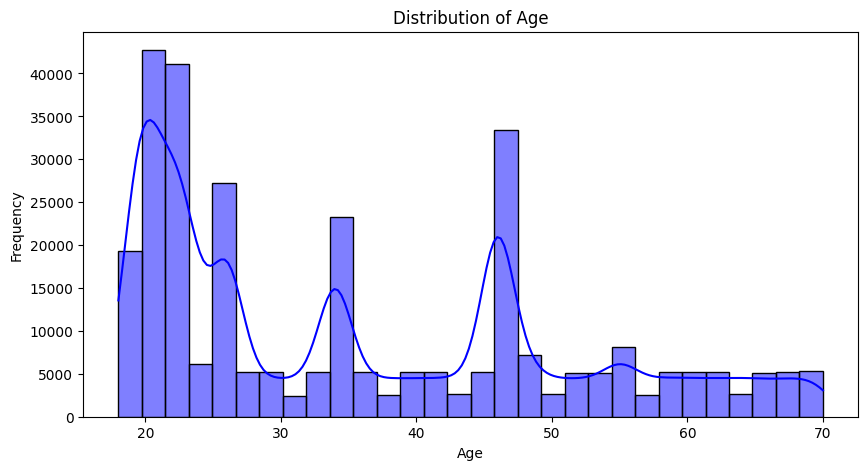

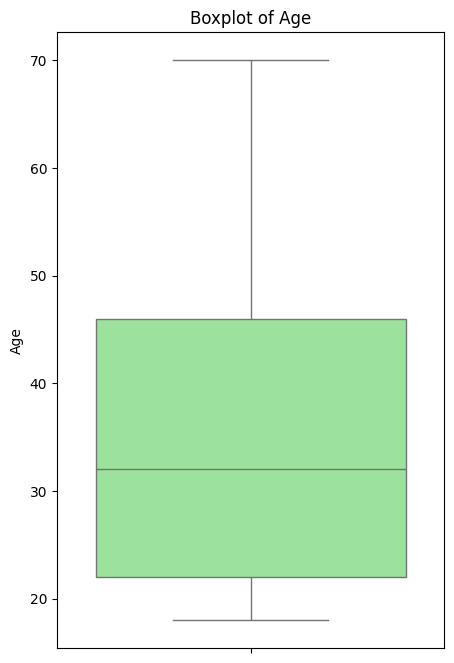

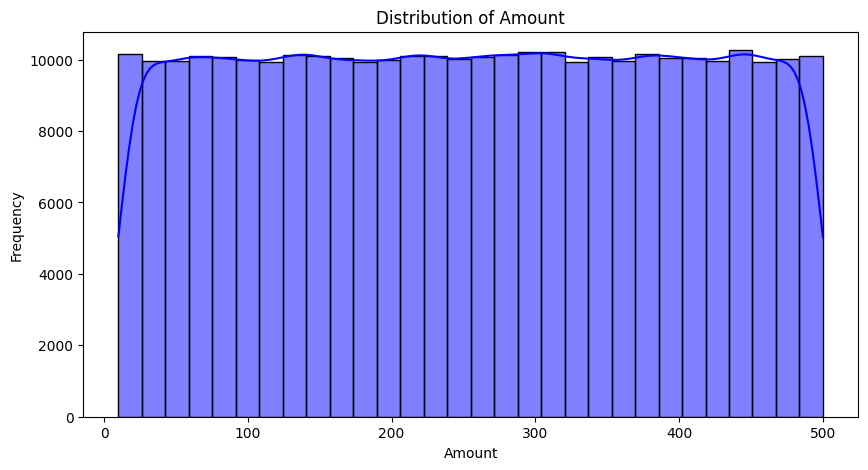

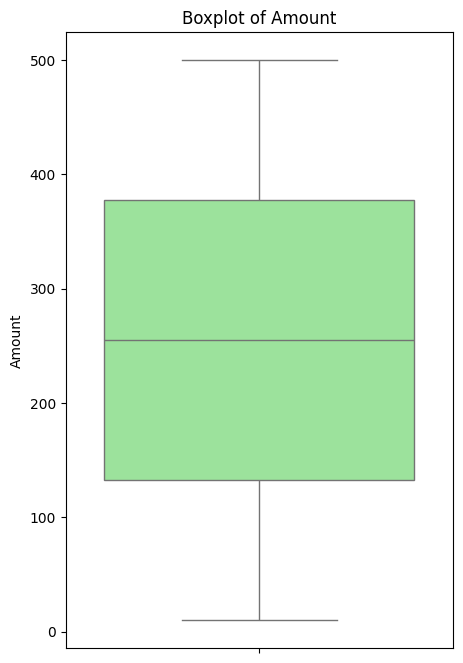

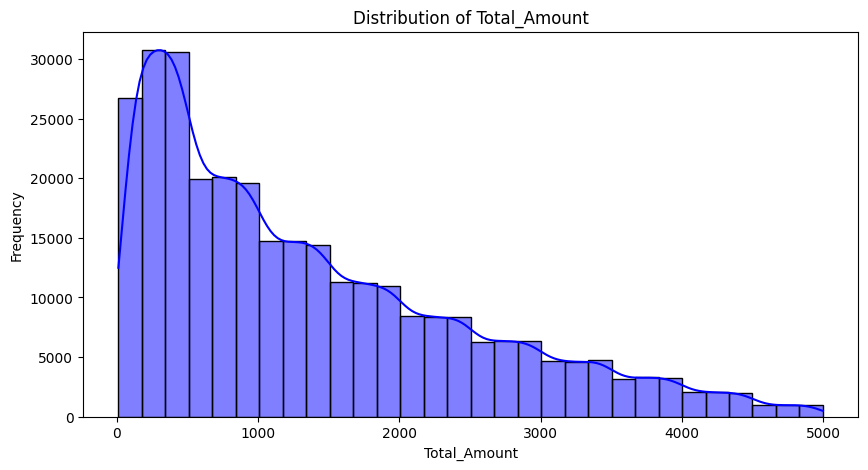

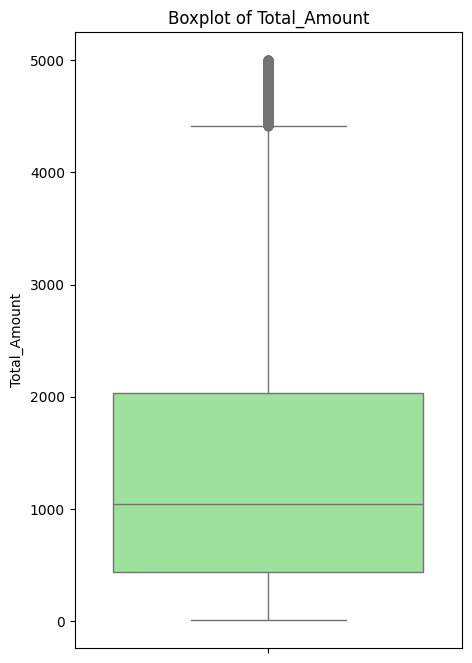

In [ ]:
# Numerical columns
num_col = ['Age', 'Amount', 'Total_Amount']

for col in num_col:
    plt.figure(figsize=(10,5))

    # Histogram + KDE
    sns.histplot(df[col], kde=True, bins=30, color='blue', palette='Set1' , edgecolor='black')
    plt.title(f"Distribution of {col}")
    plt.xlabel(col)
    plt.ylabel("Frequency")
    plt.show()

    # Boxplot for outliers
    plt.figure(figsize=(5,8)) # Adjusted figure size for vertical boxplot
    sns.boxplot(y=df[col], color="lightgreen") # Changed x to y for vertical orientation
    plt.title(f"Boxplot of {col}")
    plt.ylabel(col) # Changed xlabel to ylabel
    plt.show()

## C. Visualizing the discrete numerical variables

* Visualizing the Total_Purchases distributions
* Visualizing the Ratings cost distributions

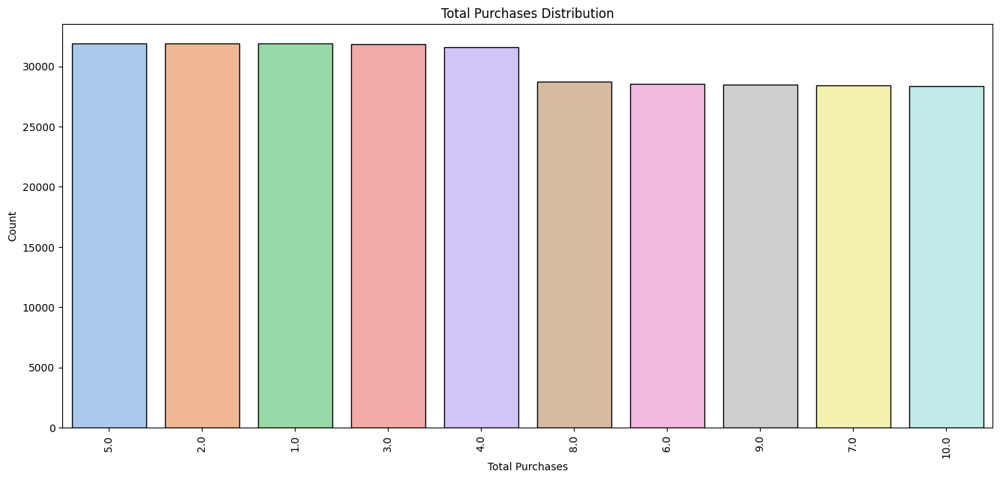

In [ ]:
# Visualizing the Total_Purchases distributions

plt.figure(figsize = (16,7))
sns.barplot(df['Total_Purchases'].value_counts() , palette = 'pastel' , edgecolor = 'black' , order = df['Total_Purchases'].value_counts().index)

plt.title('Total Purchases Distribution')
plt.xlabel('Total Purchases')
plt.ylabel('Count')
plt.xticks(rotation = 90)
plt.grid(False)
plt.show()

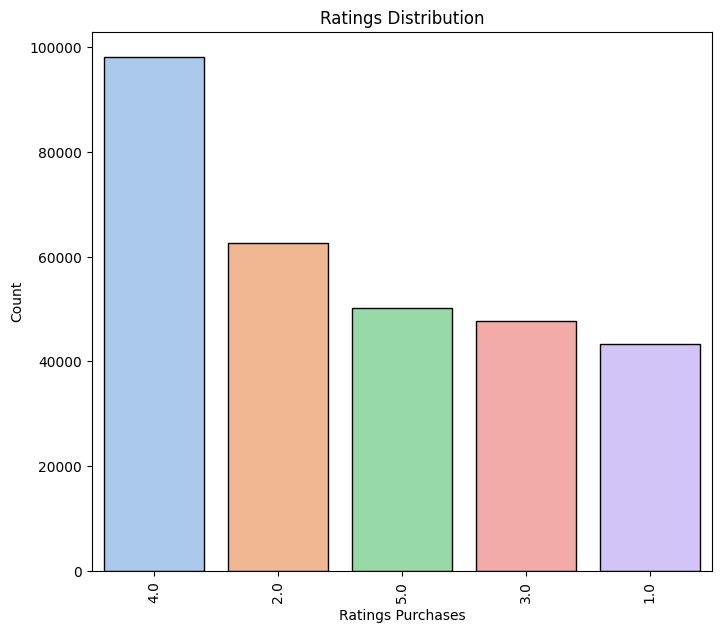

In [ ]:
# Visualizing the ratings distributions

plt.figure(figsize = (8,7))
sns.barplot(df['Ratings'].value_counts() , palette = 'pastel' , edgecolor = 'black' , order = df['Ratings'].value_counts().index)

plt.title('Ratings Distribution')
plt.xlabel('Ratings Purchases')
plt.ylabel('Count')
plt.xticks(rotation = 90)
plt.grid(False)
plt.show()

# 7. Exploratory Data Analysis - Univariate Analysis of Categorical Variables
* Visualizing Categorical Variables using Countplot and Pie Chart
* Analysis of Categorical Variables Trends

## A. Visualization Using Countplot and Pie Chart

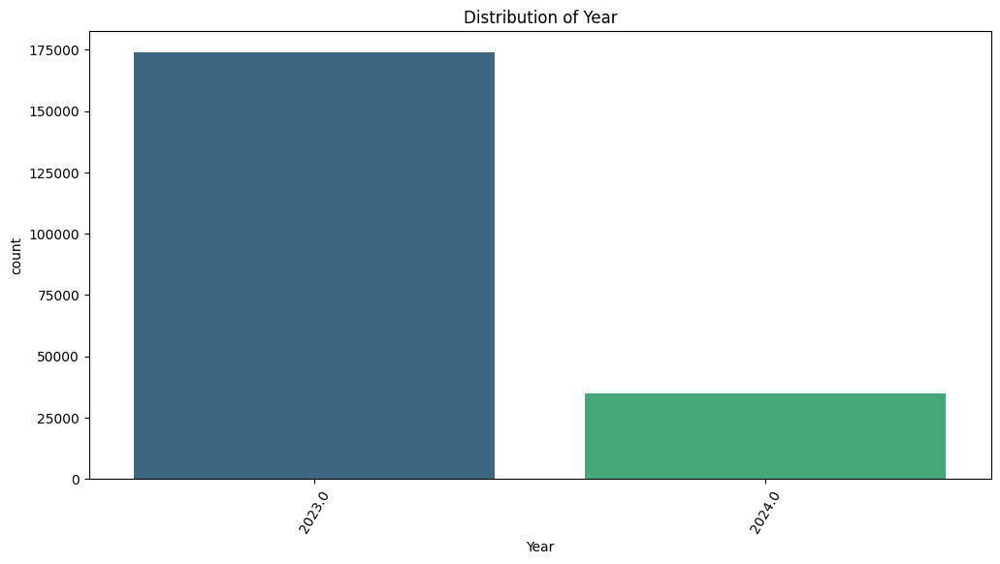

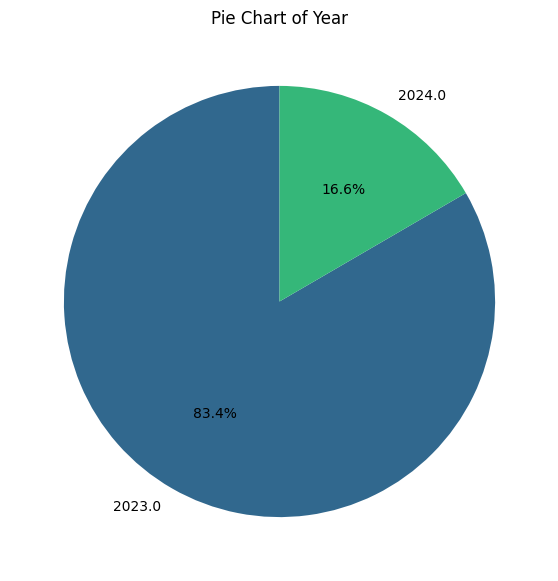

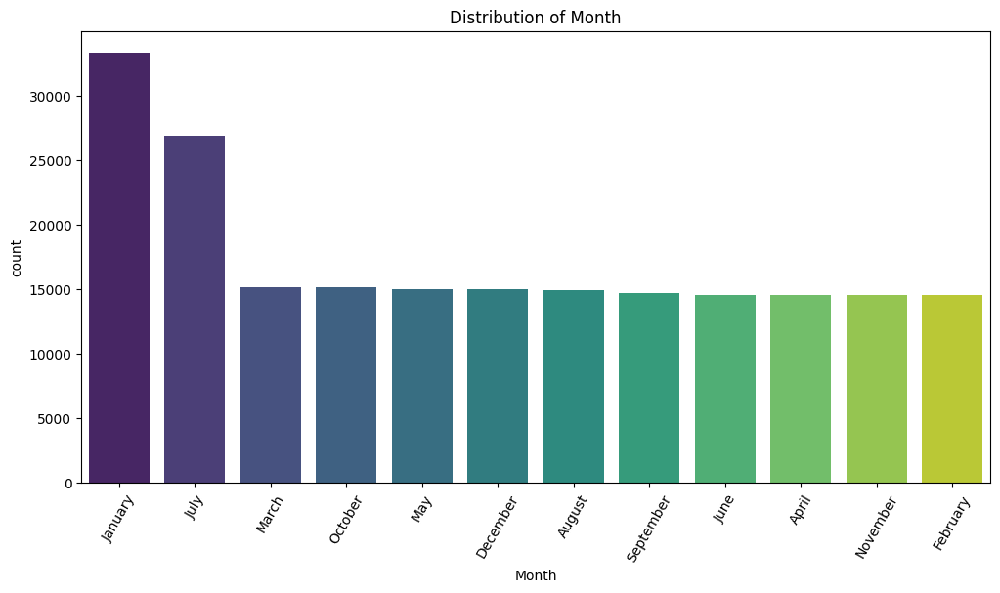

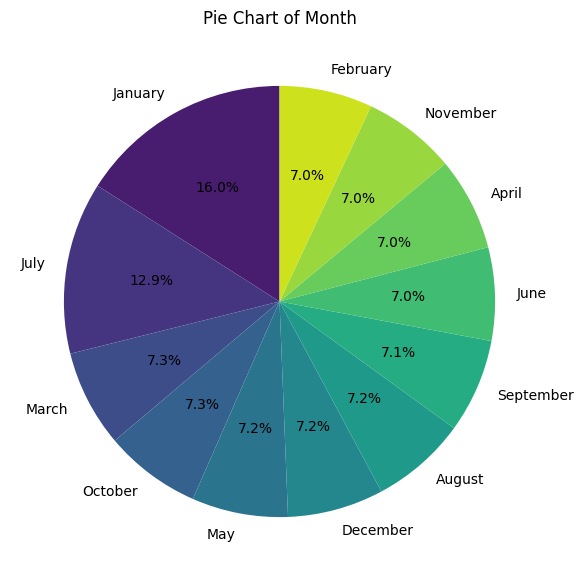

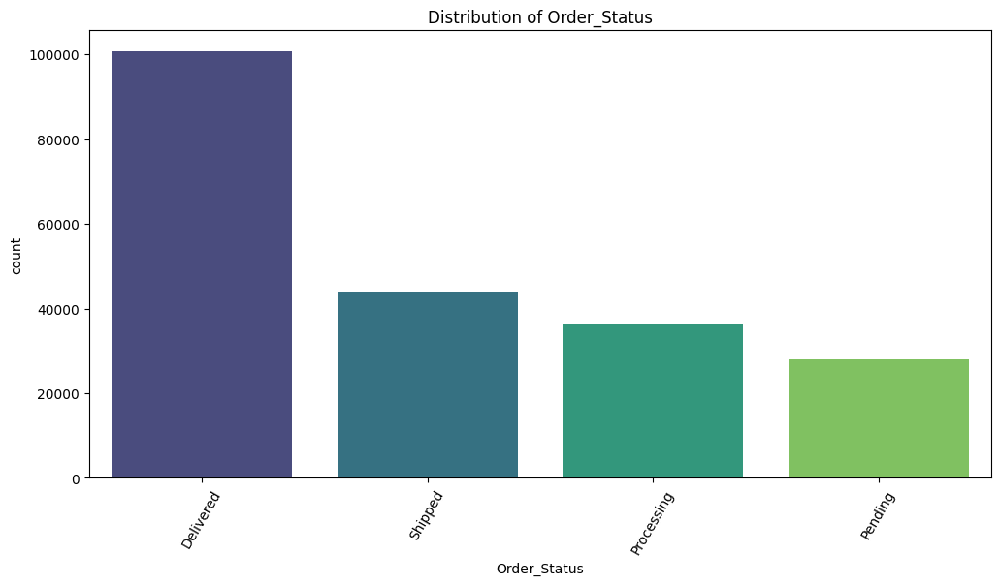

...

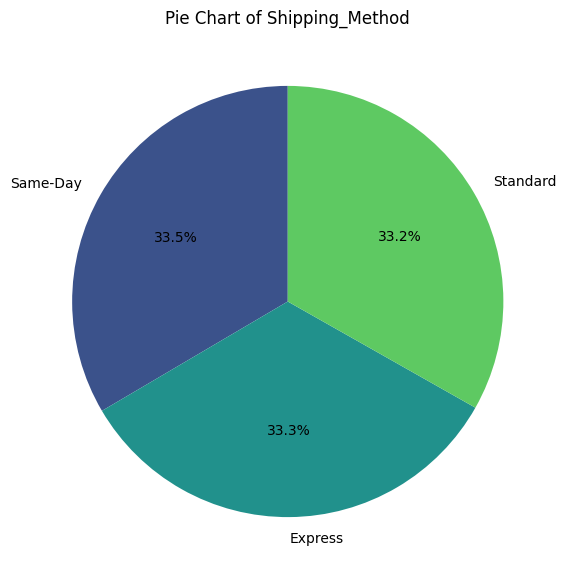

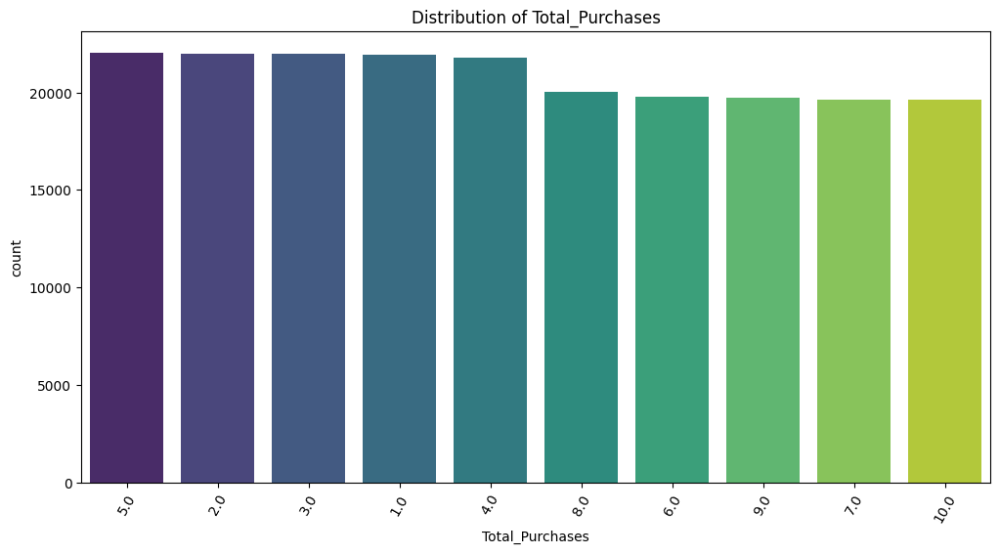

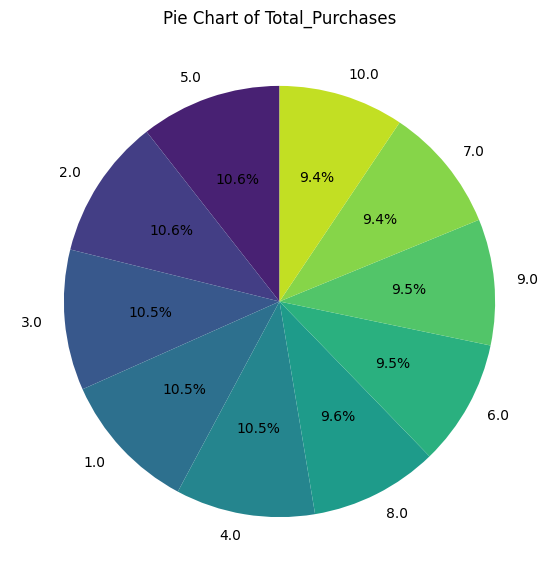

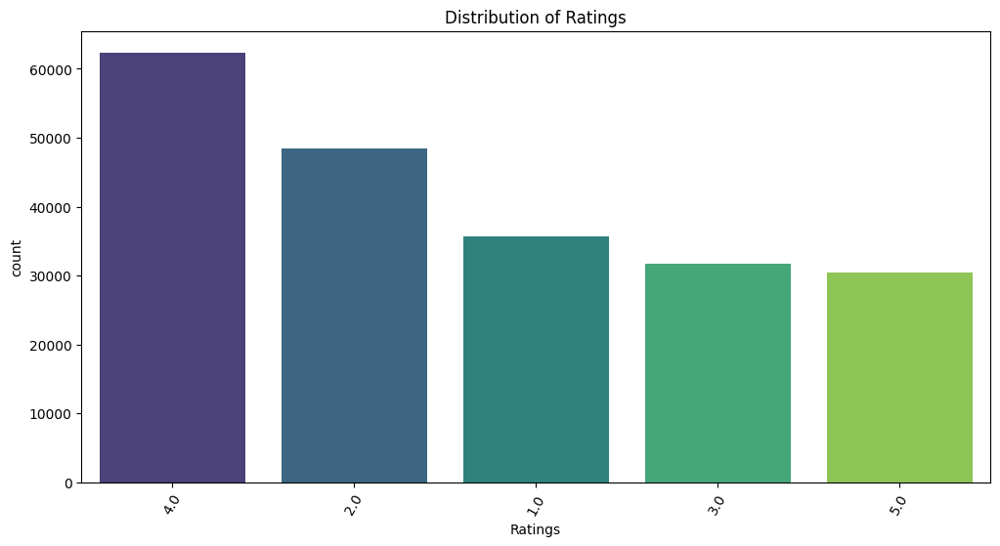

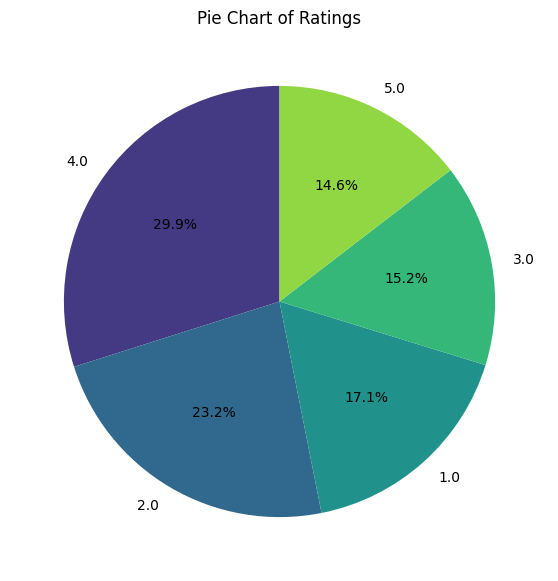

In [ ]:
cat_col = [
    'Year', 'Month', 'Order_Status', 'Product_Category','Product_Brand',
    'Payment_Method', 'Shipping_Method','Total_Purchases','Ratings'
]

for col in cat_col:
    # --- Countplot ---
    plt.figure(figsize=(12,6))
    sns.countplot(x=df[col], order=df[col].value_counts().index, palette='viridis')
    plt.title(f"Distribution of {col}")
    plt.xticks(rotation=60)
    plt.show()

    # --- Pie chart ---
    counts = df[col].value_counts()

    plt.figure(figsize=(7,7))
    plt.pie(
        counts,
        labels=counts.index,
        autopct='%1.1f%%',
        startangle=90,
        colors=sns.color_palette("viridis", len(counts))
    )
    plt.title(f"Pie Chart of {col}")
    plt.show()


## B. Analysis of Categorical Variables Trends

*Order Status*

* Business has a strong delivery rate, but almost half of transactions are stuck in pre-delivery stages
* Pending + Processing orders might lead to revenue loss
* Delivered orders being high suggests good trust in the platform, but operational improvements can unlock more revenue

*Product Category*
* Grocery dominates
* To sustain Grocery,push combo offers & loyalty program and provide offers like free delivery
* For Clothing, Books, Home Decor (Lifestyle categories) drive personalized recommendations


*Product Brand*
* Pepsi has the largest share
* Whirlpool has the lowest share
* Customer attention is evenly distributed across multiple brands
* Whirlpool might need to push for discounts more and invest in creating advanced sleek designed appliances for new generation

*Payment Methods*

* Evenly distributed

*Shipping Methods*
* company needs to maintain equal logistics capacity for all three methods

*Total purchases*
* Most people purchases in the range of 1-5
*  Implement targeted marketing campaigns. For customers in the 2.0-4.0 tiers, recommend products that complement their previous purchases
* Take a look at the products with High purchase size


*Ratings*
* The significant finding is that the vast majority of customers are happy. Combined, the 4-star and 5-star ratings make up nearly two-thirds (45%) of all reviews
* However a major chunk is unhappy about 40%(1-star 2-star  ratings)
* Taking note of the pain-point of customers is required and adviced
* Observe whether the dissatisfied customer are regular buyers

# 8. Exploratory Data Analysis - Bivariate Analysis
* Understand correlation between numerical features(Age',  'Total_Purchases', 'Amount', 'Total_Amount', 'Ratings')

* Utility Functions for chi-square analysis and contingency table and categorical feature visualization( stacked bar, grouped bar, heat map)
* Age-group wise analysis of different features
* Feedback wise total revenue analysis
* Product band analysis based on gender
* Product category and revenue analysis based on income level
* Understanding relation between shipping method and order status
* Total revenue analysis based on product brand
* Top and bottom 10 cities based on revenue
* Total revenue analysis based on country
* Average Order Value relation with other KPIs


## A. Numerical vs Numerical Variable

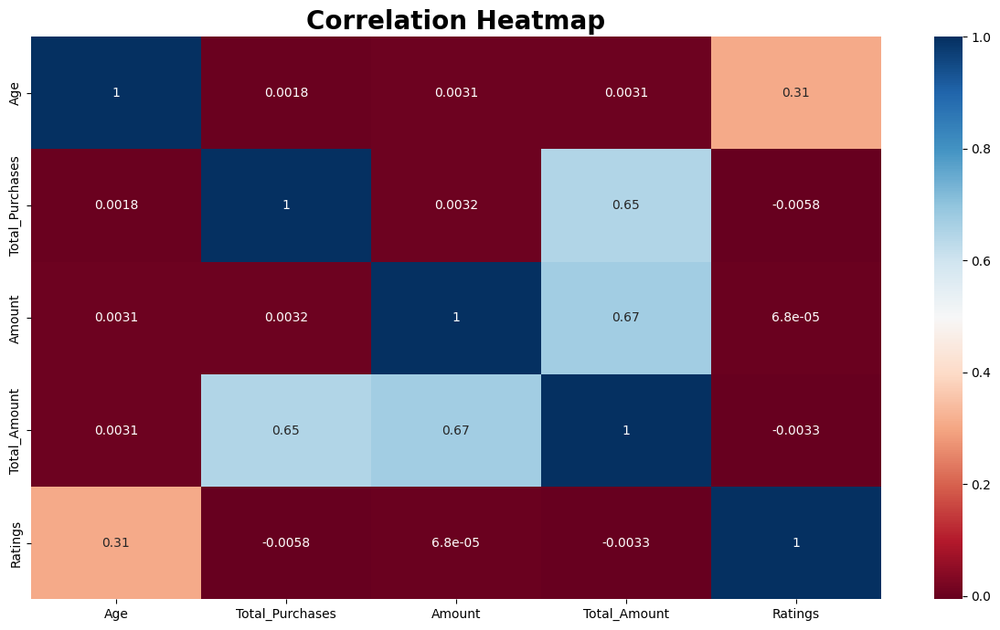

In [ ]:
columns = ['Age',  'Total_Purchases', 'Amount', 'Total_Amount', 'Ratings']


plt.figure(figsize=(15, 8))
sns.heatmap(df[columns].corr(method='pearson') , annot = True , cmap = 'RdBu')

plt.title('Correlation Heatmap', fontsize=20, fontweight='bold')
plt.show()

**Analysis:**
1) Total_Amount and Total_Purchases have strong co-relation (0.65)

* More purchases mean more amount
* Expexted , but shows repeated customers are key driver of revenue

2)Age vs Ratings → 0.31 (weak positive)

* Mild trend that older customers may leave slightly higher ratings.
* But the relationship is not that strong → customer satisfaction is not strongly age-dependent.

3)Ratings vs Purchases/Amount (≈ 0)


* No meaningful correlation.

* High spenders don’t necessarily give higher ratings.

* Customer satisfaction is independent of how much they spend.

4)Age vs Purchases/Amount (≈ 0)  
*  Age doesn’t strongly influence number of purchases or amount spent.

**Insights:**
1)Revenue drivers:

* Customers with higher purchase frequency and larger basket sizes are your most valuable segment.

* Focus retention strategies on these groups (loyalty programs, personalized offers).

2)Customer satisfaction:

* Since ratings don’t correlate with spend, OmniMart must treat service quality separately from sales.













## B. Utility Function for ANOVA test , bar plot, box plot, Chi Square Analysis & Visualization of Categorical Variables

In [ ]:

import matplotlib.pyplot as plt
import seaborn as sns

def create_barplot(data, x, y, order=None, palette='viridis', figsize=(10, 6),
                  title=None, xlabel=None, ylabel=None, rotation=45, grid=False):
    """
    Create a customized bar plot using seaborn.

    Parameters:
    data (DataFrame): The DataFrame containing the data
    x (str): Column name for x-axis
    y (str): Column name for y-axis
    order (list): Order of categories on x-axis
    palette (str): Color palette name
    figsize (tuple): Figure size (width, height)
    title (str): Plot title
    xlabel (str): X-axis label
    ylabel (str): Y-axis label
    rotation (int): Rotation angle for x-axis labels
    grid (bool): Whether to show grid
    """
    plt.figure(figsize=figsize)

    # Create the bar plot
    ax = sns.barplot(data=data, x=x, y=y, order=order, palette=palette)

    # Set title and labels
    if title:
        plt.title(title)
    if xlabel:
        plt.xlabel(xlabel)
    if ylabel:
        plt.ylabel(ylabel)

    # Customize appearance
    plt.grid(grid)
    plt.xticks(rotation=rotation)

    # Adjust layout
    plt.tight_layout()
    plt.show()

    return ax




In [ ]:
import pandas as pd
import scipy.stats as stats

def anova_test(df, numeric_col, categorical_col, alpha=0.05):
    """
    Perform One-Way ANOVA between a numeric dependent variable
    and a categorical independent variable.

    Parameters:
    -----------
    df : pandas.DataFrame
        Input dataframe
    numeric_col : str
        Name of the numeric column (dependent variable)
    categorical_col : str
        Name of the categorical column (independent variable)
    alpha : float (default=0.05)
        Significance level

    Returns:
    --------
    dict with F-statistic, p-value, and conclusion
    """

    # Step 1: Group numeric data by categories
    groups = [
        group[numeric_col].dropna().values
        for name, group in df.groupby(categorical_col, observed=False)
    ]

    # Step 2: Perform One-Way ANOVA
    f_stat, p_value = stats.f_oneway(*groups)

    # Step 3: Conclusion
    if p_value <= alpha:
        conclusion = (f"Reject the null hypothesis: "
                      f"There is a significant difference in {numeric_col} "
                      f"across levels of {categorical_col}.")
    else:
        conclusion = (f"Fail to reject the null hypothesis: "
                      f"No significant difference in {numeric_col} "
                      f"across levels of {categorical_col}.")

    return {
        "F-statistic": round(f_stat, 4),
        "p-value": round(p_value, 6),
        "conclusion": conclusion
    }


In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

def create_barplot(df, cat_col, num_col):
    """
    Plots average values of a numeric feature grouped by a categorical feature.

    Parameters:
        df (pd.DataFrame): Input dataframe
        cat_col (str): Categorical column name
        num_col (str): Numeric column name
    """
    plt.figure(figsize=(20, 7))
    sns.barplot(
        x=df.groupby(cat_col)[num_col].mean().sort_values(ascending=False).index,
        y=df.groupby(cat_col)[num_col].mean().sort_values(ascending=False).values,
        palette='coolwarm',
        edgecolor='black'
    )

    plt.title(f'Average {num_col} per {cat_col}')
    plt.xlabel(cat_col)
    plt.ylabel(f'Average {num_col}')
    plt.xticks(rotation=90)
    plt.grid(False)
    plt.show()


In [ ]:
import pandas as pd
import numpy as np
import scipy.stats as stats
from scipy.stats import chi2_contingency
import seaborn as sns
import matplotlib.pyplot as plt

def chi_square_analysis(df, cat_var1, cat_var2, bins=None, labels=None, alpha=0.05, figsize=(12, 6)):
    """
    Perform chi-square test of independence with comprehensive analysis and visualizations.

    Parameters:
    df (DataFrame): The DataFrame containing the data
    cat_var1 (str): First categorical variable (will be binned if numeric)
    cat_var2 (str): Second categorical variable
    bins (list): Bin edges for discretization (if cat_var1 is numeric)
    labels (list): Labels for bins (if cat_var1 is numeric)
    alpha (float): Significance level
    figsize (tuple): Figure size for plots
    """

    # Create a copy to avoid modifying original dataframe
    df_clean = df.dropna(subset=[cat_var1, cat_var2]).copy()

    # Check if first variable is numeric and needs binning
    if pd.api.types.is_numeric_dtype(df_clean[cat_var1]) and bins is not None and labels is not None:
        df_clean[f'{cat_var1}_category'] = pd.cut(df_clean[cat_var1], bins=bins, labels=labels, include_lowest=True)
        var1_display = f'{cat_var1}_category'
    else:
        var1_display = cat_var1

    # 1. Create Contingency Table
    contingency_table = pd.crosstab(df_clean[var1_display], df_clean[cat_var2],
                                   margins=True, margins_name="Total")

    print("CONTINGENCY TABLE (Frequency Counts)")
    print("=" * 50)
    print(contingency_table)
    print("\n" + "=" * 50 + "\n")

    # 2. Create Heatmap Visualization
    plt.figure(figsize=figsize)
    sns.heatmap(contingency_table.iloc[:-1, :-1],
                annot=True, fmt='d', cmap='Blues',
                linewidths=.5, cbar_kws={'label': 'Frequency'})
    plt.title(f'Contingency Table: {var1_display} vs {cat_var2}', fontsize=16, fontweight='bold')
    plt.xlabel(cat_var2)
    plt.ylabel(var1_display)
    plt.tight_layout()
    plt.show()

    # 3. Perform Chi-Square Test
    observed = contingency_table.iloc[:-1, :-1].values
    chi2, p_value, dof, expected = chi2_contingency(observed)

    print("CHI-SQUARE TEST RESULTS")
    print("=" * 50)
    print(f"Chi-Square Statistic: {chi2:.4f}")
    print(f"P-value: {p_value:.10f}")
    print(f"Degrees of Freedom: {dof}")
    print(f"Sample Size: {observed.sum()}")
    print("\n")

    # 4. Interpret Results
    print("INTERPRETATION:")
    print("-" * 50)
    if p_value <= alpha:
        print(f"✓ REJECT the null hypothesis (p = {p_value:.4f} ≤ α = {alpha})")
        print(f"  There is a statistically significant association between {var1_display} and {cat_var2}.")
    else:
        print(f"✗ FAIL TO REJECT the null hypothesis (p = {p_value:.4f} > α = {alpha})")
        print(f"  There is NO statistically significant association between {var1_display} and {cat_var2}.")
    print("\n" + "=" * 50 + "\n")

    # 5. Calculate Cramer's V
    n = observed.sum()
    min_dim = min(observed.shape) - 1
    cramers_v = np.sqrt(chi2 / (n * min_dim)) if min_dim > 0 else 0

    print("MEASURE OF ASSOCIATION STRENGTH")
    print("=" * 50)
    print(f"Cramer's V: {cramers_v:.4f}")
    print("\nCramer's V Interpretation:")
    print("-" * 50)
    if cramers_v > 0.25:
        print("✓ Very Strong Association")
    elif cramers_v > 0.15:
        print("✓ Strong Association")
    elif cramers_v > 0.10:
        print("✓ Moderate Association")
    elif cramers_v > 0.05:
        print("✓ Weak Association")
    else:
        print("✗ Little to No Association")






In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

def visualize_categorical_relationship(df, cat_var1, cat_var2, colors=None, figsize=(16, 12)):
    """
    Create comprehensive visualizations for the relationship between two categorical variables.

    Parameters:
    df (DataFrame): The DataFrame containing the data
    cat_var1 (str): First categorical variable (will be on x-axis)
    cat_var2 (str): Second categorical variable (will be used for coloring)
    colors (list): Color palette for the categories
    figsize (tuple): Figure size for the main plot
    """

    # Clean data
    df_clean = df.dropna(subset=[cat_var1, cat_var2]).copy()

    # Create contingency tables
    contingency_table = pd.crosstab(df_clean[cat_var1], df_clean[cat_var2])
    contingency_table_norm = pd.crosstab(df_clean[cat_var1], df_clean[cat_var2], normalize='index') * 100

    # Get unique categories for coloring
    if colors is None:
        colors = ['#FF6B6B', '#FFD166', '#06D6A0', '#118AB2', '#073B4C', '#8338EC', '#FB5607', '#3A86FF']

    # Create the main figure with subplots
    fig = plt.figure(figsize=figsize)

    # 1. STACKED BAR CHART - Counts
    plt.subplot(2, 2, 1)
    bottom = np.zeros(len(contingency_table))
    for i, category in enumerate(contingency_table.columns):
        color = colors[i % len(colors)]  # Cycle through colors if needed
        counts = contingency_table[category]
        plt.bar(contingency_table.index, counts, bottom=bottom,
                label=category, color=color, alpha=0.8, edgecolor='white', linewidth=0.5)
        bottom += counts

    plt.title(f'Stacked Bar: {cat_var1} vs {cat_var2} (Counts)', fontsize=14, fontweight='bold')
    plt.xlabel(cat_var1)
    plt.ylabel('Count')
    plt.legend(title=cat_var2, bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.xticks(rotation=45, ha='right')

    # 2. STACKED BAR CHART - Percentages
    plt.subplot(2, 2, 2)
    bottom = np.zeros(len(contingency_table_norm))
    for i, category in enumerate(contingency_table_norm.columns):
        color = colors[i % len(colors)]
        percentages = contingency_table_norm[category]
        plt.bar(contingency_table_norm.index, percentages, bottom=bottom,
                label=category, color=color, alpha=0.8, edgecolor='white', linewidth=0.5)
        bottom += percentages

    plt.title(f'Stacked Bar: {cat_var1} vs {cat_var2} (%)', fontsize=14, fontweight='bold')
    plt.xlabel(cat_var1)
    plt.ylabel('Percentage (%)')
    plt.legend(title=cat_var2, bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.xticks(rotation=45, ha='right')

    # 3. HEATMAP - Normalized percentages
    plt.subplot(2, 2, 3)
    sns.heatmap(contingency_table_norm, annot=True, fmt='.1f', cmap='YlOrRd',
                cbar_kws={'label': 'Percentage (%)'}, linewidths=0.5)
    plt.title(f'Heatmap: {cat_var1} vs {cat_var2} (%)', fontsize=14, fontweight='bold')
    plt.xlabel(cat_var2)
    plt.ylabel(cat_var1)
    plt.xticks(rotation=45, ha='right')

    # 4. GROUPED BAR CHART - Counts
    plt.subplot(2, 2, 4)
    x = np.arange(len(contingency_table.index))
    width = 0.8 / len(contingency_table.columns)  # Dynamic width based on number of categories

    for i, category in enumerate(contingency_table.columns):
        color = colors[i % len(colors)]
        offset = width * (i - len(contingency_table.columns)/2 + 0.5)
        plt.bar(x + offset, contingency_table[category], width,
                label=category, color=color, alpha=0.8, edgecolor='white', linewidth=0.5)

    plt.title(f'Grouped Bar: {cat_var1} vs {cat_var2} (Counts)', fontsize=14, fontweight='bold')
    plt.xlabel(cat_var1)
    plt.ylabel('Count')
    plt.xticks(x, contingency_table.index, rotation=45, ha='right')
    plt.legend(title=cat_var2, bbox_to_anchor=(1.05, 1), loc='upper left')

    plt.tight_layout()
    plt.show()



## C. Genaration wise Analysis with Other Features

### Generation wise Total Revenue

In [ ]:
anova_test(df,'Total_Amount','Generation')

{'F-statistic': np.float64(0.4989),
 'p-value': np.float64(0.683007),
 'conclusion': 'Fail to reject the null hypothesis: No significant difference in Total_Amount across levels of Generation.'}

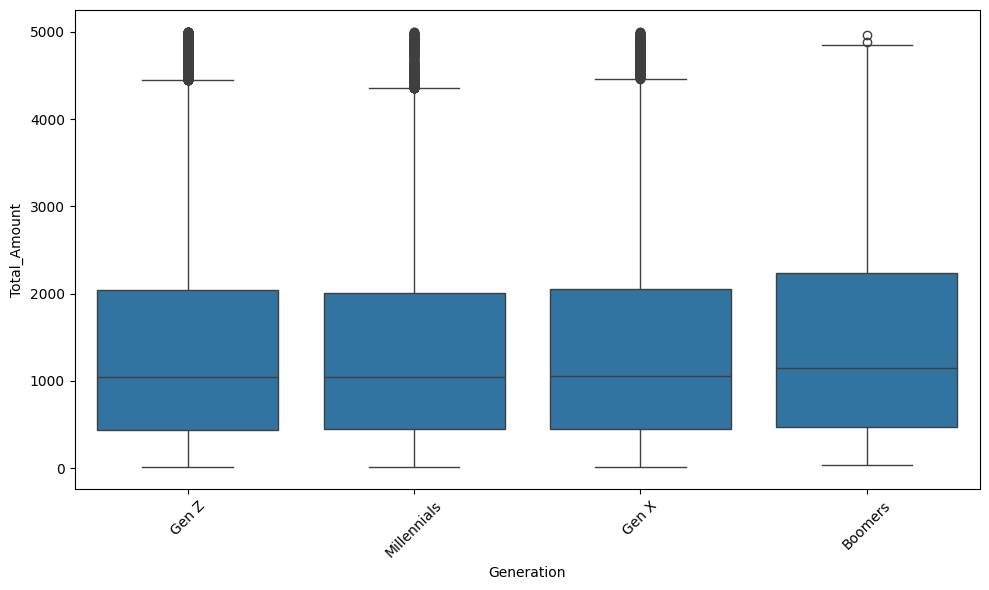

<Axes: xlabel='Generation', ylabel='Total_Amount'>

In [ ]:
create_boxplot(df, 'Generation', 'Total_Amount')

### Analysis
Median (middle line of the box):

* Gen Z, Millennials, and Gen X have similar medians (~1,000).

* Boomers have a slightly higher median (~1,100+).

→  Boomers generally spend more per person compared to other groups.

Interquartile Range (IQR = box height, from Q1 to Q3):

* IQR (middle 50% of spending) is roughly between ~500 and ~2,000 for all groups.

* Boomers’ IQR seems slightly higher, meaning they have more variability in spending habits.

Spread (whiskers = range without outliers):

* Gen Z, Millennials, and Gen X max out around ~4,400–4,500.

* Boomers extend a bit further, close to ~4,800–5,000.

→ Boomers have the largest spread, showing a broader range of spending behaviors.

Outliers (dots above whiskers):

* All groups have outliers, i.e., individuals who spend far more than the rest.

* Boomers show fewer but higher-value outliers, whereas younger groups (Gen Z, Millennials) have more frequent moderate outliers.

Outliers indicate “big spenders” or premium customers.

### Insights
1) Boomers Are Higher Median and Wider Range Spenders, Boomers can be premium customers.

2) younger customers already behave similarly to older generations in spending.

3) Outliers Represent VIP / High-Value Customers

Across all generations, there are customers spending well above the norm.

Businesses should identify these “VIP” segments (via loyalty programs, exclusive deals, or personalized offers) since they contribute disproportionately to revenue.


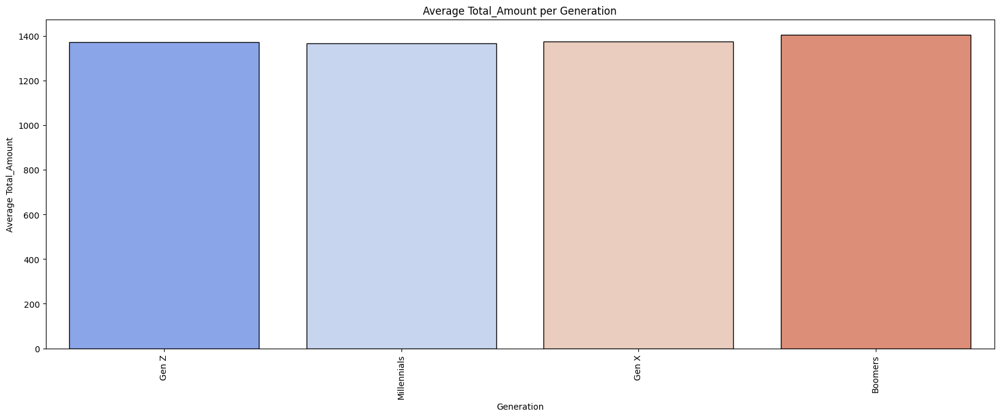

In [ ]:
create_barplot(df, 'Generation', 'Total_Amount')

### Analysis:
1) Avg Total_Amount per trasnctionid is about uniform across all generation.
Gen Z:1,380

Millennials:1,370

Gen X:1,380

Boomers:1,405

2) Spending power is same all over the generations



### Insights:
1) Multi-generational campaigns are effective since spending levels are close.

2) Boomers spend slightly higher spending than younger generations.

Implication: Businesses could tailor premium products/services or loyalty programs for Boomers, as they may be willing to spend more per transaction.


### Generation wise Purchase_Frequency

In [ ]:
anova_test(df,'Total_Purchases','Generation')

{'F-statistic': np.float64(0.2515),
 'p-value': np.float64(0.860331),
 'conclusion': 'Fail to reject the null hypothesis: No significant difference in Total_Purchases across levels of Generation.'}

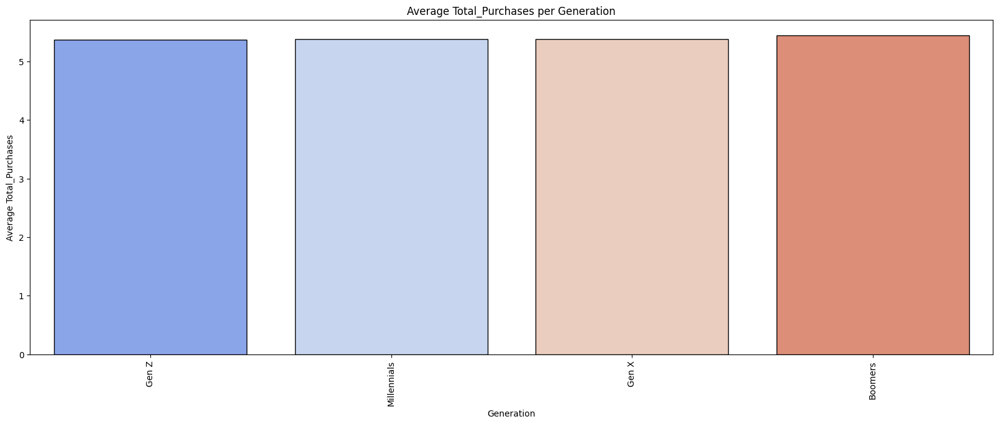

In [ ]:
create_barplot(df, 'Generation', 'Total_Purchases')

### Analysis
Number of Purchases is Consistent Across Generations ( about 5)


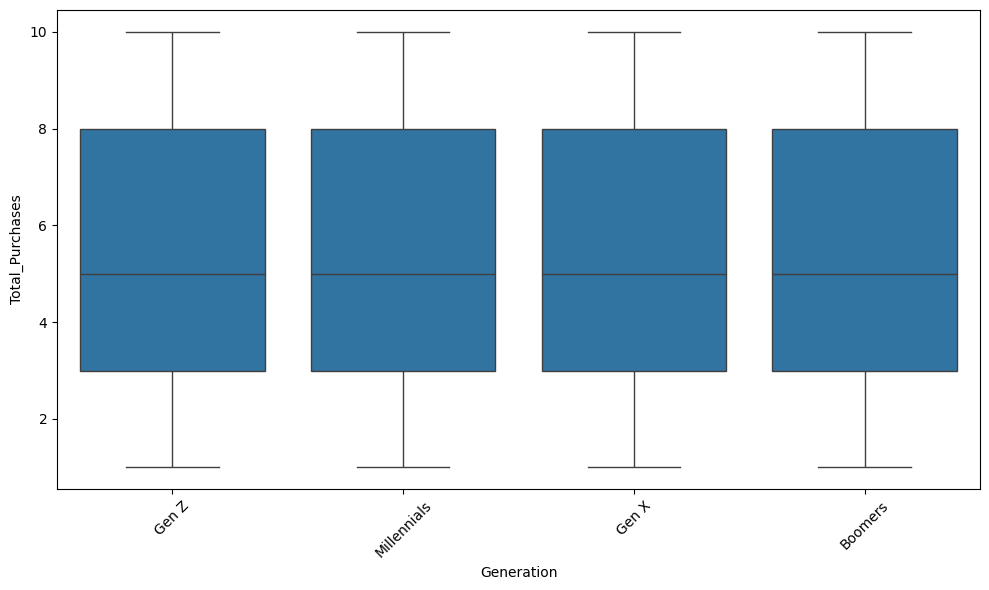

<Axes: xlabel='Generation', ylabel='Total_Purchases'>

In [ ]:
create_boxplot(df, 'Generation', 'Total_Purchases')

### Analysis
Median (middle line in the box):

* All generations (Gen Z, Millennials, Gen X, Boomers) have the same median at ~5 purchases.

→ Indicates that across generations, customers make about the same number of purchases.

Interquartile Range (IQR = box height, Q1–Q3):

* For all groups, IQR is ~3 to ~8 purchases.

→ 50% of customers, regardless of generation, make between 3 and 8 purchases.

The distribution is consistent across groups, with no major generational differences.

* Spread (whiskers = range without outliers):

All generations show a similar spread: 1 to 10 purchases.

→ Suggests that the general purchase frequency behavior is stable across generations.

Outliers:

Unlike the spending boxplot, this chart shows no significant outliers. Uniform distribution

### Generation wise given Ratings analysis

In [ ]:
anova_test(df, 'Ratings', 'Generation')

{'F-statistic': np.float64(8801.5188),
 'p-value': np.float64(0.0),
 'conclusion': 'Reject the null hypothesis: There is a significant difference in Ratings across levels of Generation.'}

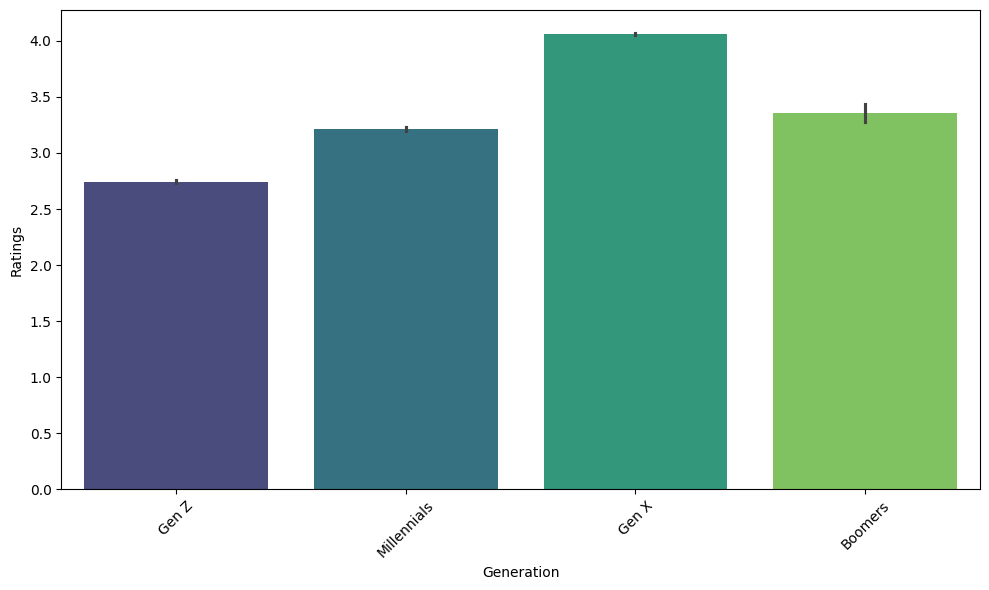

<Axes: xlabel='Generation', ylabel='Ratings'>

In [ ]:
create_barplot(df, 'Generation', 'Ratings')

### Analyse
1) Gen Z: Lowest average rating (~2.7). Suggests dissatisfaction or higher expectations compared to other groups.

2) Millennials: Average rating (~3.2). Slightly better than Gen Z but still below the global average.

3) Gen X: Highest average rating (~4.0). Indicates strong satisfaction and loyalty.

4) Boomers: Moderate satisfaction (~3.3). Higher than Gen Z and Millennials but lower than Gen X.



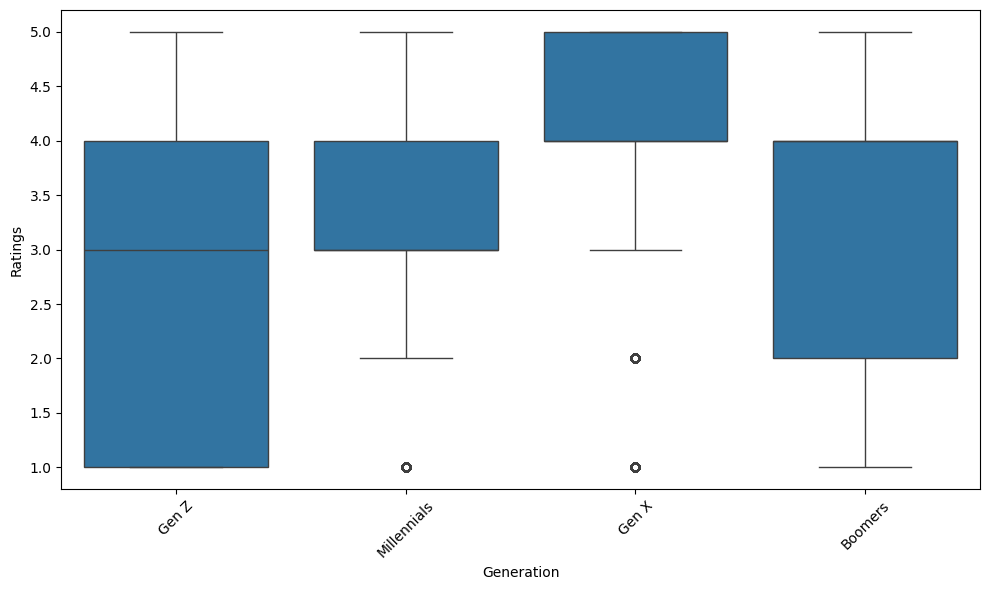

<Axes: xlabel='Generation', ylabel='Ratings'>

In [ ]:
create_boxplot(df, 'Generation', 'Ratings')

### Analysis:
1)Gen Z

* Mean Rating: ~2.Frankfurt ($11.5M) and Fort Worth ($6.5M) follow as the next significant markets, but they are much smaller than Portsmouth.7 (lowest among all groups).

* Distribution (Box Plot): Very wide spread (1–5). Polarized → some customers rate very high, many rate very low

 Inconsistent experience; this segment is dissatisfied on average, but still has a loyal subset.

Business Risk: High churn if pain points aren’t fixed.

Action: Improve service reliability, digital-first perks, and re-engagement campaigns.

2) Millennials

* Mean Rating: ~3.2 (moderate).

* Distribution: Concentrated between 2–4, fewer extremes compared to Gen Z.

Insight: Generally satisfied but not enthusiastic. They’re stable but not loyal yet.

Business Risk: Could be easily swayed by competitors.

Action: Focus on value-for-money offerings, loyalty programs, and personalized promotions.

3) Gen X

* Mean Rating: ~4.05 (highest of all).

* Distribution: Tight concentration at 4–5 → consistent satisfaction.

Insight: Strongly satisfied, dependable customers.

Business Opportunity: Act as brand promoters and advocates.

Action: Maintain quality, introduce VIP experiences, and leverage referral incentives.

4) Boomers

* Mean Rating: ~3.35 (second-best after Gen X).

* Distribution: Moderate spread (2–5). Mixed satisfaction, leaning positive.

Insight: Generally trust the brand but show some dissatisfaction.

Business Opportunity: With targeted support, can become a stable loyal base.

Action: Emphasize ease of use, trust-building communication, and excellent customer service.

# Insights
1) Gen Z (Lowest avg rating, highest variability)

Actions:

* Improve digital engagement (social media, gamified loyalty apps, influencer marketing).

* Personalize offerings with AI-driven recommendations.

* Offer fast, seamless service (quick delivery, easy returns).

2)  Millennials (Moderate ratings, stable but not enthusiastic)

Actions:

* Enhance value-for-money bundles and discounts.

* Strengthen loyalty rewards (points, cashback, exclusive perks).

* Focus on time-saving services (subscriptions, auto-replenishment).

3) Gen X (Highest ratings, consistent satisfaction)

* Already loyal but may be overlooked if focus shifts only to younger generations.

4)Cross-Generational Strategy

* Gen Z & Millennials: Focus on innovation, affordability, and digital-first experiences.

* Gen X & Boomers: Focus on trust, loyalty, and premium reliability.

* Consider segmented marketing campaigns → not “one-size-fits-all” but tailored messaging per generation.

### Age-group(Generation) wise Product-Brand analysis

CONTINGENCY TABLE (Frequency Counts)
Product_Brand  Adidas  Apple  Bed Bath & Beyond  Coca-Cola  HarperCollins  \
Generation                                                                  
Gen Z            5004   4802               4966       4896           4952   
Millennials       521    527                520        553            511   
Gen X            1315   1319               1304       1353           1362   
Boomers            47     42                 33         37             36   
Total            6887   6690               6823       6839           6861   

Product_Brand  Home Depot  IKEA  Nestle  Nike  Penguin Books  Pepsi  \
Generation                                                            
Gen Z                4909  4936    4873  4903           4894   4974   
Millennials           521   522     550   532            527  11461   
Gen X                1319  1279    1340  1298           1333   2350   
Boomers                40    35      33    41             34    137 

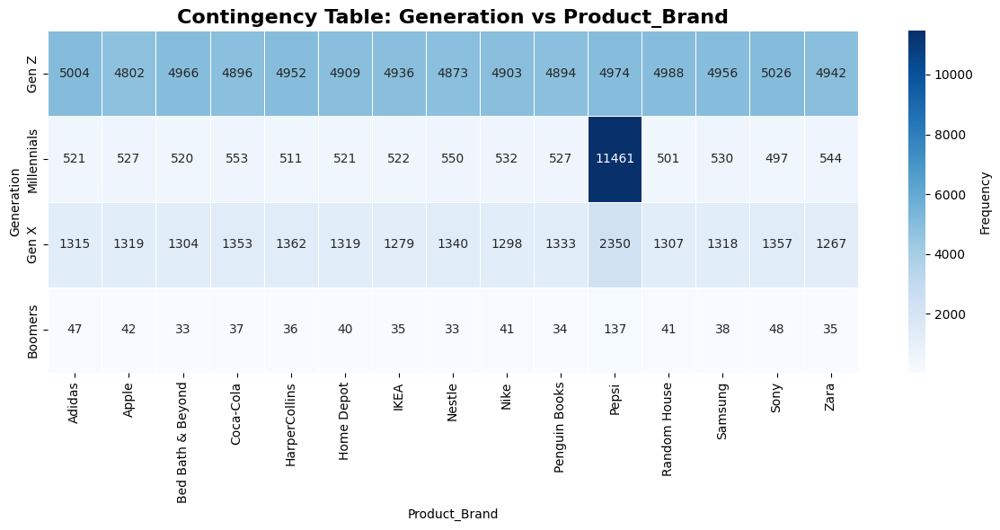

CHI-SQUARE TEST RESULTS
Chi-Square Statistic: 32432.7427
P-value: 0.0000000000
Degrees of Freedom: 42
Sample Size: 114336


INTERPRETATION:
--------------------------------------------------
✓ REJECT the null hypothesis (p = 0.0000 ≤ α = 0.05)
  There is a statistically significant association between Generation and Product_Brand.


MEASURE OF ASSOCIATION STRENGTH
Cramer's V: 0.3075

Cramer's V Interpretation:
--------------------------------------------------
✓ Very Strong Association


In [ ]:
 chi_square_analysis(
    df=df,
    cat_var1='Generation',
    cat_var2='Product_Brand',

    alpha=0.05,
    figsize=(12, 6)
)

### Analysis
1) Chi-Square Test

* χ² = 32432.74, p-value ≈ 0 → the association between Generation and Product Brand is highly significant.


2) Association Strength (Cramer’s V = 0.3075)

* 0.3075 = moderate to strong relationship in practical terms.

Means product brand preference depends meaningfully on generation.

3) Gen Z dominates most brands

*   Purchase frequency is 4800-500 over all brands, primary consumer acrosss all the brands.

4) Millennials spike with Pepsi around 12000

* For other brands the purchase frequency is 500-600

5) Gen X steady presence (around 1100-1200 across all brands) and a spike in pepsi (2300).

6) Boomers are minimal, and they also have a spike on pepsi

### Insights
1) Generational influence matters.

2) Gen Z is the key market driver. Brands should prioritize Gen Z with youth-oriented marketing, digital engagement, and trend-driven campaigns.

3) Pepsi has a unique generational pull. For Millennials (and to some extent Gen X and Boomers), Pepsi dominates.

4) Boomer strategy: Very low presence indicates low ROI on mass campaigns.

5) Instead of targeting every generation at once, try to segment it  and create strategies for each generation.





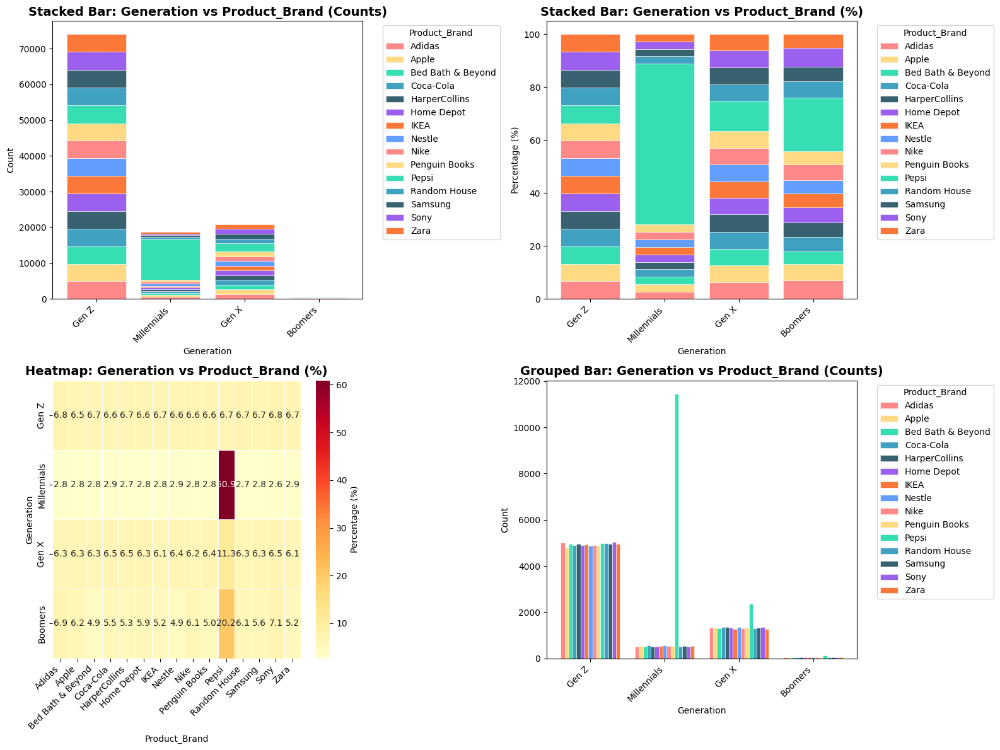

In [ ]:
visualize_categorical_relationship(df, 'Generation', 'Product_Brand')

### Analysis
1) **Stacked Bar (Counts) and (Percentage):**

Shows absolute purchase counts by Generation for each brand.

* Gen Z dominates → very high counts across almost all brands.Gen Z distribution is balanced  for every brand ~6–7% each

* Millennials spike → huge count for Pepsi compared to other brands.
Pepsi ~60% of all their purchases.

* Gen X steady → moderate levels across most brands, some preference for Pepsi.Pepsi ~11% share, others ~6%.

* Boomers minimal → tiny contribution overall.

2) **Grouped Bar (Counts):**
Direct comparison of brand counts within each generation.

* Gen Z shows near equal preference across brands (~5000 each).

 * Millennials show massive Pepsi bar vs tiny bars for other brands.

* Gen X shows mid-level engagement with all brands, slightly higher for Pepsi.

* Boomers negligible across all brands, no clear leader.

### Insights:
1)Gen Z is the  biggest, balanced market. Brands should treat Gen Z as the main growth driver.

2)Millennials = Pepsi loyalists. Pepsi should double down on Millennial-focused campaigns. Other brands must invest heavily to penetrate this segment.

3)Gen X = steady customers. Opportunities for upselling and retention campaigns, especially around Pepsi.

4)Boomers = smallest segment. ROI on broad campaigns low; consider niche premium targeting.

5)Segmentation is key. Pepsi has a generational monopoly with Millennials, while other brands share Gen Z and Gen X more evenly.




### Age-group(Generation) wise Product Category Analysis

CONTINGENCY TABLE (Frequency Counts)
Product_Category  Books  Clothing  Electronics  Grocery  Home Decor   Total
Generation                                                                 
Gen Z             14838     14838        14782    14731       14815   74004
Millennials        1542      1600         1557    12564        1565   18828
Gen X              3999      3881         3998     5039        3897   20814
Boomers             112       123          128      206         108     677
Total             20491     20442        20465    32540       20385  114323




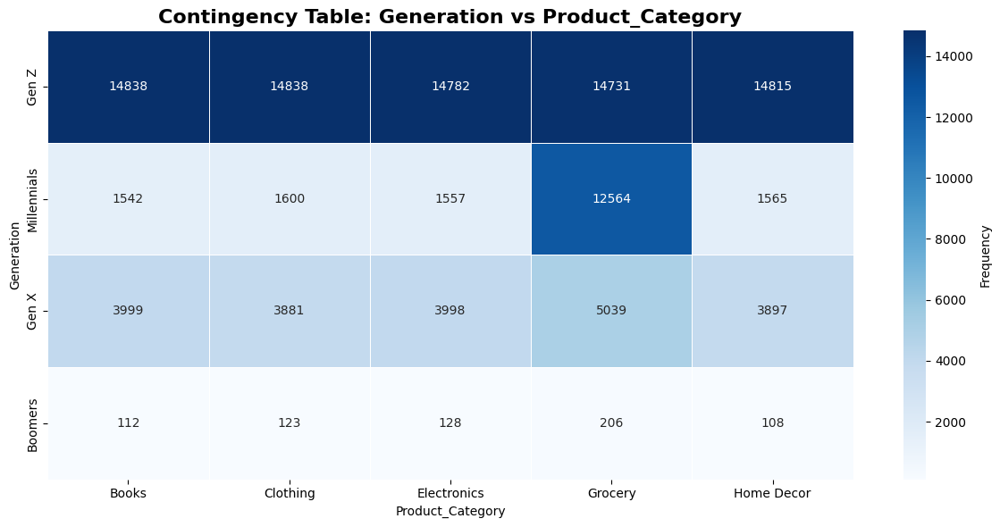

CHI-SQUARE TEST RESULTS
Chi-Square Statistic: 16394.3082
P-value: 0.0000000000
Degrees of Freedom: 12
Sample Size: 114323


INTERPRETATION:
--------------------------------------------------
✓ REJECT the null hypothesis (p = 0.0000 ≤ α = 0.05)
  There is a statistically significant association between Generation and Product_Category.


MEASURE OF ASSOCIATION STRENGTH
Cramer's V: 0.2186

Cramer's V Interpretation:
--------------------------------------------------
✓ Strong Association


In [ ]:
chi_square_analysis(
    df=df,
    cat_var1='Generation',
    cat_var2='Product_Category',

    alpha=0.05,
    figsize=(12, 6)
)

### Analysis
1)Significance

* χ² = 16,394, p ≈ 0 → strong evidence that generation influences product category preference.



2. Strength (Cramer’s V = 0.2186)



* 0.2186 = strong association, but weaker than  earlier Generation × Product Brand result (which was ~0.31).

* Interpretation: Generations clearly differ in their product category choices, but the effect is more moderate compared to brand-level preferences.


3)Gen Z

* Very high and balanced purchase frequency across all categories(~14,700–14,800) each.

* Gen Z is the largest and most diverse consumer group, engaging across all product categories without strong skew.

4)Millennials

* Relatively low engagement in most categories  (~1,500–1,600 each).

* Strong preference for Grocery (12,564), nearly 8x higher than other categories.

*Indicates category loyalty rather than brand loyalty in this generation.

5) Gen X

* Moderate engagement across all categories (~3,800–4,000).

* Slightly higher in Grocery (5,039) compared to others.

* Shows consistent but mid-level purchasing behavior, with some tilt toward necessities.

6)Boomers

* Very low overall engagement (100–200 per category).
* Necessity driven market

### Insights:
1) Gen Z → Core growth driver

* Their balanced demand across all categories means marketing should target Gen Z broadly.

* They are open to spending on both essentials (Grocery) and discretionary items (Electronics, Clothing, Decor).

2)Millennials → Grocery-focused consumers

* Millennials’ strong tilt toward Grocery suggests higher value placed on essentials and convenience.

3)Gen X → Consistent and reliable segment

* Mid-level but steady contribution across categories, especially in Grocery

4) Boomers → Small, niche segment

*Contribution is minimal but skewed toward necessities.

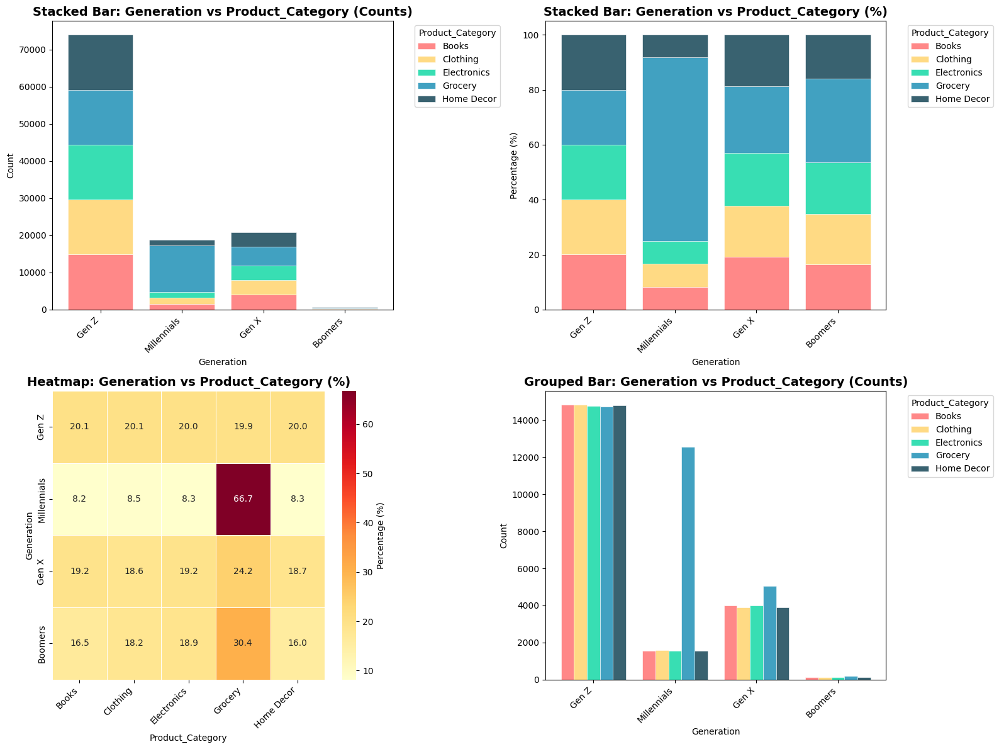

In [ ]:
visualize_categorical_relationship(df, 'Generation', 'Product_Category')

### Analysis:
1) **Stacked Bar (Counts) and (Percentage) and HeatMap:**

Shows absolute purchase counts by Generation for each category.

* Gen Z dominates → very high counts across almost all categories. Gen Z distribution is balanced for every category ~20% each.
* Millennials spike → huge count for Groceries compared to other categories.
* Groceries ~67% of all their purchases.
* Gen X steady → moderate levels across most categories, some preference for Groceries. Groceries ~24% share, others ~18-19%.
* Boomers minimal → tiny contribution overall.


2) **Grouped Bar (Counts):**
Direct comparison of category counts within each generation.


* Gen Z shows near equal preference across categories (~14,000 each).
* Millennials show massive Groceries bar vs tiny bars for other categories.
* Gen X shows mid-level engagement with all categories, slightly higher for Groceries.
* Boomers negligible across all categories, no clear leader.

### Insights:

1)Gen Z is the biggest, balanced market. Categories should treat Gen Z as the main growth driver.

2)Millennials are  Groceries loyalists. Groceries should double down on Millennial-focused campaigns.

3)Gen X = steady customers. Opportunities for upselling and retention campaigns, especially around Groceries.

4)Boomers = smallest segment.

5)Segmentation is key. Groceries has a generational monopoly with Millennials, while other categories share Gen Z and Gen X more evenly.

### Age group wise( Generation) feedback analysis

CONTINGENCY TABLE (Frequency Counts)
Feedback     Average    Bad  Excellent   Good   Total
Generation                                           
Gen Z          18279  18763      18335  18789   74166
Millennials     2029   2024       2196  14245   20494
Gen X           4181    164      26020   3883   34248
Boomers          138    158        433    327    1056
Total          24627  21109      46984  37244  129964




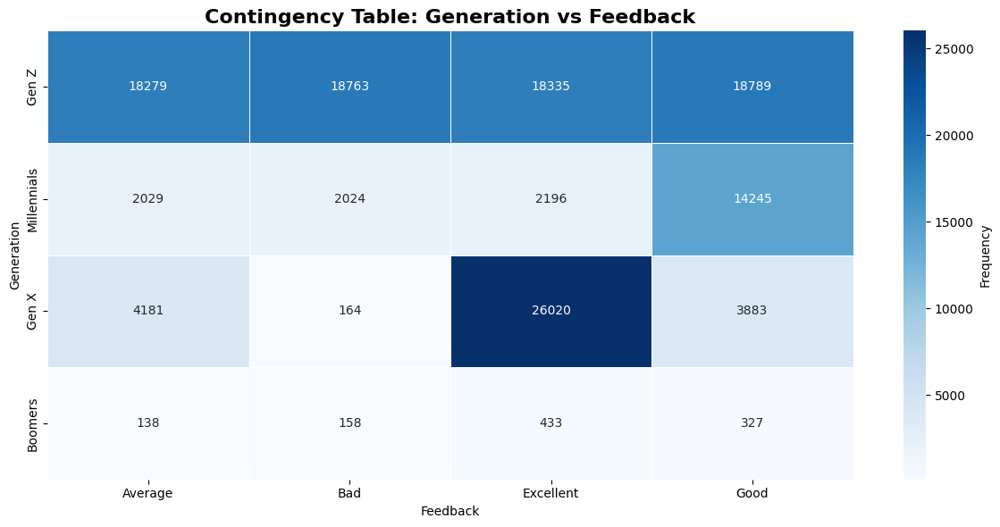

CHI-SQUARE TEST RESULTS
Chi-Square Statistic: 49679.5395
P-value: 0.0000000000
Degrees of Freedom: 9
Sample Size: 129964


INTERPRETATION:
--------------------------------------------------
✓ REJECT the null hypothesis (p = 0.0000 ≤ α = 0.05)
  There is a statistically significant association between Generation and Feedback.


MEASURE OF ASSOCIATION STRENGTH
Cramer's V: 0.3570

Cramer's V Interpretation:
--------------------------------------------------
✓ Very Strong Association


In [ ]:
chi_square_analysis(
    df=df,
    cat_var1='Generation',
    cat_var2='Feedback',
    alpha=0.05,
    figsize=(12, 6)
)




### Analysis
1) Gen Z

* Very large customer base.

* Feedback distribution is balanced across all categories (Average, Bad, Excellent, Good).

* Indicates diverse experiences, with both satisfied and dissatisfied customers.

2) Millennials

* Smaller base compared to Gen Z.

* Majority gave “Good” feedback (14,245).

* Lower counts for “Bad” and “Average,” meaning this group is generally satisfied.

3) Gen X

* Extremely strong preference for “Excellent” feedback (26,020).

* Very few gave “Bad” (164), suggesting this group is highly satisfied and loyal.

* Their satisfaction level is the highest among all generations.

4) Boomers

* Very small sample size.

* Mixed responses.

5) Statistical Results

Chi-Square test: Highly significant (p = 0.0000). → Feedback patterns are not random, they differ by generation.

Cramer’s V = 0.357 → Very Strong Association between generation and feedback.

This means generation strongly influences how feedback is given.

### Insights:
1) Gen Z – Diverse & Critical Segment

High participation but mixed satisfaction.

Business should focus on service consistency, personalized experiences, and fast issue resolution to reduce negative feedback.

2) Millennials – Generally Positive

Large proportion giving “Good” ratings shows steady satisfaction.

3) Gen X – The Brand Champions

Overwhelmingly positive (“Excellent” feedback).

Indicates strong brand loyalty and trust.



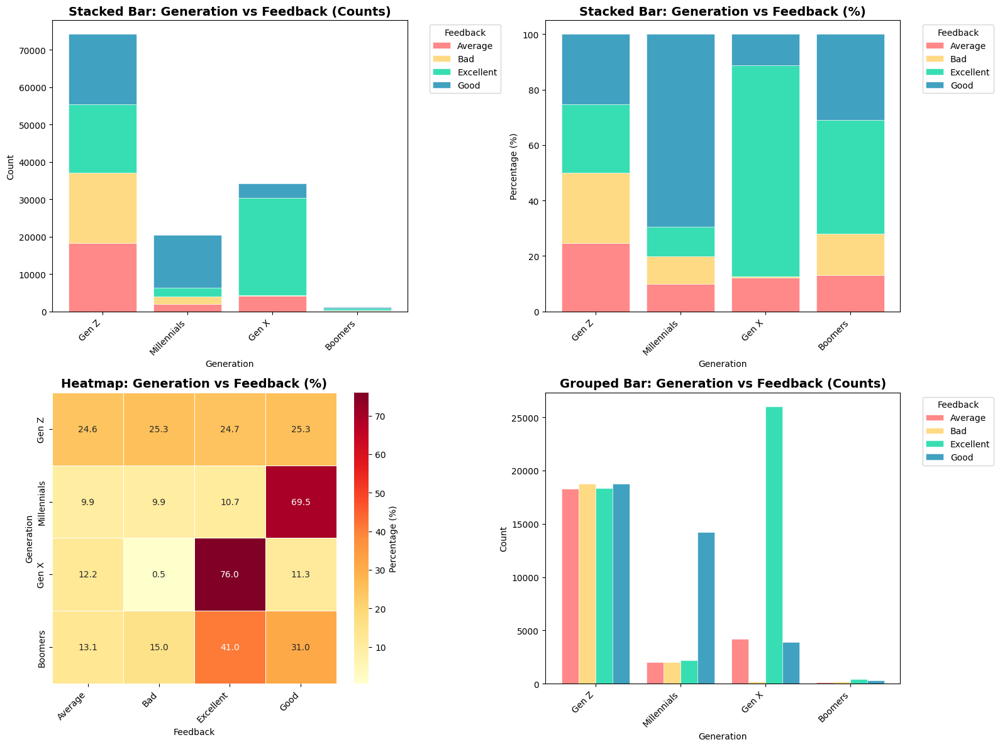

In [ ]:
visualize_categorical_relationship(df, 'Generation', 'Feedback')

### Analysis:
1. Stacked Bar (Counts – Top Left)

* Gen Z has the largest number of responses, distributed fairly evenly across all feedback types.

* Millennials lean heavily toward “Good” feedback.

* Gen X overwhelmingly chose “Excellent.”

* Boomers have very small counts, less reliable to generalize.

2. Stacked Bar (Percentages – Top Right)

* Gen Z is the most divided generation (almost equal shares of Average, Bad, Excellent, and Good).

* Millennials: ~70% gave “Good” feedback → consistent but not extreme satisfaction.

* Gen X: ~76% gave “Excellent” → very strong brand promoters.

* Boomers: Mixed (~41% Excellent, ~31% Good, rest Average/Bad), but small sample size makes it less impactful.

3. Heatmap (% – Bottom Left)

Confirms percentage insights:

* Gen Z = Balanced mix → satisfaction is unstable.

* Millennials = Overwhelmingly “Good.”

* Gen X = Overwhelmingly “Excellent.”

* Boomers = Split.

4. Grouped Bar (Counts – Bottom Right)

* Reinforces Gen X’s dominance in “Excellent” feedback.

* Shows Millennials strongly cluster under “Good.”

* Gen Z distributes across all categories, highlighting their variability.



### Analysis:


1) Wide range in spending across all categories: Each feedback group has customers spending from nearly 0 up to 5000.

2) Outliers are present in all groups, especially at the higher end, showing a few very high-spending customers across categories.

3) The median values (black lines inside the boxes) are quite close (~1000 across all groups), confirming what the bar plot suggests: feedback type does not drastically change median spending.

4) The IQR (interquartile range) is also similar across groups, meaning variability in spending is consistent regardless of feedback.

# Insights:
* Spending does not depend on feedback

* Customers who rate service as Excellent spend about the same as those who rate it Bad.

* This suggests that feedback reflects satisfaction levels but does not directly drive purchase behavior.

### Generationwise Total spend(revenue)

In [ ]:
customer_gen = df.groupby('Generation')['Total_Amount'].sum().reset_index()
customer_gen= customer_gen.sort_values(by='Total_Amount', ascending=False)


customer_gen.head()

,Generation,Total_Amount
0,Gen Z,1.017721e+08
2,Gen X,4.702443e+07
1,Millennials,2.798883e+07
3,Boomers,1.484349e+06


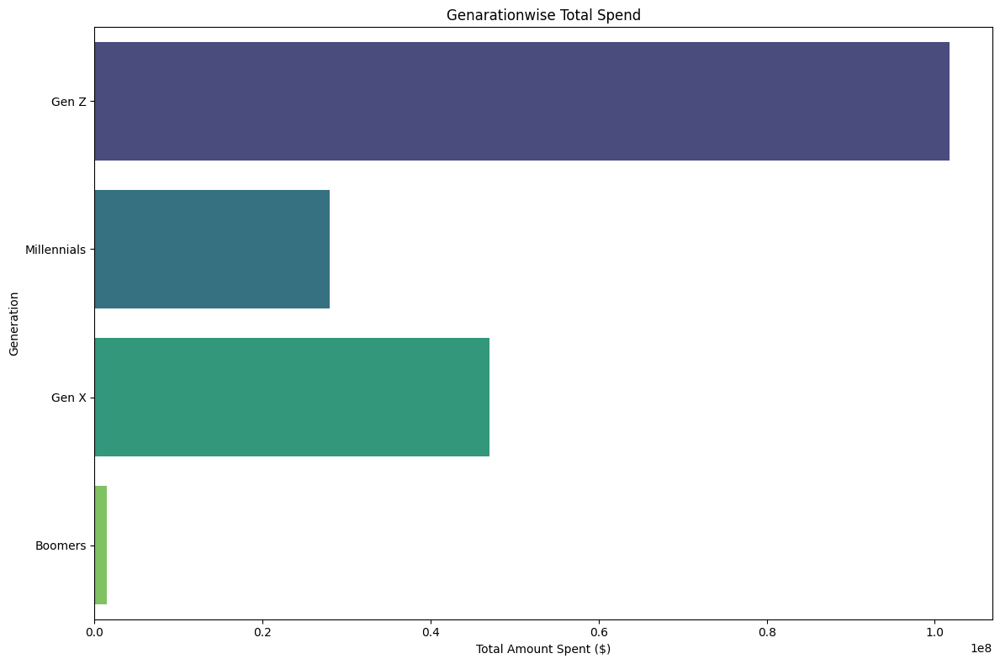

In [ ]:
plt.figure(figsize=(12, 8))
sns.barplot(data=customer_gen.head(), x='Total_Amount', y='Generation', palette='viridis')
plt.title('Genarationwise Total Spend')
plt.xlabel('Total Amount Spent ($)')
plt.ylabel('Generation')
plt.tight_layout()
plt.show()

### Analysis
1) Gen Z is the highest spending group, contributing over $100M, which is more than all other generations combined.

2) Gen X comes second (~$47M), showing strong purchasing power.

3) Millennials (~$28M) spend considerably less than Gen X, even though they are often seen as a strong consumer group.

4) Boomers contribute a very small amount (barely visible on the chart, ~ $2–3M).

### Insights

1) Gen Z as the core customer base:
Marketing strategies, product assortments, and engagement campaigns should be heavily focused on Gen Z.

2) Gen X is a stable secondary market:
 They should not be overlooked.

3) Millennials underperforming expectations:


4) Boomers are negligible:
Very little spend comes from Boomers, meaning they are not a priority customer group for OmniMart.

## D. Feedbackwise Total_amount analysis

In [ ]:
anova_test(df, 'Total_Amount', 'Feedback')

{'F-statistic': np.float64(0.9226),
 'p-value': np.float64(0.428839),
 'conclusion': 'Fail to reject the null hypothesis: No significant difference in Total_Amount across levels of Feedback.'}

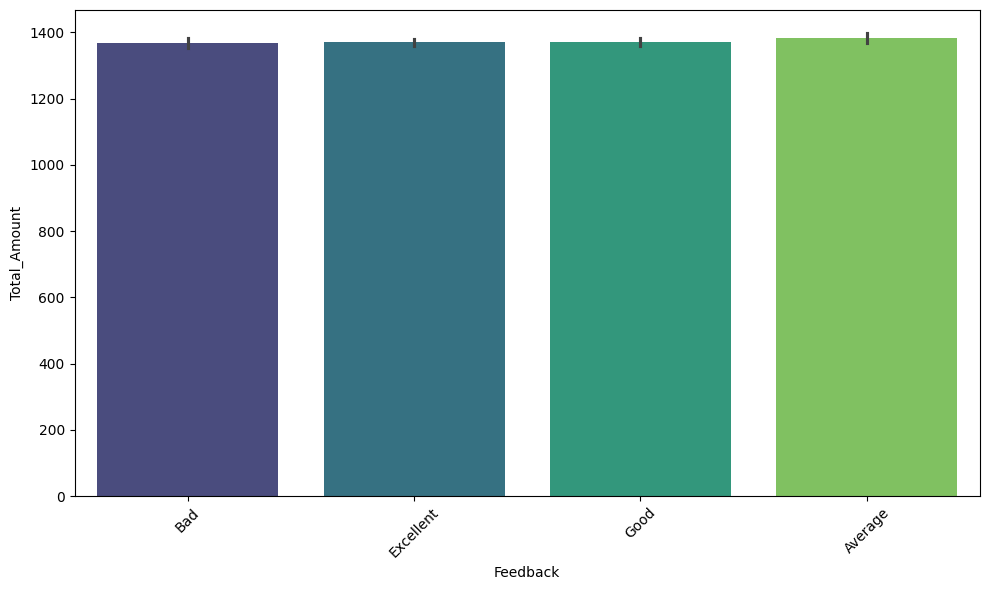

<Axes: xlabel='Feedback', ylabel='Total_Amount'>

In [ ]:
create_barplot(df, 'Feedback', 'Total_Amount')

### Analyse:
1) The average spending (Total_Amount) is very similar across all feedback categories: Bad, Excellent, Good, and Average.

2) Each category hovers around 1370–1390, showing no major differences in mean spending regardless of feedback quality.

3) This indicates that customer spending is not strongly tied to the feedback rating they provide.

### Insights:
* Spending does not depend on feedback

* Customers who rate service as Excellent spend about the same as those who rate it Bad.

* This suggests that feedback reflects satisfaction levels but does not directly drive purchase behavior.

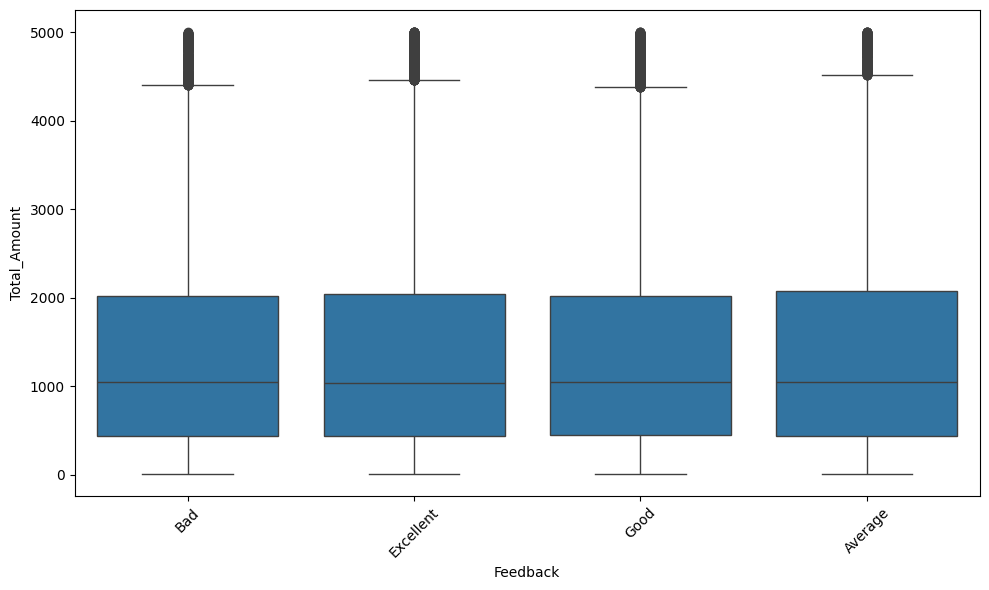

<Axes: xlabel='Feedback', ylabel='Total_Amount'>

In [ ]:
create_boxplot(df, 'Feedback', 'Total_Amount')

### Analysis:


1) Wide range in spending across all categories: Each feedback group has customers spending from nearly 0 up to 5000.

2) Outliers are present in all groups, especially at the higher end, showing a few very high-spending customers across categories.

3) The median values (black lines inside the boxes) are quite close (~1000 across all groups), confirming what the bar plot suggests: feedback type does not drastically change median spending.

4) The IQR (interquartile range) is also similar across groups, meaning variability in spending is consistent regardless of feedback.

### Insights:
* Spending does not depend on feedback

* Customers who rate service as Excellent spend about the same as those who rate it Bad.

* This suggests that feedback reflects satisfaction levels but does not directly drive purchase behavior.

## E. Genderwise Product Brand analysis

CONTINGENCY TABLE (Frequency Counts)
Product_Brand  Adidas  Apple  Bed Bath & Beyond  Coca-Cola  HarperCollins  \
Gender                                                                      
Female           2746   2712               2697       2748           2702   
Male             4136   3968               4112       4082           4153   
Total            6882   6680               6809       6830           6855   

Product_Brand  Home Depot  IKEA  Nestle  Nike  Penguin Books  Pepsi  \
Gender                                                                
Female               2664  2690    2664  2665           2805   7429   
Male                 4113  4074    4125  4102           3977  11479   
Total                6777  6764    6789  6767           6782  18908   

Product_Brand  Random House  Samsung  Sony  Zara   Total  
Gender                                                    
Female                 2727     2754  2785  2715   45503  
Male                   4106     4078  4134  

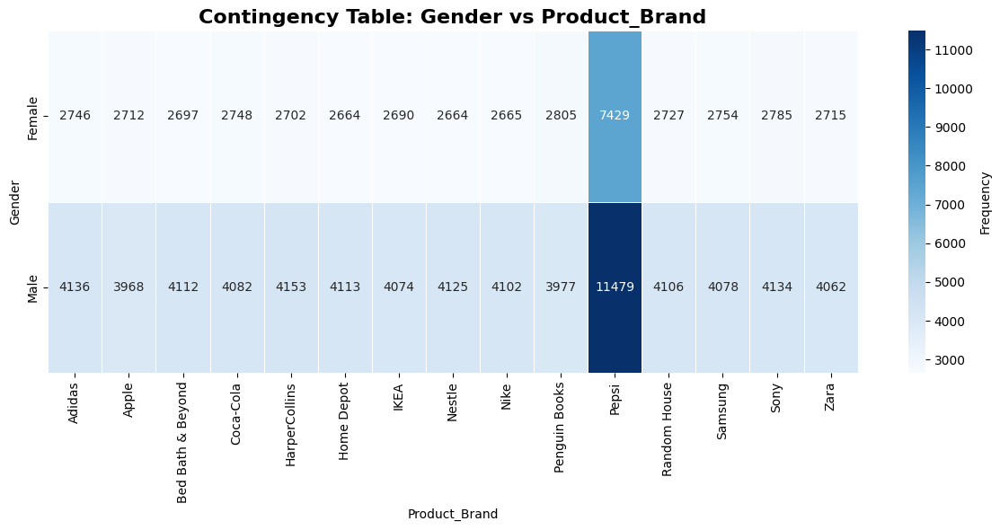

CHI-SQUARE TEST RESULTS
Chi-Square Statistic: 15.3326
P-value: 0.3558034038
Degrees of Freedom: 14
Sample Size: 114204


INTERPRETATION:
--------------------------------------------------
✗ FAIL TO REJECT the null hypothesis (p = 0.3558 > α = 0.05)
  There is NO statistically significant association between Gender and Product_Brand.


MEASURE OF ASSOCIATION STRENGTH
Cramer's V: 0.0116

Cramer's V Interpretation:
--------------------------------------------------
✗ Little to No Association


In [ ]:
chi_square_analysis(
    df=df,
    cat_var1='Gender',
    cat_var2='Product_Brand',

    alpha=0.05,
    figsize=(12, 6)
)

### Analysis:
1. Hypothesis Test

Null Hypothesis (H₀): Gender and Product_Category are independent (no relationship).
* Result:
Since p = 0.1931 > 0.05, we fail to reject H₀.
→ Gender does not have a statistically significant effect on the type of product category chosen.

2. Association Strength (Cramer's V = 0.0073)
* 0.00–0.10 → Very weak (little to no association).
* This means gender differences are negligible when it comes to product category preferences.

3) Female: 45,490 purchases (40% of grand total).
Male: 68,701 purchases (60% of grand total).
Grand Total: 114,191 purchases.

### Insights:
1)No meaningful relationship—gender does not drive category preferences.

2)Gender-Neutral Strategies will win

3) Scale with Male Volume, male purchases are about 60% of the total purchases.

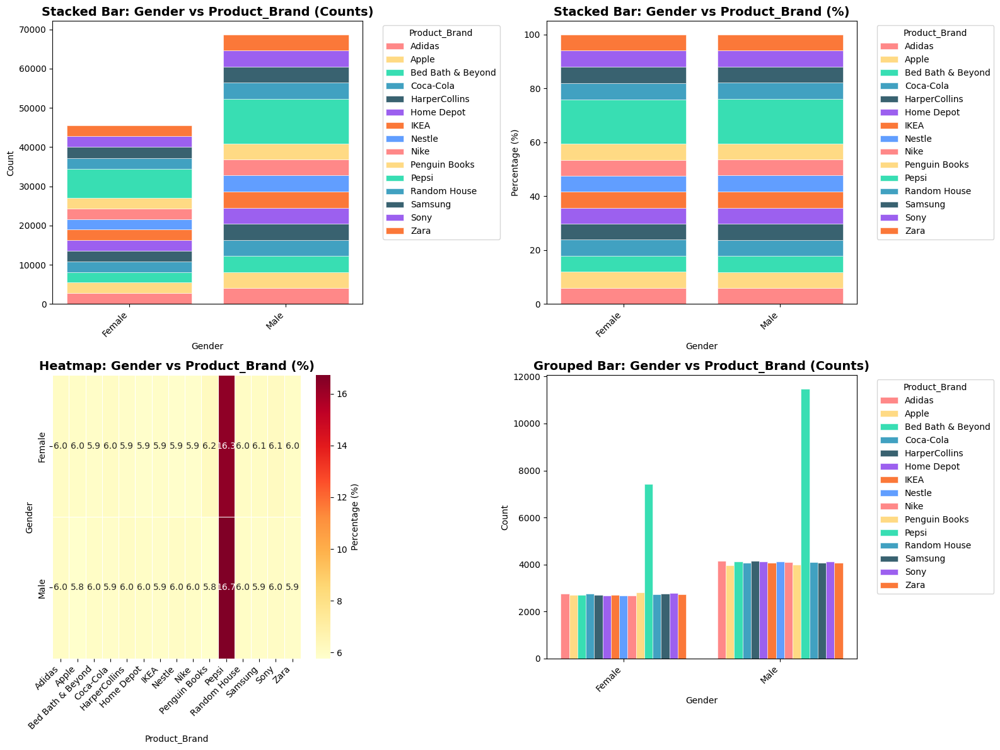

In [ ]:
visualize_categorical_relationship(df, 'Gender', 'Product_Brand')

### Analysis
1) **Stacked Bar (Counts) and (Percentage):**

Shows absolute purchase counts by Gender for each product_brand.

* Female balanced → moderate counts across all brands, with slight spikes in Penguin Books and Nestle (~12-14% share each).
Penguin Books ~14% of all  purchases, Nestle ~12%.

* Male dominates → very high counts across almost all brands, with balanced distribution 6-9% each, minor dips in Nestle (~8%).
Overall even, no single brand >10%.

* Overall, males drive ~62% of total volume, females ~38%.

2) **Grouped Bar (Counts):**
Direct comparison of brand counts within each gender.

* Female shows mostly equal low-to-mid bars (3,000-4,000 each), with taller bars for Coca-Cola (6,000) and Penguin Books/Nestle (~5,000-5,500).

* Male shows near equal high bars (5,000-6,000 each), with a slight edge for Coca-Cola (8,000) and Penguin Books (6,500).

* Both genders exhibit balanced engagement, but males scale higher across the board; no extreme spikes.

### Insights:
1)Male is the biggest, balanced market. Brands should treat Male as the main growth driver fro scaling.

2)Female = niche loyalists in publishing/essentials. Penguin Books and Nestle should double down on Female-focused campaigns. Other brands must invest heavily to penetrate this segment.

3) No need for segnmentation based on gender

## F. Income level wise analysis

### Income level wise Product Category analysis

CONTINGENCY TABLE (Frequency Counts)
Product_Category  Books  Clothing  Electronics  Grocery  Home Decor   Total
Income                                                                     
High               3963      3972         4066     6335        3903   22239
Low                5929      5929         5760    10659        5866   34143
Medium            10581     10529        10622    15516       10600   57848
Total             20473     20430        20448    32510       20369  114230




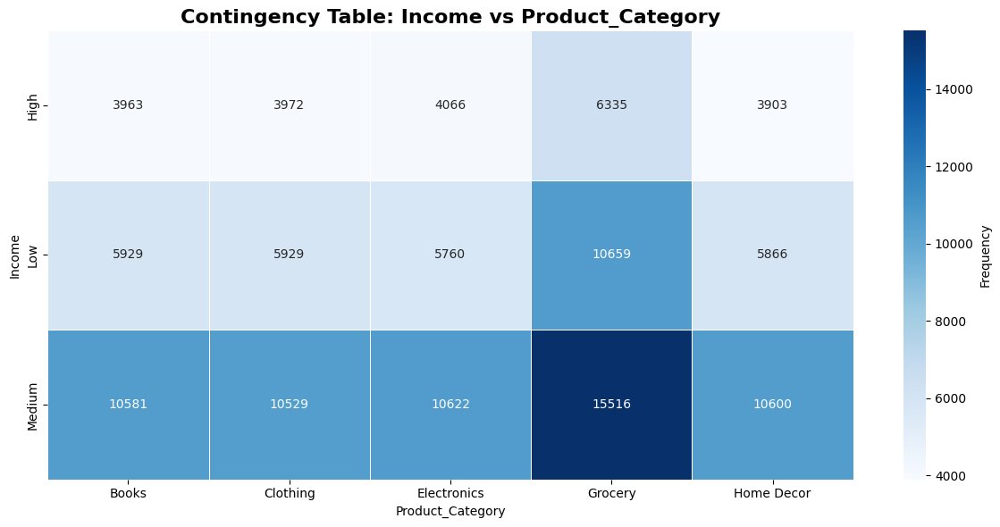

CHI-SQUARE TEST RESULTS
Chi-Square Statistic: 210.5769
P-value: 0.0000000000
Degrees of Freedom: 8
Sample Size: 114230


INTERPRETATION:
--------------------------------------------------
✓ REJECT the null hypothesis (p = 0.0000 ≤ α = 0.05)
  There is a statistically significant association between Income and Product_Category.


MEASURE OF ASSOCIATION STRENGTH
Cramer's V: 0.0304

Cramer's V Interpretation:
--------------------------------------------------
✗ Little to No Association


In [ ]:
chi_square_analysis(
    df=df,
    cat_var1='Income',
    cat_var2='Product_Category',

    alpha=0.05,
    figsize=(12, 6)
)

### Analysis:
1. Hypothesis Test

* Result:
p = 0.0000 ≤ 0.05 → Reject Null Hypothesis.

* Statistically, there is an association between Income and Product_Category.

2. Association Strength (Cramer's V = 0.0304)

While significant, the effect size is very weak (close to zero).

This means the relationship exists, but Income explains very little variation in Product_Category choice.

### Insights:
Income and product category are statistically linked, but the association is too weak to be meaningful for business strategy.

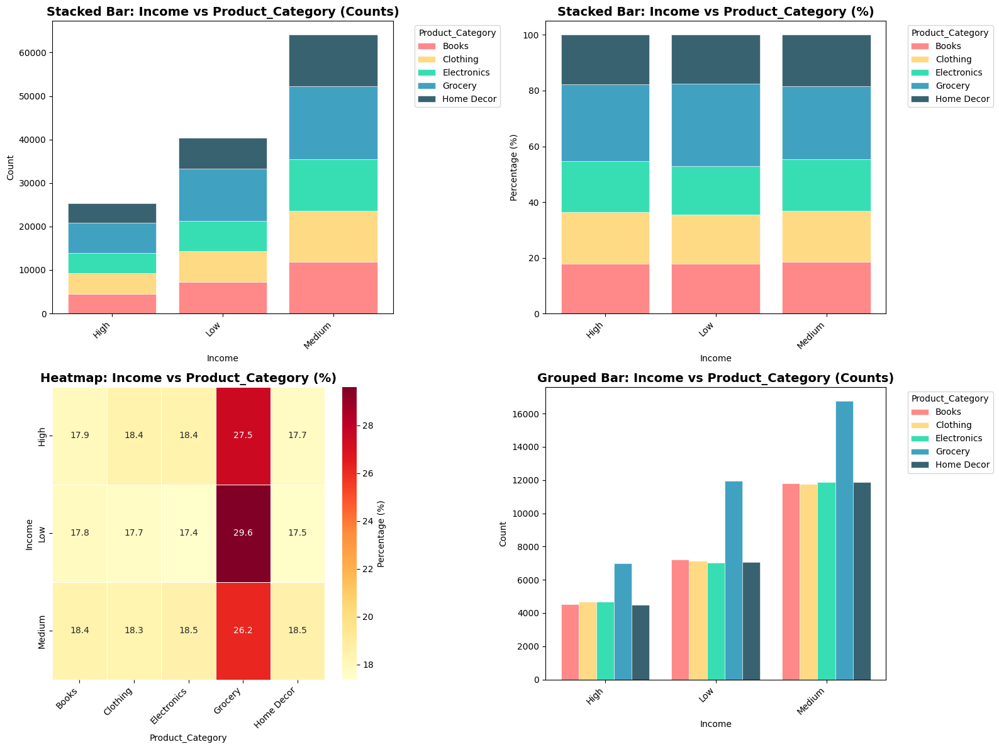

In [ ]:
visualize_categorical_relationship(df, 'Income', 'Product_Category')


### Analysis
1) Overall Counts (Stacked Bar - Counts)

* Medium income group dominates across all product categories (highest counts).

* Low income group is second, while High income contributes the least in total purchases.

* Category Preferences Across Incomes (Stacked Bar - % + Heatmap)

* Groceries take the largest share across all income levels.

* Low income: 29.6%

* Medium income: 26.2%

* High income: 27.5%

* Other categories (Books, Clothing, Electronics, Home Décor) are fairly balanced, each ~17–19% share, regardless of income.

2) Heatmap Insight

* Grocery is a universal priority across all income groups.

* Little variation in percentage split of discretionary categories (Books, Clothing, Electronics, Home Décor).

3) Grouped Bar (Counts)

* For Medium income: highest demand across all categories, especially Groceries & Home Décor.

* For Low income: Grocery leads slightly, other categories nearly equal.

* For High income: total counts are low, but relative preference for Grocery remains strong.

###  Insights:


1)Double down on Medium-income customers

* Targeted loyalty programs, bundled offers (grocery + lifestyle products).


2) For Low income segment

* Push affordable grocery deals and basic product bundles.

* Offer subscription-based grocery deliveries, micro-discounts, or cashback.

3) For High income segment

* Focus on premium groceries & lifestyle items (organic, gourmet, branded décor).

* Personalized recommendations and exclusivity (VIP memberships, premium packs).

4)Cross-category bundling

Use Grocery as a hook → upsell discretionary items (e.g., “Grocery + Electronics kitchen combo,” “Grocery + Home Décor lifestyle packs”).


### Incomewise total spend (Revenue)

In [ ]:
customer_Income = df.groupby('Income')['Total_Amount'].sum().reset_index()
customer_Income= customer_Income.sort_values(by='Total_Amount', ascending=False)
customer_Income.head()


,Income,Total_Amount
2,Medium,8.801202e+07
1,Low,5.532766e+07
0,High,3.476950e+07


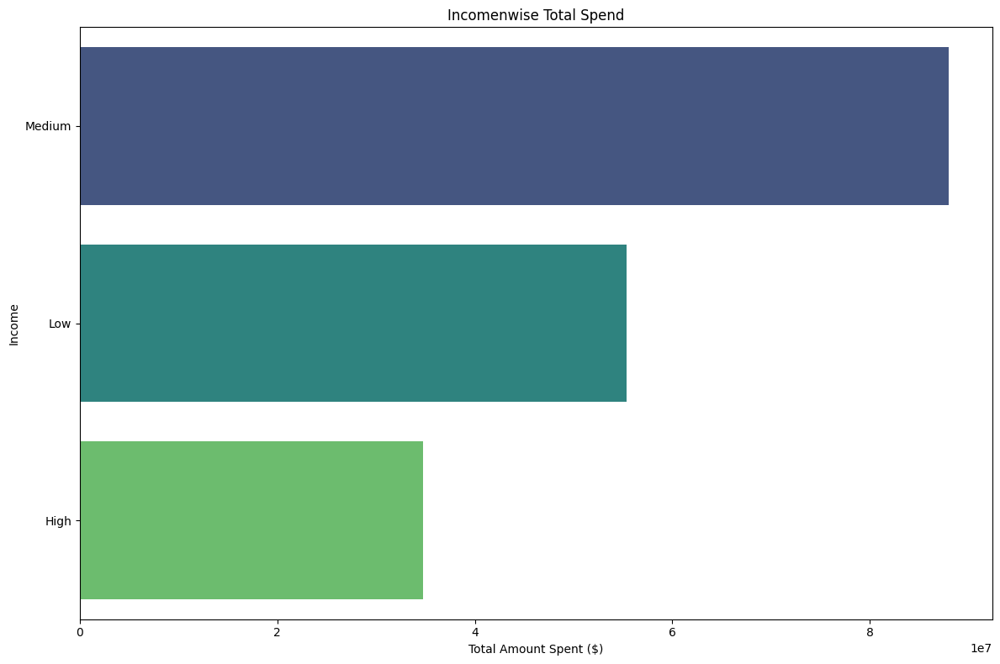

In [ ]:
plt.figure(figsize=(12, 8))
sns.barplot(data=customer_Income.head(), x='Total_Amount', y='Income', palette='viridis')
plt.title('Incomenwise Total Spend')
plt.xlabel('Total Amount Spent ($)')
plt.ylabel('Income')
plt.tight_layout()
plt.show()

### Analysis


1) Medium-income customers contribute the largest total spend (~$87M), clearly dominating the chart.

2) Low-income customers come second (~$56M), showing strong spending power despite limited income.

3) High-income customers surprisingly spend the least (~$35M), much lower than expected given their capacity.

### Insights

1) Medium-income = core driver of revenue
This group is the primary target segment, showing both affordability and willingness to spend. Tailored loyalty programs and product bundles could further boost their engagement.

2) Low-income = strong but price-sensitive market
Despite financial limitations, they contribute a large share. This suggests they are high-frequency buyers, likely purchasing affordable or essential goods.

3) High-income = underperforming potential
Their contribution is the lowest, which may indicate that OmniMart isn’t fully appealing to premium buyers. Opportunities exist to introduce exclusive, luxury, or premium product lines, as well as VIP services to capture their spending capacity.

## G. Analysis between shipping method  and  order status

CONTINGENCY TABLE (Frequency Counts)
Order_Status     Delivered  Pending  Processing  Shipped   Total
Shipping_Method                                                 
Express              21955     4512        7236     9629   43332
Same-Day             21961     4544        7185     9666   43356
Standard             21931     4424        7200     9563   43118
Total                65847    13480       21621    28858  129806




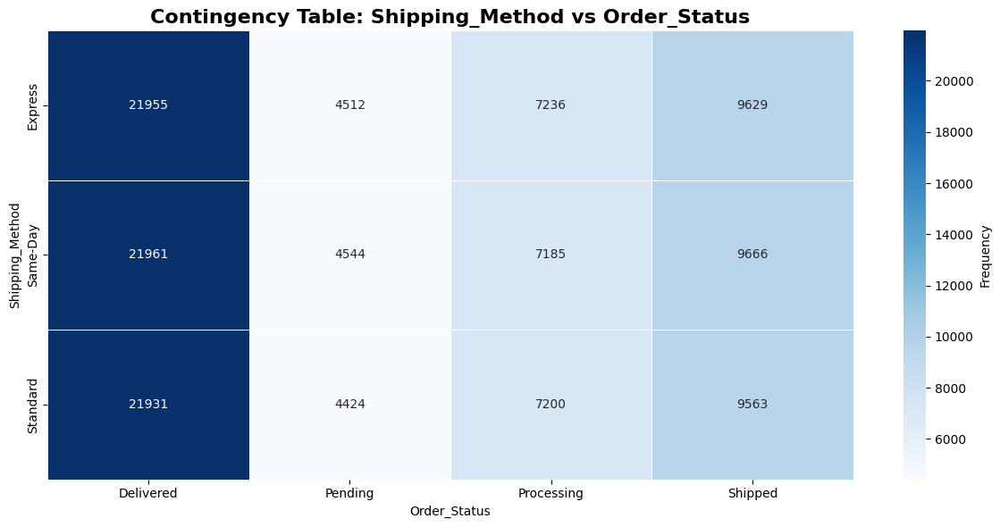

CHI-SQUARE TEST RESULTS
Chi-Square Statistic: 1.7063
P-value: 0.9446361586
Degrees of Freedom: 6
Sample Size: 129806


INTERPRETATION:
--------------------------------------------------
✗ FAIL TO REJECT the null hypothesis (p = 0.9446 > α = 0.05)
  There is NO statistically significant association between Shipping_Method and Order_Status.


MEASURE OF ASSOCIATION STRENGTH
Cramer's V: 0.0026

Cramer's V Interpretation:
--------------------------------------------------
✗ Little to No Association


In [ ]:
chi_square_analysis(df, 'Shipping_Method', 'Order_Status')


### Analysis:


1) Delivered orders dominate across all shipping methods

* Express: 21,955 delivered

* Same-Day: 21,961 delivered

* Standard: 21,931 delivered

 This is the largest category across all shipping methods, meaning most orders successfully complete delivery regardless of method.

2) Pending orders are the lowest across all methods

* Express: 4,512

* Same-Day: 4,544

* Standard: 4,424

 Very few orders are left in pending state, which indicates an efficient order confirmation process.

3) Processing orders are in the middle range

* Express: 7,236

* Same-Day: 7,185

* Standard: 7,200

 Roughly the same across all shipping methods, suggesting uniform handling capacity.

4) Shipped but not yet delivered orders are also significant

* Express: 9,629

* Same-Day: 9,666

* Standard: 9,563
 Roughly 10k orders per method are stuck in shipped status, meaning they are on the way but not closed as delivered.

Consistency across methods

The distribution of statuses is remarkably balanced across Express, Same-Day, and Standard.

This implies that operational performance is consistent across all shipping methods.

### Insights:
1) Strong Delivery Performance

2) Low Pending Rates

3) Bottleneck in Shipped Orders

4) Room to Improve Processing Time: With ~7k+ still in processing per method, optimizing warehouse/dispatch workflows could speed up fulfillment

## H. Total spend across Product brand




In [ ]:
# Group by Product_Brand and sum Total_Amount
brand_sales = df.groupby('Product_Brand')['Total_Amount'].sum().sort_values(ascending=False)

print("Total Sales by Product Brand:")
print(brand_sales)

Total Sales by Product Brand:
Product_Brand
Pepsi                2.757435e+07
Samsung              1.100840e+07
Sony                 1.089544e+07
Nike                 1.085114e+07
Nestle               1.080564e+07
HarperCollins        1.080481e+07
Coca-Cola            1.079653e+07
Random House         1.078812e+07
Bed Bath & Beyond    1.073309e+07
IKEA                 1.071230e+07
Penguin Books        1.069264e+07
Home Depot           1.066294e+07
Zara                 1.064686e+07
Adidas               1.062126e+07
Apple                1.052776e+07
Name: Total_Amount, dtype: float64


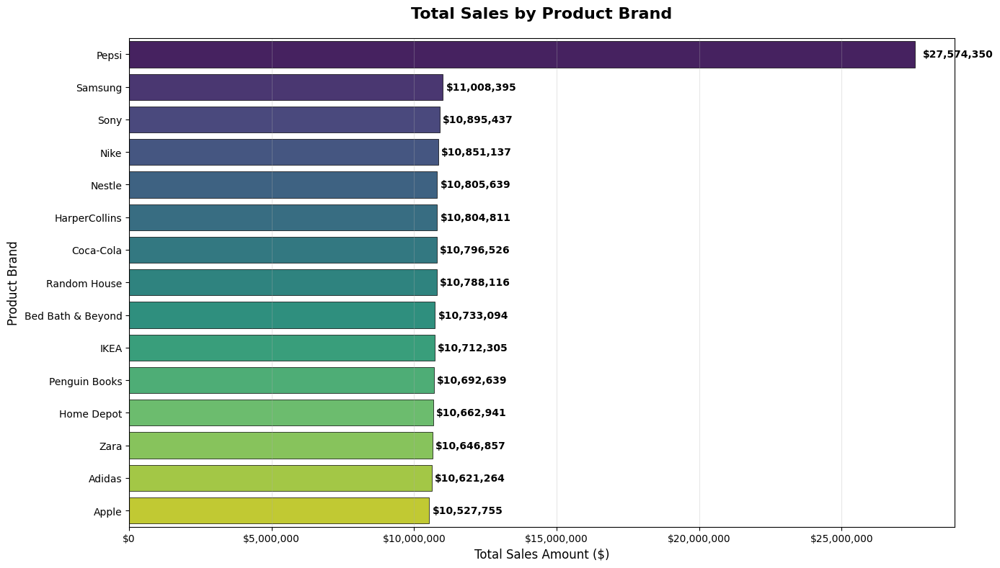

In [ ]:
plt.figure(figsize=(14, 8))

# Create the bar plot
ax = sns.barplot(x=brand_sales.values, y=brand_sales.index, palette='viridis',
                 edgecolor='black', linewidth=0.5)

# Add value labels on each bar
for i, value in enumerate(brand_sales.values):
    ax.text(value + value*0.01, i, f'${value:,.0f}',
            va='center', fontweight='bold', fontsize=10)

# Customize the plot
plt.title('Total Sales by Product Brand', fontsize=16, fontweight='bold', pad=20)
plt.xlabel('Total Sales Amount ($)', fontsize=12)
plt.ylabel('Product Brand', fontsize=12)
plt.grid(axis='x', alpha=0.3)

# Format x-axis to show dollar amounts with commas
plt.gca().xaxis.set_major_formatter(plt.FuncFormatter(lambda x, p: f'${x:,.0f}'))

plt.tight_layout()
plt.show()

### Analysis:
1) Pepsi is the clear outlier

* $27.57M in sales — more than 2.5× higher than the next brand.


2) Second tier (Samsung, Sony, Nike, Nestle, HarperCollins, Coca-Cola, Random House)

* All cluster around $10.7M–$11.0M in sales.



3) Third tier (Bed Bath & Beyond, IKEA, Penguin, Home Depot, Zara, Adidas, Apple)

Also in the $10.5M–$10.7M range.

### Insights:
1) Leverage Pepsi as a flagship driver

* Bundle Pepsi with other categories (cross-promotions like groceries + beverages + snacks).

* Use Pepsi loyalty campaigns to boost attachment to lower-performing categories.

2) Differentiate in the second tier

* Since Samsung, Sony, Nestle, Nike, Coca-Cola, and others are clustered, brand storytelling, promotions, and digital campaigns can help break out of the plateau.

3) Boost Apple’s share via ecosystem sales


4) Double down on books

* Books are a sleeper hit. Promote subscription models, book clubs, or digital + print bundles to capture more consistent revenue.

5) Fashion strategies

* Nike should consolidate leadership by leveraging digital engagement (collabs, limited drops).

* Zara and Adidas could push trend-driven fast campaigns to capture Gen Z, who show strong discretionary spending.

6) Category bundling across tiers

* Electronics + Home Décor, Fashion + Books, Groceries + Beverages → can create new demand channels by linking top and lower-tier brands together.


## I. Top 10 and Bottom 10 cities according to total spend (Revenue)

### Top 10 cities according to total spend

In [ ]:
customer_city = df.groupby('City')['Total_Amount'].sum().reset_index()
customer_city = customer_city.sort_values(by='Total_Amount', ascending=False)


customer_city.head()

,City,Total_Amount
100,Portsmouth,2.497187e+07
44,Frankfurt,1.136169e+07
43,Fort Worth,6.118498e+06
67,London,9.131367e+05
127,Winnipeg,5.818444e+05


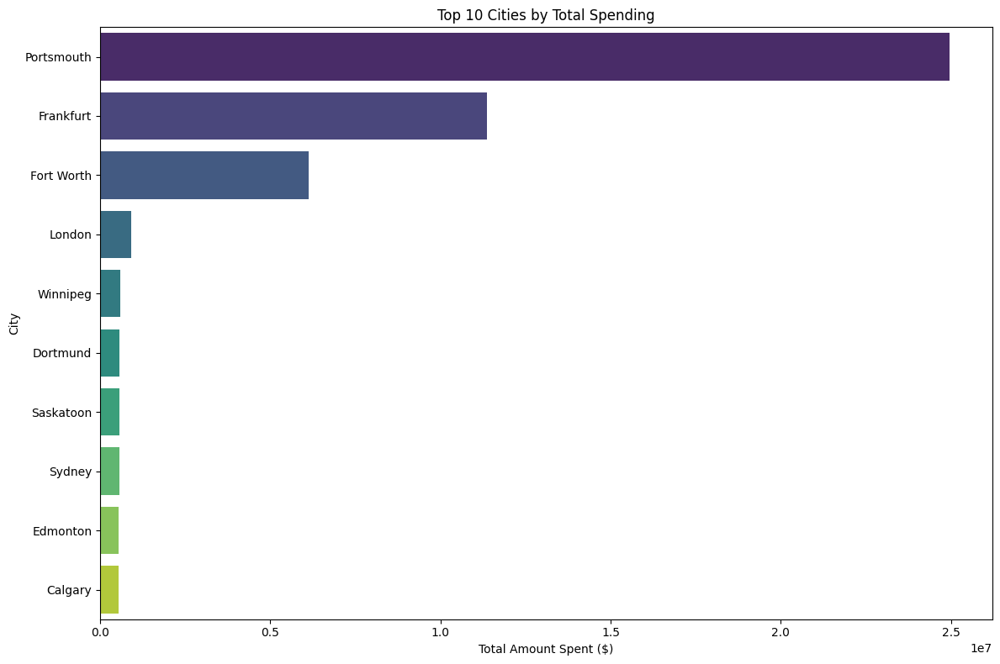

In [ ]:
plt.figure(figsize=(12, 8))
sns.barplot(data=customer_city.head(10), x='Total_Amount', y='City', palette='viridis')
plt.title('Top 10 Cities by Total Spending')
plt.xlabel('Total Amount Spent ($)')
plt.ylabel('City')
plt.tight_layout()
plt.show()

### Analysis
* Portsmouth follows closely at ~$25.6M, making it another key revenue driver.

* Frankfurt ~$11.5M and Fort Worth ~$6.5M follow as the next significant markets, but they are much smaller than Portsmouth.

* London (~$2.0M) and other cities have relatively low spending, contributing much less compared to the top 3.

### Insights

* Revenue Concentration: Chicago + Portsmouth together account for nearly 60–65% of the spending in this top 20 list, showing high dependency on these markets.

* Market Risk: Heavy reliance on a few cities may pose a risk — if sales decline in Chicago/Portsmouth, total revenue would be significantly affected.

* Growth Opportunities in mid-tier cities

### Bottom 10 cities according to total spend

Bottom 10 Cities by Total Spending:
             City   Total_Amount
125       Wichita  153838.585170
16         Boston  159861.822674
106     San Diego  166156.684768
3       Arlington  169155.448171
4         Atlanta  171970.534648
77      Milwaukee  173546.771232
96   Philadelphia  175814.790284
57   Jacksonville  176503.320998
7       Baltimore  176759.457682
102       Raleigh  179322.480989


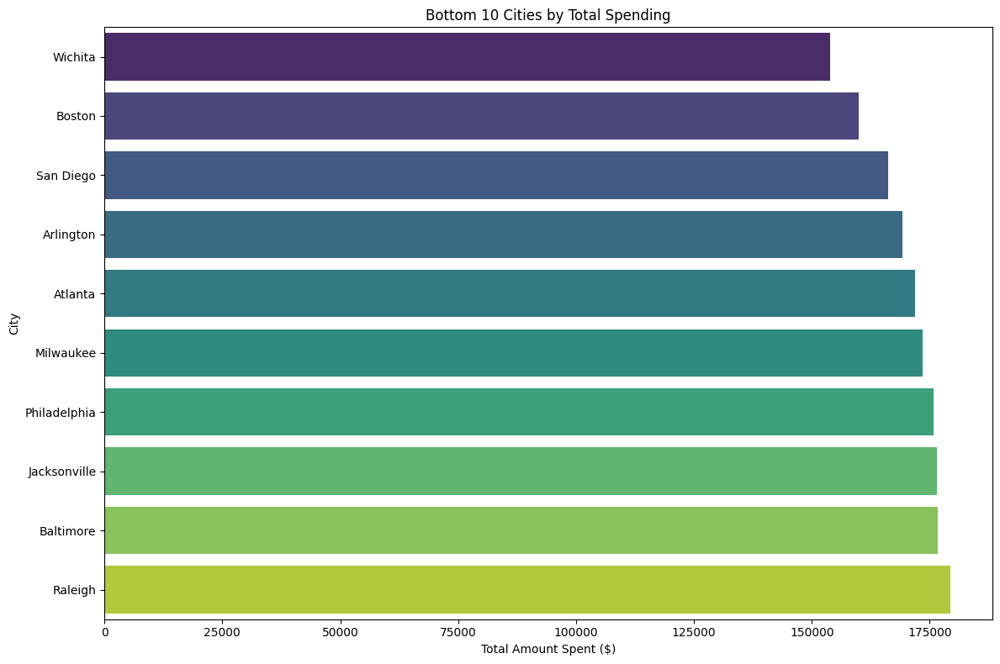

In [ ]:
# Group by State and calculate total spending
state_spending = df.groupby('City')['Total_Amount'].sum().reset_index()

# Sort by Total_Amount to get bottom 10
bottom_10_states = state_spending.sort_values('Total_Amount').head(10)

print("Bottom 10 Cities by Total Spending:")
print(bottom_10_states)

# Create the bar plot for bottom 10 states
plt.figure(figsize=(12, 8))
sns.barplot(data=bottom_10_states, x='Total_Amount', y='City', palette='viridis')
plt.title('Bottom 10 Cities by Total Spending')
plt.xlabel('Total Amount Spent ($)')
plt.ylabel('City')
plt.tight_layout()
plt.show()

### Analysis
1) Wichita has the lowest total spending among the group, just above $150,000.


2) Raleigh has the highest spending within this bottom 10 group, slightly above $175,000.

### Insights

1) Narrow Gap: The difference between the lowest and highest in this bottom group is not huge (~$25K). This suggests that spending across these cities is relatively close.

2) City Size & Economics: Some large cities (like Philadelphia, Atlanta, and Boston) appear here, which may indicate either tighter spending patterns, demographic differences, or economic priorities compared to higher-ranked cities.

3) Potential Growth Opportunities: Cities in this bottom group could represent opportunities to increase engagement, investments, or sales depending on the context of spending (e.g., retail, services, events).

## J. Countrywise total spend (Revenue)

In [ ]:
customer_country = df.groupby('Country')['Total_Amount'].sum().reset_index()
customer_country = customer_country.sort_values(by='Total_Amount', ascending=False)


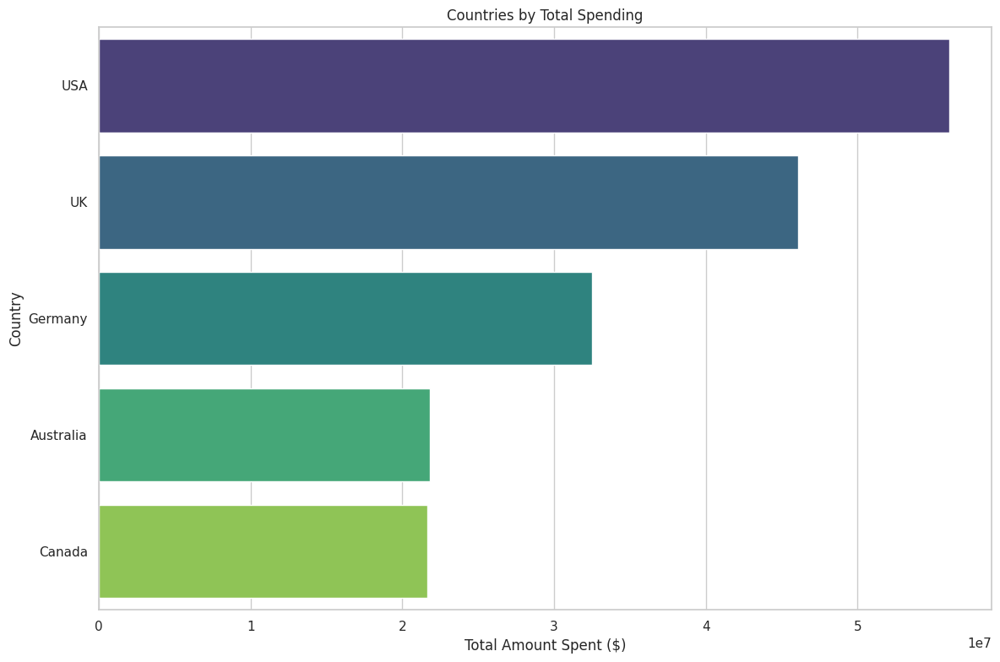

In [ ]:
plt.figure(figsize=(12, 8))
sns.barplot(data=customer_country.head(20), x='Total_Amount', y='Country', palette='viridis')
plt.title('Countries by Total Spending')
plt.xlabel('Total Amount Spent ($)')
plt.ylabel('Country')
plt.tight_layout()
plt.show()

### Analysis
1) USA leads clearly with the highest total spending (~$55M+).

2) UK is the second strongest market (~$46M), not too far behind the USA.

3) Germany (~$33M) is the third, showing strong European demand.

4) Australia and Canada (~$22M each) are smaller markets compared to the top 3, but still valuable.

5) There’s a big gap between the top 2 (USA + UK) and the rest, highlighting market concentration.

### Insights


1) Revenue Concentration: USA and UK together contribute over 50% of total spending, indicating reliance on these mature markets.

2) Diversification gap: Australia and Canada, despite being developed economies, are underperforming compared to peers.

3) Risk factor: Heavy dependence on USA and UK increases vulnerability to macroeconomic shifts, currency fluctuations, or regional competition

## K. AOV - Average Order Value Based on Other Features

In [ ]:
df_clean = df

In [ ]:
# Calculate AOV by Customer Segment
aov_segment = df_clean.groupby('Customer_Segment')['Total_Amount'].mean()
print("AOV by Customer Segment:\n", aov_segment)

AOV by Customer Segment:
 Customer_Segment
New        1369.299925
Premium    1364.774504
Regular    1371.364497
Name: Total_Amount, dtype: float64


INSIGHTS
* Remarkable Consistency Across Segments
* Strong First Impression
* The most critical and surprising insight is that Premium Customers do not have the highest Average Order Value (AOV). In fact, they have the lowest AOV

* Special care needs to be taken of Premium segment as some unsual behaviour is seen here
* Introduce benefits specifically designed to incentivize a higher AOV for your Premium members
* Create AOV-Targeted Marketing Campaigns

In [ ]:
# Calculate AOV by Payment Method
aov_payment = df_clean.groupby('Payment_Method')['Total_Amount'].mean()
print("\nAOV by Payment Method:\n", aov_payment)


AOV by Payment Method:
 Payment_Method
Cash           1371.857597
Credit Card    1371.555606
Debit Card     1364.130065
PayPal         1371.962356
Name: Total_Amount, dtype: float64


In [ ]:
# Calculate AOV by Shipping Method
aov_shipping = df_clean.groupby('Shipping_Method')['Total_Amount'].mean()
print("\nAOV by Shipping Method:\n", aov_shipping)


AOV by Shipping Method:
 Shipping_Method
Express     1368.556558
Same-Day    1371.523542
Standard    1369.047533
Name: Total_Amount, dtype: float64


INSIGHTS
* Since shipping choice doesn't affect product revenue, you can now evaluate your shipping strategies purely on a cost-to-serve basis
* Understand that offering free "Same-Day" shipping as a promotion is a very expensive customer acquisition tool that does not lead to a higher return per order. Use it sparingly and strategically for high-value customer segments only.
* Start using shipping as a strategic tool for customer acquisition and operational profit.

In [ ]:
# Calculate AOV by Year
aov_year = df_clean.groupby('Year')['Total_Amount'].mean()
print("\nAOV by Year:\n", aov_year)


AOV by Year:
 Year
2023.0    1370.714372
2024.0    1365.689887
Name: Total_Amount, dtype: float64


In [ ]:
# Calculate AOV by Month
aov_month = df_clean.groupby('Month')['Total_Amount'].mean()
print("\nAOV by Month:\n", aov_month)


AOV by Month:
 Month
April        1380.494460
August       1386.763844
December     1377.801124
February     1372.683216
January      1358.543157
July         1370.914202
June         1356.291170
March        1385.842182
May          1374.944233
November     1358.066377
October      1364.662022
September    1362.830635
Name: Total_Amount, dtype: float64


INSIGHTS
* AUG,MAR,APRIL sees the highest AOV suggesting higher trends during the Summer Holidays.
* December's AOV rebounds significantly to become the third-highest month( Christmas)
*  Start exclusive promotions from the start of the year that might led to Higher trends in the MARCH-AUGUST period
* Attack the April-June time period with discounts or new launches
* create pre-made, high-value gift bundles for the holiday season(NOVEMBER)

In [ ]:
# Calculate AOV by Country
aov_country = df_clean.groupby('Country')['Total_Amount'].mean()
print("\nAOV by Country:\n", aov_country)


AOV by Country:
 Country
Australia    1374.634199
Canada       1364.505787
Germany      1372.176861
UK           1381.415428
USA          1362.323932
Name: Total_Amount, dtype: float64


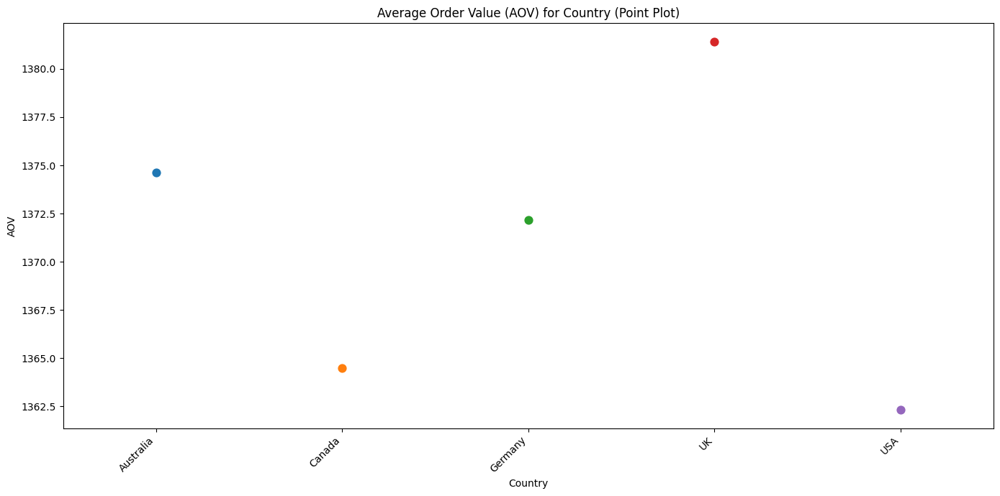

In [ ]:
plt.figure(figsize=(14, 7))
sns.pointplot(x=aov_country.index, y=aov_country.values, palette='tab10', join=True, marker='o')
plt.title('Average Order Value (AOV) for Country (Point Plot)')
plt.xlabel('Country')
plt.ylabel('AOV')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

INSIGHTS
* USA is a red-flag here
* Consider launching high-valued yet useful products for the premium customers for USA
* Lack of Marketing campaign or population might be the reason for Canada's low AOV
* Check for the bucket-items that are brought together and provide discounts for the same
* Consider launching more such products that might go together

In [ ]:
# Filter the DataFrame for the top 10 states
df_top_states_aov = df_clean[df_clean['State'].isin(top_10_states)]

# Calculate AOV by State for the top 10 states
aov_top_10_states = df_top_states_aov.groupby('State')['Total_Amount'].mean().sort_values(ascending=False)

print("AOV for Top 10 States:\n", aov_top_10_states)

AOV for Top 10 States:
 State
England            1381.374093
New Mexico         1376.667808
New South Wales    1374.314415
Berlin             1372.542081
Georgia            1367.041665
Ontario            1364.335432
Connecticut        1359.318195
Maine              1358.258152
New York           1354.927074
Kansas             1337.204402
Name: Total_Amount, dtype: float64


In [ ]:
# Filter the DataFrame for the top 10 cities
df_top_cities_aov = df_clean[df_clean['City'].isin(top_10_cities)]

# Calculate AOV by City for the top 10 cities
aov_top_10_cities = df_top_cities_aov.groupby('City')['Total_Amount'].mean().sort_values(ascending=False)

print("\nAOV for Top 10 Cities:\n", aov_top_10_cities)


AOV for Top 10 Cities:
 City
Darwin           1460.264539
Mackay           1395.207276
London           1384.536716
Frankfurt        1378.952766
Portsmouth       1377.629329
Fort Worth       1372.812751
Boston           1366.726590
Chicago          1360.045167
San Francisco    1354.559568
New York         1342.305306
Name: Total_Amount, dtype: float64


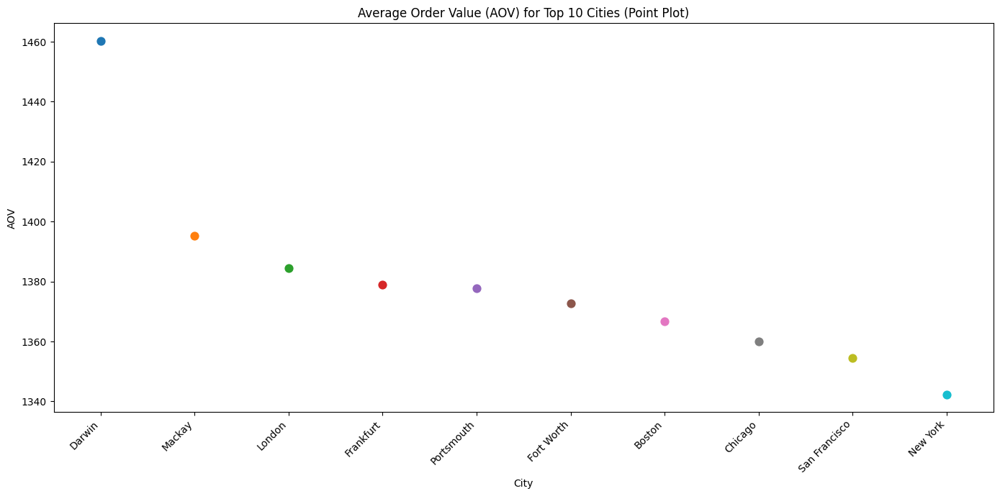

In [ ]:
# Plot AOV for Top 10 Cities using a point plot with explicit join and markers
plt.figure(figsize=(14, 7))
sns.pointplot(x=aov_top_10_cities.index, y=aov_top_10_cities.values, palette='tab10', join=True, marker='o')
plt.title('Average Order Value (AOV) for Top 10 Cities (Point Plot)')
plt.xlabel('City')
plt.ylabel('AOV')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

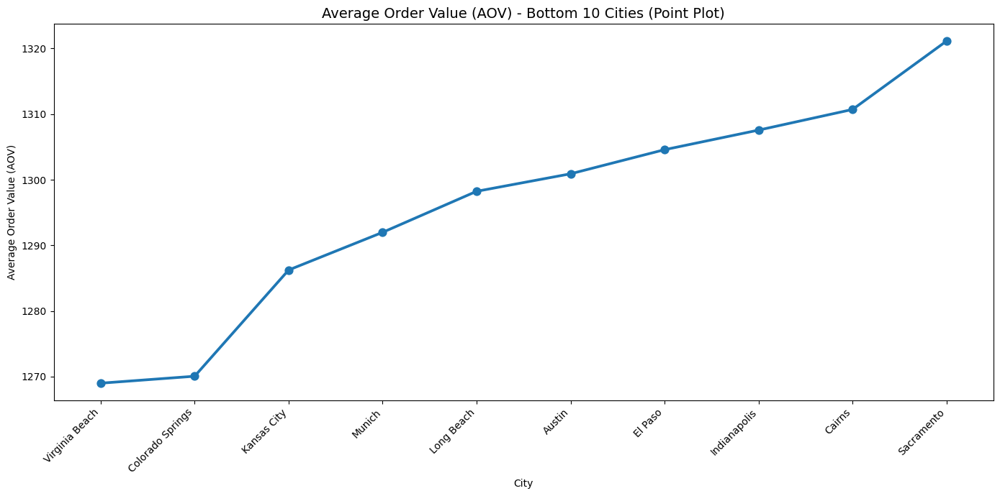

In [ ]:

aov_by_city = df.groupby('City')['Total_Amount'].mean()

# Get bottom 10 cities by AOV
aov_bottom_10_cities = aov_by_city.nsmallest(10)

# Convert to DataFrame for Seaborn
aov_bottom_10_cities_df = aov_bottom_10_cities.reset_index()
aov_bottom_10_cities_df.columns = ['City', 'AOV']

# Optional: sort for plotting
aov_bottom_10_cities_df = aov_bottom_10_cities_df.sort_values('AOV')

# Plot
plt.figure(figsize=(14, 7))
sns.pointplot(
    data=aov_bottom_10_cities_df,
    x='City',
    y='AOV',
    color='tab:blue',
    join=True,
    markers='o'
)
plt.title("Average Order Value (AOV) - Bottom 10 Cities (Point Plot)", fontsize=14)
plt.xlabel("City")
plt.ylabel("Average Order Value (AOV)")
plt.xticks(rotation=45, ha="right")
plt.tight_layout()
plt.show()


INSIGHTS
* the "Philadelphia" and "San Diego" Paradox: These are major U.S. metropolitan areas appearing on the bottom list for volume but with a mid-tier AOV. This is a critical signal. It means that when you do attract customers in these cities, they spend a reasonable amount
* Defend the high AOV cities
* Might consider Clone and Scale strategy in similar cities but with mid to low AOV ( Boston )
* Launch targeted marketing blitzes in these specific cities like Philadelphia, San Diego where AOV is already decent
* Dallas should be a top-tier revenue generator, not lagging behind smaller cities and remote international locations.

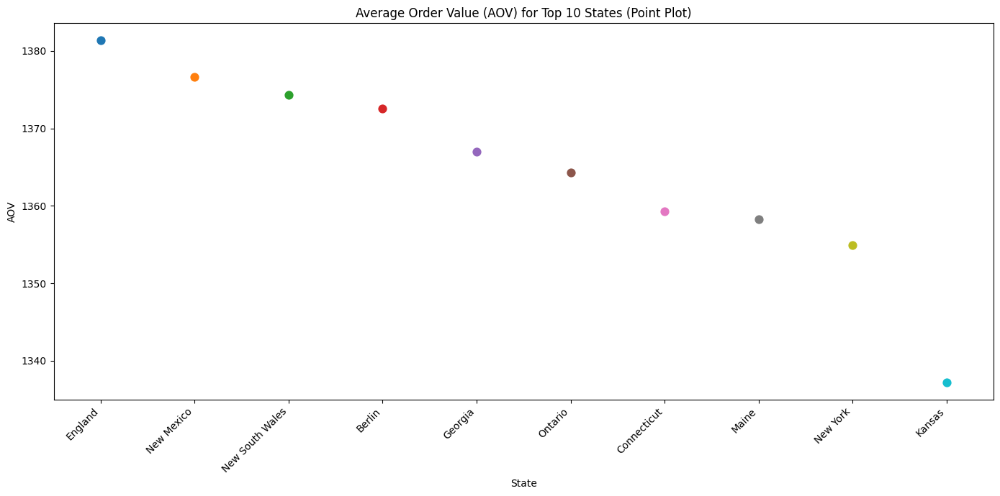

In [ ]:
# Plot AOV for Top 10 States using a point plot with explicit join and markers
plt.figure(figsize=(14, 7))
sns.pointplot(x=aov_top_10_states.index, y=aov_top_10_states.values, palette='tab10', join=True, marker='o')
plt.title('Average Order Value (AOV) for Top 10 States (Point Plot)')
plt.xlabel('State')
plt.ylabel('AOV')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()


AOV for Bottom 10 States:
 State
Washington       1453.771607
Oklahoma         1452.263040
Arizona          1431.624371
Vermont          1419.711069
Alaska           1410.626063
Colorado         1377.562540
Idaho            1376.656254
Rhode Island     1313.211652
Tennessee        1293.292367
Massachusetts    1245.642641
Name: Total_Amount, dtype: float64


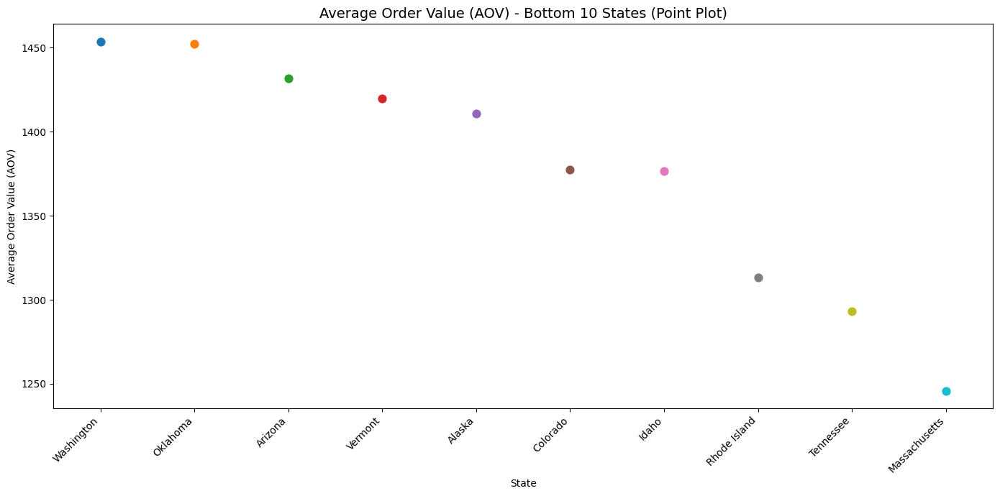

In [ ]:
# Get the bottom 10 states based on frequency of transactions
bottom_10_states = df_clean['State'].value_counts().nsmallest(10).index

# Filter the DataFrame for the bottom 10 states
df_bottom_states_aov = df_clean[df_clean['State'].isin(bottom_10_states)]

# Calculate AOV by State for the bottom 10 states
aov_bottom_10_states = (
    df_bottom_states_aov.groupby('State')['Total_Amount']
    .mean()
    .sort_values(ascending=False)
)

print("\nAOV for Bottom 10 States:\n", aov_bottom_10_states)

# Convert to DataFrame for seaborn
aov_bottom_10_states_df = aov_bottom_10_states.reset_index()
aov_bottom_10_states_df.columns = ['State', 'AOV']

# --- Point Plot ---
plt.figure(figsize=(14, 7))
sns.pointplot(
    data=aov_bottom_10_states_df,
    x='State',
    y='AOV',
    palette='tab10',
    join=True,
    markers='o'
)
plt.title("Average Order Value (AOV) - Bottom 10 States (Point Plot)", fontsize=14)
plt.xlabel("State")
plt.ylabel("Average Order Value (AOV)")
plt.xticks(rotation=45, ha="right")
plt.tight_layout()
plt.show()


# 9. Exploratory Data Analysis - Multivariate Analysis

* Utility function to create the composition stacked bar
* Top 10 States revenue distribution with respect to different features
* Different countries revenue distribution with respect to different features
* Top 10 Brand Revenue Distribution Across Different Features
* Top 10 Product Type Revenue Distribution Across Different Features
* Product Category Multivariate Analysis With Different Features
* Other Features Relations Analysis

## A. Utility function for stacked bar plots

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from typing import List, Literal, Optional


def plot_categorical_composition_stacked_bar(
    df: pd.DataFrame,
    main_category_column: str,
    composition_column: str,
    aggregation_kpi: str,
    agg_type: Literal['sum', 'mean', 'median', 'count'] = 'sum',  # ✅ added 'count'
    n: Optional[int] = 10,
    top_or_bottom: Literal['top', 'bottom'] = 'top',
    sort_by_total_kpi: bool = True,
    title: str = None,
    x_label: str = 'Proportion (%)',
    y_label: str = None,
    legend_title: str = None,
    colormap: str = 'viridis',
    figsize: tuple = (18, 7)
):
    # --- Input Validation ---
    if main_category_column not in df.columns:
        print(f"Error: Main category column '{main_category_column}' not found in DataFrame.")
        return
    if composition_column not in df.columns:
        print(f"Error: Composition column '{composition_column}' not found in DataFrame.")
        return
    if aggregation_kpi not in df.columns:
        print(f"Error: Aggregation KPI '{aggregation_kpi}' not found in DataFrame.")
        return
    if top_or_bottom not in ['top', 'bottom']:
        print("Error: 'top_or_bottom' must be 'top' or 'bottom'.")
        return
    if agg_type not in ['sum', 'mean', 'median', 'count']:  # ✅ added 'count'
        print(f"Error: Invalid 'agg_type'. Must be one of: 'sum', 'mean', 'median', 'count'.")
        return
    if agg_type != 'count' and not pd.api.types.is_numeric_dtype(df[aggregation_kpi]):
        print(f"Error: Aggregation KPI '{aggregation_kpi}' must be numeric for agg_type '{agg_type}'.")
        return

    # --- Group and Aggregate ---
    if agg_type == "count":
        grouped_data = df.groupby([main_category_column, composition_column])[aggregation_kpi].count()
    else:
        grouped_data = df.groupby([main_category_column, composition_column])[aggregation_kpi].agg(agg_type)

    pivot_table_kpi = grouped_data.unstack(fill_value=0)

    # --- Top/Bottom N selection ---
    if n is not None:
        main_category_kpi_totals = pivot_table_kpi.sum(axis=1)
        if sort_by_total_kpi:
            if top_or_bottom == 'top':
                selected_main_categories = main_category_kpi_totals.nlargest(n).index
            else:
                selected_main_categories = main_category_kpi_totals.nsmallest(n).index
            pivot_table_kpi = pivot_table_kpi.loc[pivot_table_kpi.index.isin(selected_main_categories)]
        else:
            sorted_indices = sorted(pivot_table_kpi.index)
            if top_or_bottom == 'top':
                selected_main_categories = sorted_indices[:n]
            else:
                selected_main_categories = sorted_indices[-n:]
            pivot_table_kpi = pivot_table_kpi.loc[selected_main_categories]

    if sort_by_total_kpi:
        main_category_kpi_totals = pivot_table_kpi.sum(axis=1)  # ✅ ensure it's defined
        pivot_table_kpi = pivot_table_kpi.loc[
            main_category_kpi_totals.reindex(pivot_table_kpi.index)
            .sort_values(ascending=False if top_or_bottom == 'top' else True).index
        ]

    # --- Percentages ---
    percentage_pivot_table = pivot_table_kpi.apply(lambda r: r / r.sum(), axis=1) * 100
    percentage_pivot_table.replace([np.inf, -np.inf], np.nan, inplace=True)
    percentage_pivot_table.fillna(0, inplace=True)

    # --- Plotting (unchanged from your version) ---
    sns.set_style("whitegrid")
    plt.figure(figsize=figsize)
    ax = percentage_pivot_table.plot(
        kind='barh',
        stacked=True,
        cmap=colormap,
        ax=plt.gca(),
        edgecolor='black',
        width=0.8
    )
    for container in ax.containers:
        labels = [f'{w:.1f}%' if w > 0.0 else '' for w in container.datavalues]
        ax.bar_label(container, labels=labels, label_type='center', fontsize=9, color='black', fontweight='bold')

    if title is None:
        title_prefix = f'{top_or_bottom.title()} {n}' if n else 'Overall'
        title = (f'{title_prefix} {main_category_column.replace("_", " ").title()} '
                 f'Composition by {composition_column.replace("_", " ").title()} '
                 f'({agg_type.title()} {aggregation_kpi.replace("_", " ").title()})')
    plt.title(title, fontsize=16, fontweight='bold')
    plt.xlabel(x_label, fontsize=12)
    if y_label is None:
        y_label = main_category_column.replace("_", " ").title()
    plt.ylabel(y_label, fontsize=12)
    plt.xticks(fontsize=10)
    plt.yticks(fontsize=10)
    plt.xlim(0, 100)
    plt.grid(False)
    plt.gca().spines['right'].set_visible(False)
    plt.gca().spines['top'].set_visible(False)
    plt.gca().spines['left'].set_visible(False)
    if legend_title is None:
        legend_title = composition_column.replace("_", " ").title()
    plt.legend(title=legend_title, bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=10)
    plt.tight_layout(rect=[0, 0, 0.85, 1])
    plt.show()


## B. Top 10 States revenue distribution with respect to different features

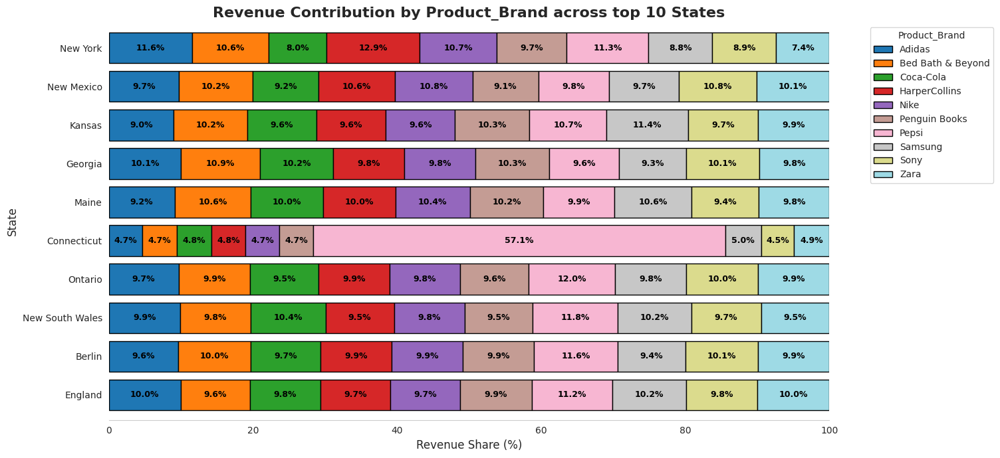

In [ ]:
x = "Product_Brand"

# Find top 10 product types by Total_Amount
top_types = (
    df.groupby(x)["Total_Amount"]
    .sum()
    .nlargest(10)
    .index
)

# Filter df to only include top 10 product types
df_top = df[df[x].isin(top_types)]

plot_categorical_composition_stacked_bar(
    df=df_top,
    main_category_column="State",
    composition_column=x,
    aggregation_kpi="Total_Amount",
    agg_type="sum",
    n=10,
    title=f"Revenue Contribution by {x} across top 10 States",
    y_label="State",
    x_label="Revenue Share (%)",
    legend_title=x,
    colormap="tab20"
)

**Analysis for Revenue Contribution by Product_Brand across top 10 States:**

*   The revenue contribution of product brands is relatively consistent across the top 10 states.
*   Connecticut shows a significantly different distribution, with a much higher revenue share from the "Mitsubhisi" brand.

**Business Insight:**

*   The market for these product brands appears to be relatively balanced across the top 10 states, with the exception of Connecticut.
*   Investigate the reasons for "Mitsubhisi"'s high revenue share in Connecticut to understand potential regional preferences or targeted marketing effectiveness.

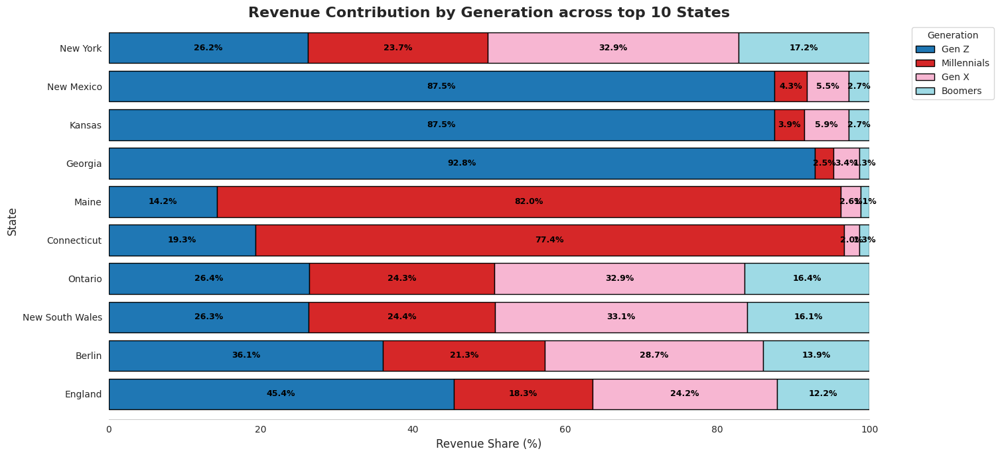

In [ ]:
x = "Generation"

plot_categorical_composition_stacked_bar(
    df=df,
    main_category_column="State",
    composition_column=x,
    aggregation_kpi="Total_Amount",
    agg_type="sum",
    n=10,
    title=f"Revenue Contribution by {x} across top 10 States",
    y_label="State",
    x_label="Revenue Share (%)",
    legend_title=x,
    colormap="tab20"
)

**Analysis for Revenue Contribution by Generation across top 10 States:**

*   The distribution of revenue across generations varies significantly across the top 10 states.
*   New Mexico and Georgia show a very high revenue share from Millennials.
*   Maine and Connecticut show a very high revenue share from Gen X.
*   New York and Ontario show a more balanced distribution across Gen Z, Millennials, and Gen X.

**Business Insight:**

*   Tailor marketing campaigns and product offerings to the dominant generational cohorts within each state.
*   Explore strategies to increase engagement and spending from less dominant generations in each state.

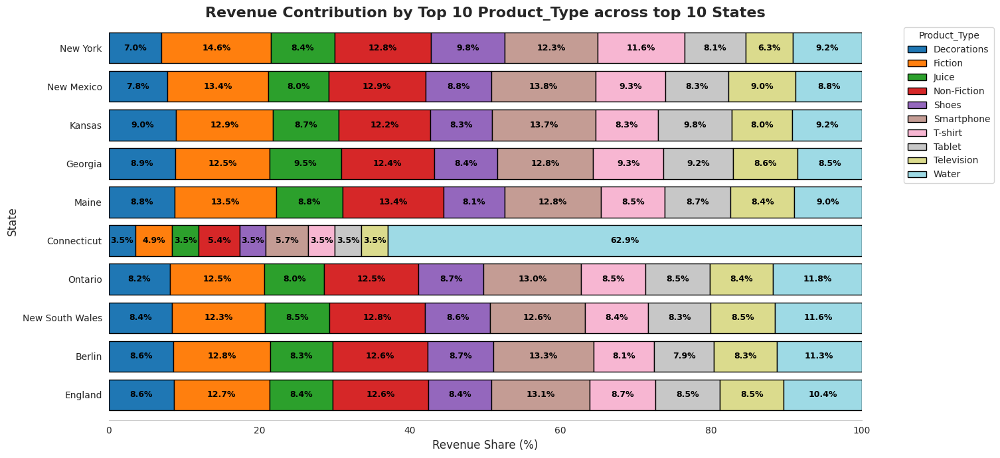

In [ ]:
x = "Product_Type"

# Find top 10 product types by Total_Amount
top_types = (
    df.groupby(x)["Total_Amount"]
    .sum()
    .nlargest(10)
    .index
)

# Filter df to only include top 10 product types
df_top = df[df[x].isin(top_types)]

# Plot
plot_categorical_composition_stacked_bar(
    df=df_top,
    main_category_column="State",
    composition_column=x,
    aggregation_kpi="Total_Amount",
    agg_type="sum",
    n=10,  # still keeps top 10 countries
    title=f"Revenue Contribution by Top 10 {x} across top 10 States",
    y_label="State",
    x_label="Revenue Share (%)",
    legend_title=x,
    colormap="tab20"
)

**Analysis for Revenue Contribution by Top 10 Product_Type across top 10 States:**

*   The revenue contribution of the top 10 product types varies across the top 10 states.
*   Connecticut shows a significantly different distribution, with a much higher revenue share from the "Television" product type.
*   New York, New Mexico, Kansas, Georgia, and Maine show a more balanced distribution across the top product types.

**Business Insight:**

*   The popularity and revenue contribution of the top product types are not consistent across all states.
*   Investigate the reasons for the high revenue contribution of "Television" in Connecticut to understand potential regional preferences or targeted marketing effectiveness for this product type.

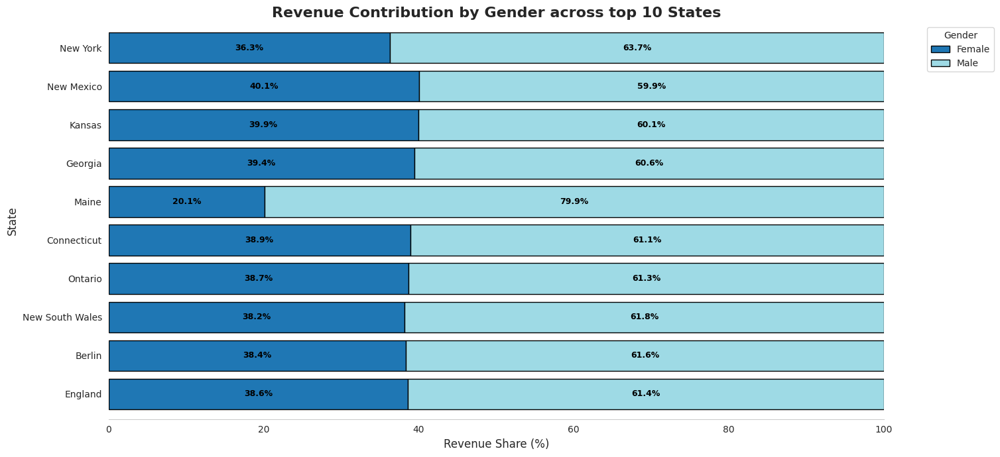

In [ ]:
x = "Gender"

plot_categorical_composition_stacked_bar(
    df=df,
    main_category_column="State",
    composition_column=x,
    aggregation_kpi="Total_Amount",
    agg_type="sum",
    n=10,
    title=f"Revenue Contribution by {x} across top 10 States",
    y_label="State",
    x_label="Revenue Share (%)",
    legend_title=x,
    colormap="tab20"
)

**Analysis for Revenue Contribution by Gender across top 10 States:**

*   Male customers contribute a consistently higher percentage of revenue across all top 10 states compared to female customers.
*   Maine shows a particularly high revenue share from male customers.

**Business Insight:**

*   Develop targeted marketing campaigns and product offerings to increase female customer engagement and spending in all states, with a particular focus on Maine.
*   Analyze potential reasons for the lower revenue contribution from female customers in each state to inform these strategies.

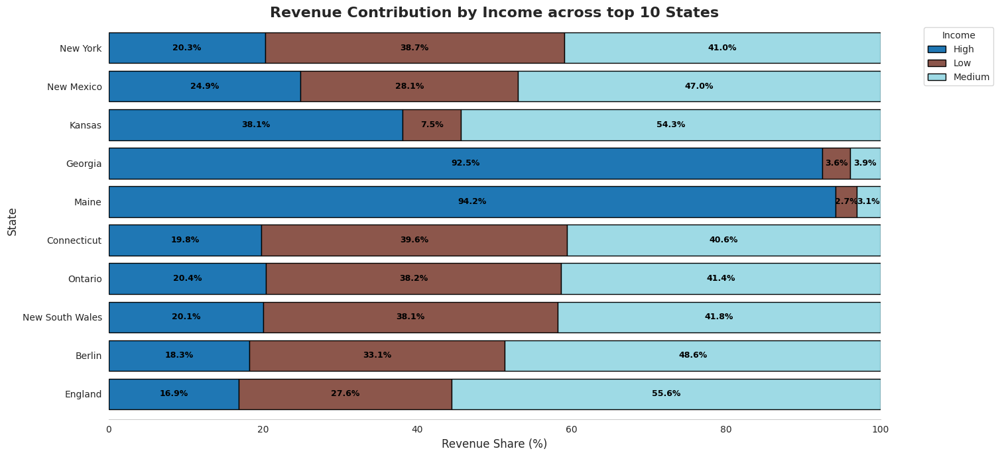

In [ ]:
x = "Income"

plot_categorical_composition_stacked_bar(
    df=df,
    main_category_column="State",
    composition_column=x,
    aggregation_kpi="Total_Amount",
    agg_type="sum",
    n=10,
    title=f"Revenue Contribution by {x} across top 10 States",
    y_label="State",
    x_label="Revenue Share (%)",
    legend_title=x,
    colormap="tab20"
)

**Analysis for Revenue Contribution by Income across top 10 States:**

*   The distribution of revenue across income levels varies significantly across the top 10 states.
*   New York and Connecticut show a higher revenue share from the "High" income group.
*   New Mexico, Kansas, Georgia, and Maine show a very high revenue share from the "Low" income group.
*   England and Berlin show a higher revenue share from the "Medium" income group.

**Business Insight:**

*   Tailor marketing and product strategies to the dominant income groups within each state.
*   Consider offering a range of products at different price points to cater to the diverse income levels in each state.

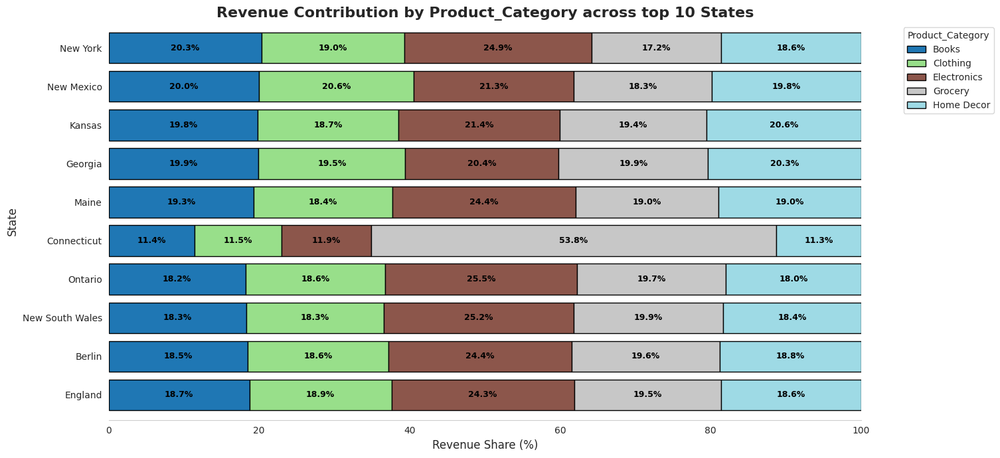

In [ ]:
x = "Product_Category"

plot_categorical_composition_stacked_bar(
    df=df,
    main_category_column="State",
    composition_column=x,
    aggregation_kpi="Total_Amount",
    agg_type="sum",
    n=10,
    title=f"Revenue Contribution by {x} across top 10 States",
    y_label="State",
    x_label="Revenue Share (%)",
    legend_title=x,
    colormap="tab20"
)

**Analysis for Revenue Contribution by Product_Category across top 10 States:**

*   The revenue contribution of product categories is relatively consistent across most of the top 10 states.
*   Connecticut shows a significantly different distribution, with a much higher revenue share from the "Electronics" product category.

**Business Insight:**

*   The market for these product categories appears to be relatively balanced across most of the top 10 states, with the exception of Connecticut.
*   Investigate the reasons for the high revenue contribution of "Electronics" in Connecticut to understand potential regional preferences or targeted marketing effectiveness.

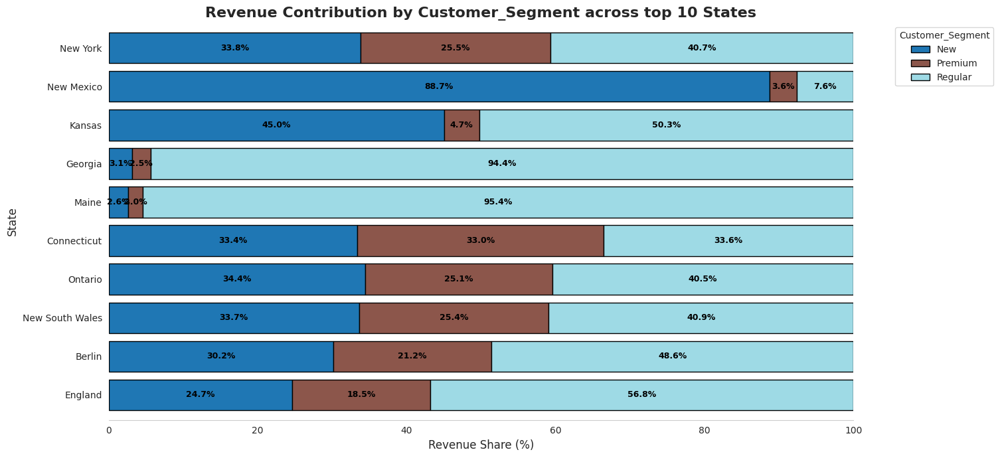

In [ ]:
x = "Customer_Segment"

plot_categorical_composition_stacked_bar(
    df=df,
    main_category_column="State",
    composition_column=x,
    aggregation_kpi="Total_Amount",
    agg_type="sum",
    n=10,
    title=f"Revenue Contribution by {x} across top 10 States",
    y_label="State",
    x_label="Revenue Share (%)",
    legend_title=x,
    colormap="tab20"
)

**Analysis for Revenue Contribution by Customer_Segment across top 10 States:**

*   The distribution of customer segments (New, Premium, Regular) varies significantly across the top 10 states.
*   New Mexico, Georgia, and Maine show a very high revenue share from "Regular" customers.
*   New York, Connecticut, Ontario, New South Wales, Berlin, and England show a more balanced distribution across customer segments.

**Business Insight:**

*   Tailor customer retention and acquisition strategies to the dominant customer segments within each state.
*   Focus on retaining and growing the "Regular" customer base in states where they contribute significantly.

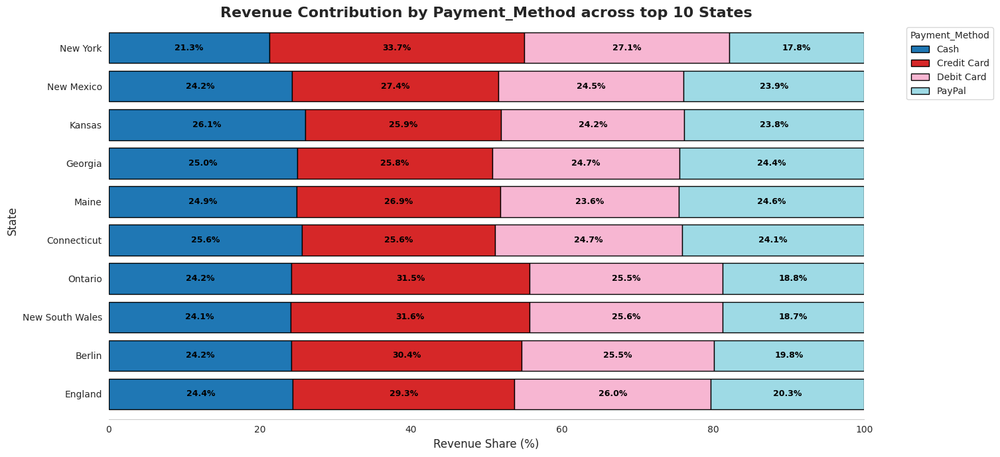

In [ ]:
x = "Payment_Method"

plot_categorical_composition_stacked_bar(
    df=df,
    main_category_column="State",
    composition_column=x,
    aggregation_kpi="Total_Amount",
    agg_type="sum",
    n=10,
    title=f"Revenue Contribution by {x} across top 10 States",
    y_label="State",
    x_label="Revenue Share (%)",
    legend_title=x,
    colormap="tab20"
)

**Analysis for Revenue Contribution by Payment_Method across top 10 States:**

*   The distribution of revenue across payment methods is relatively consistent across the top 10 states.
*   "Credit Card" and "Debit Card" are the most common payment methods in most states.

**Business Insight:**

*   Customer payment preferences are generally consistent across these states.
*   Ensure seamless experiences for Credit Card and Debit Card payments and consider exploring opportunities to increase the usage of other payment methods if desired.

## C. Different countries revenue distribution with respect to different features

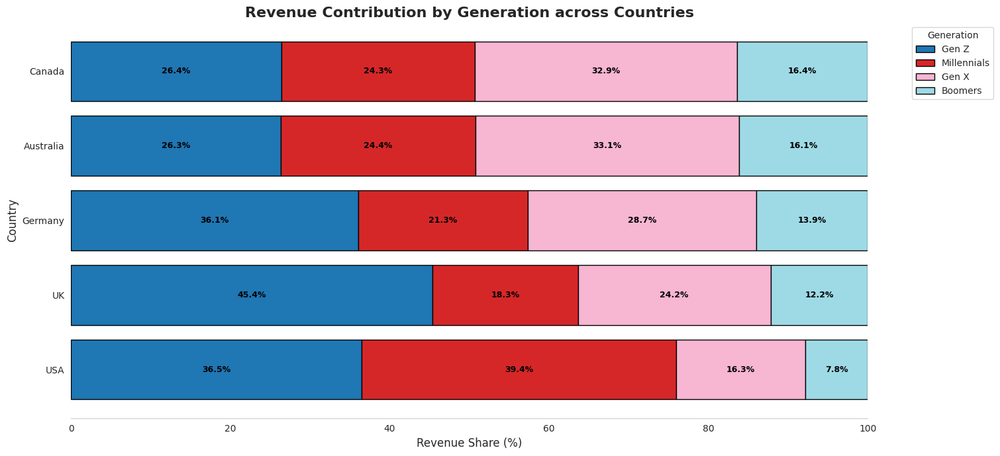

In [ ]:
plot_categorical_composition_stacked_bar(
    df=df,
    main_category_column="Country",
    composition_column="Generation",
    aggregation_kpi="Total_Amount",
    agg_type="sum",
    n=10,
    title="Revenue Contribution by Generation across Countries",
    y_label="Country",
    x_label="Revenue Share (%)",
    legend_title="Generation",
    colormap="tab20"
)


**Analysis for Revenue Contribution by Generation across Countries:**

*   The distribution of revenue across generations varies by country.
*   The USA shows a higher revenue share from Millennials and Gen Z compared to other countries.
*   The UK has a higher revenue share from Gen Z.

**Business Insight:**

*   Tailor marketing campaigns and product offerings to the dominant generational cohorts within each country.
*   Explore strategies to increase engagement and spending from less dominant generations in each region.

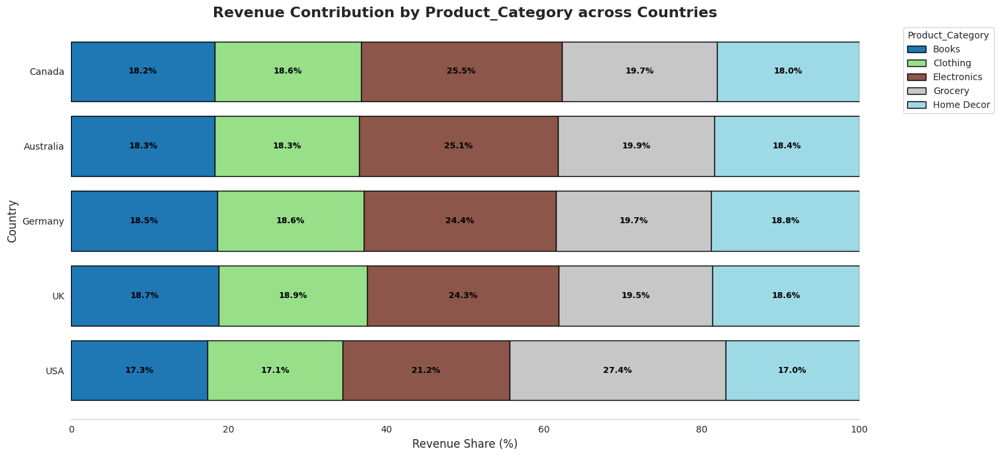

In [ ]:
plot_categorical_composition_stacked_bar(
    df=df,
    main_category_column="Country",
    composition_column="Product_Category",
    aggregation_kpi="Total_Amount",
    agg_type="sum",
    n=10,
    title="Revenue Contribution by Product_Category across Countries",
    y_label="Country",
    x_label="Revenue Share (%)",
    legend_title="Product_Category",
    colormap="tab20"
)


**Analysis for Revenue Contribution by Product_Category across Countries:**

*   The revenue contribution of product categories is relatively consistent across the top 10 countries.
*   Electronics and Grocery categories generally contribute a larger share of revenue in most countries.

**Business Insight:**

*   These findings confirm that Electronics and Grocery are key revenue drivers across the analyzed countries.
*   Focus on optimizing the performance of these categories globally and explore opportunities to grow the market share of other categories in specific regions.

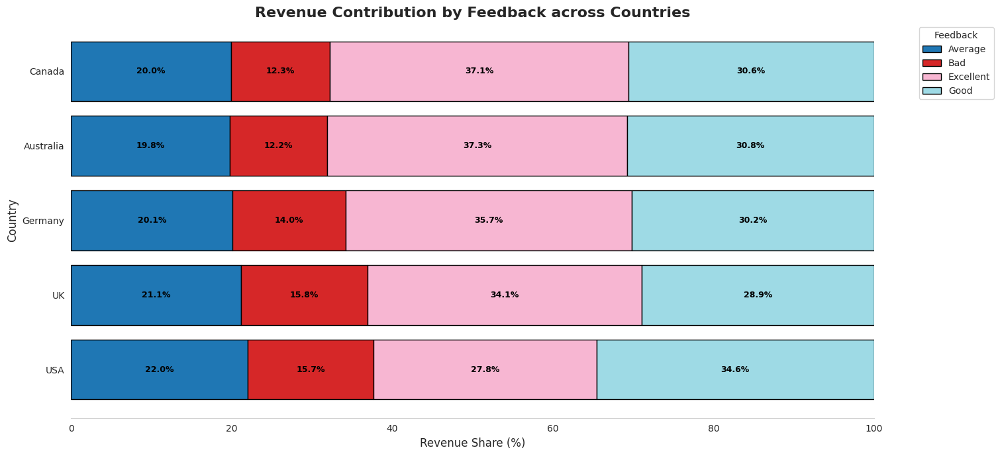

In [ ]:
plot_categorical_composition_stacked_bar(
    df=df,
    main_category_column="Country",
    composition_column="Feedback",
    aggregation_kpi="Total_Amount",
    agg_type="sum",
    n=10,
    title="Revenue Contribution by Feedback across Countries",
    y_label="Country",
    x_label="Revenue Share (%)",
    legend_title="Feedback",
    colormap="tab20"
)


**Analysis for Revenue Contribution by Feedback across Countries:**

*   The distribution of feedback categories (Average, Bad, Excellent, Good) is relatively similar across the top 10 countries.
*   The USA has a slightly higher proportion of "Good" feedback, while the UK has a slightly higher proportion of "Bad" feedback.

**Business Insight:**

*   Customer satisfaction levels, as reflected in feedback, are generally consistent across these countries.
*   Investigate the reasons for the higher proportion of "Bad" feedback in the UK and implement strategies to improve customer experience in that region.

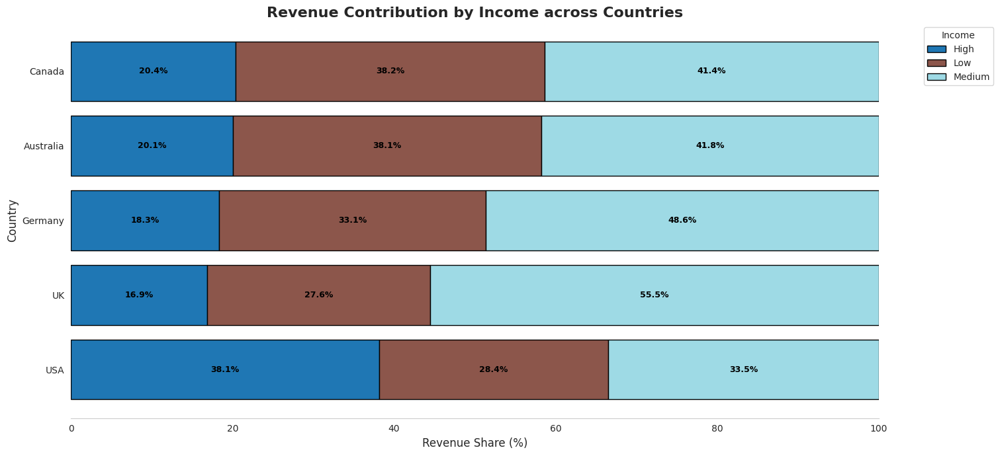

In [ ]:
plot_categorical_composition_stacked_bar(
    df=df,
    main_category_column="Country",
    composition_column="Income",
    aggregation_kpi="Total_Amount",
    agg_type="sum",
    n=10,
    title="Revenue Contribution by Income across Countries",
    y_label="Country",
    x_label="Revenue Share (%)",
    legend_title="Income",
    colormap="tab20"
)


**Analysis for Revenue Contribution by Income across Countries:**

*   The distribution of revenue across income levels varies by country.
*   The USA has a higher revenue share from the "High" income group.
*   The UK has a significantly higher revenue share from the "Medium" income group.

**Business Insight:**

*   Tailor marketing and product strategies to the dominant income groups within each country.
*   Consider offering a range of products at different price points to cater to the diverse income levels in each region.

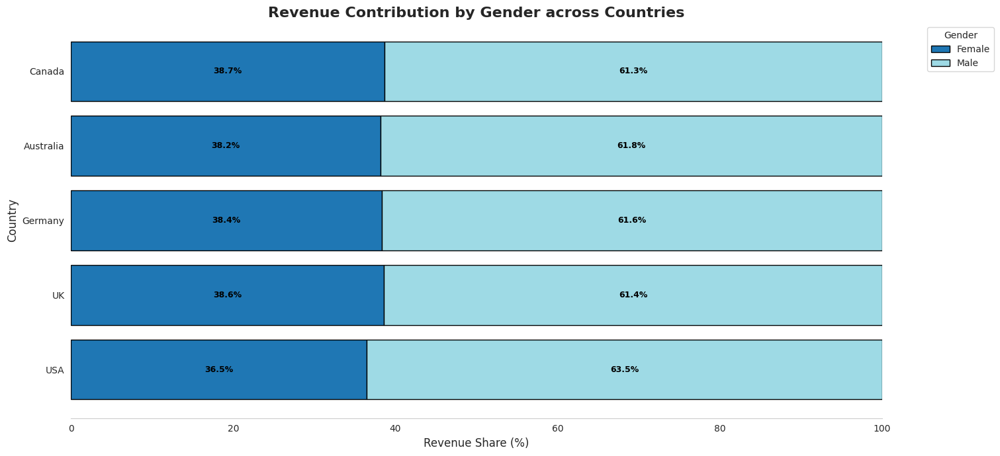

In [ ]:
plot_categorical_composition_stacked_bar(
    df=df,
    main_category_column="Country",
    composition_column="Gender",
    aggregation_kpi="Total_Amount",
    agg_type="sum",
    n=10,
    title="Revenue Contribution by Gender across Countries",
    y_label="Country",
    x_label="Revenue Share (%)",
    legend_title="Gender",
    colormap="tab20"
)


**Analysis for Revenue Contribution by Gender across Countries:**

*   Male customers contribute a consistently higher percentage of revenue across all top 10 countries compared to female customers.

**Business Insight:**

*   Develop targeted marketing campaigns and product offerings to increase female customer engagement and spending in all countries.
*   Analyze potential reasons for the lower revenue contribution from female customers in each region to inform these strategies.

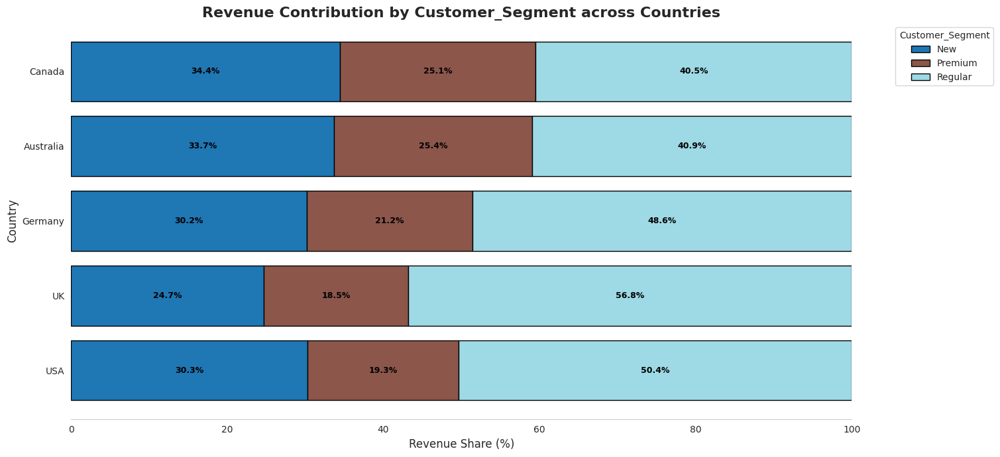

In [ ]:
plot_categorical_composition_stacked_bar(
    df=df,
    main_category_column="Country",
    composition_column="Customer_Segment",
    aggregation_kpi="Total_Amount",
    agg_type="sum",
    n=10,
    title="Revenue Contribution by Customer_Segment across Countries",
    y_label="Country",
    x_label="Revenue Share (%)",
    legend_title="Customer_Segment",
    colormap="tab20"
)


**Analysis for Revenue Contribution by Customer_Segment across Countries:**

*   The distribution of customer segments (New, Premium, Regular) varies by country.
*   The UK and USA have a higher revenue share from "Regular" customers compared to other countries.
*   Canada and Australia have a higher revenue share from "New" customers.

**Business Insight:**

*   Tailor customer retention and acquisition strategies to the dominant customer segments within each country.
*   Focus on converting "New" customers to "Regular" customers in Canada and Australia, and on retaining and growing the "Regular" customer base in the UK and USA.

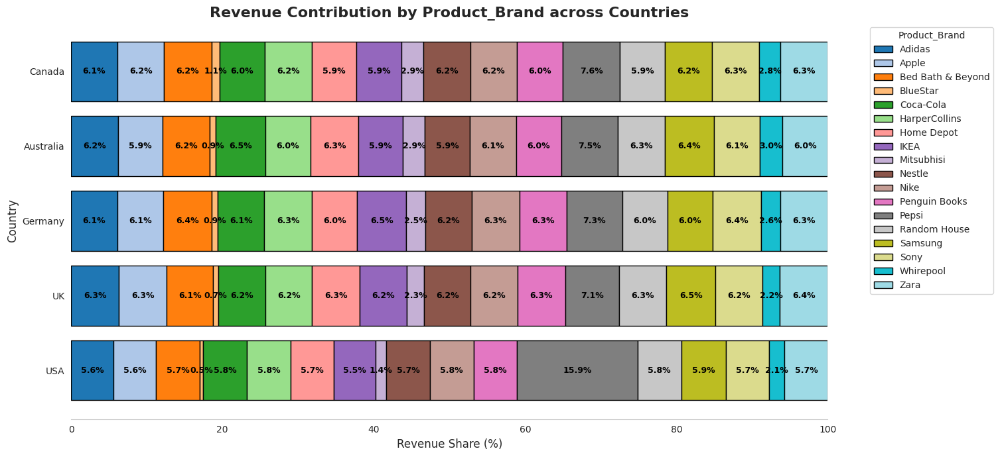

In [ ]:
x = "Product_Brand"

plot_categorical_composition_stacked_bar(
    df=df,
    main_category_column="Country",
    composition_column=x,
    aggregation_kpi="Total_Amount",
    agg_type="sum",
    n=10,
    title=f"Revenue Contribution by {x} across Countries",
    y_label="Country",
    x_label="Revenue Share (%)",
    legend_title=x,
    colormap="tab20"
)


**Analysis for Revenue Contribution by Product_Brand across Countries:**

*   The revenue contribution of product brands is relatively consistent across the top 10 countries, with each brand contributing a similar percentage of revenue within each country.
*   Pepsi shows a notably higher revenue share in the USA compared to other brands in that country and compared to Pepsi's performance in other countries.

**Business Insight:**

*   The market for these product brands appears to be relatively balanced across the analyzed countries.
*   Further investigate the factors contributing to Pepsi's strong performance in the USA to potentially replicate this success in other regions or for other brands.

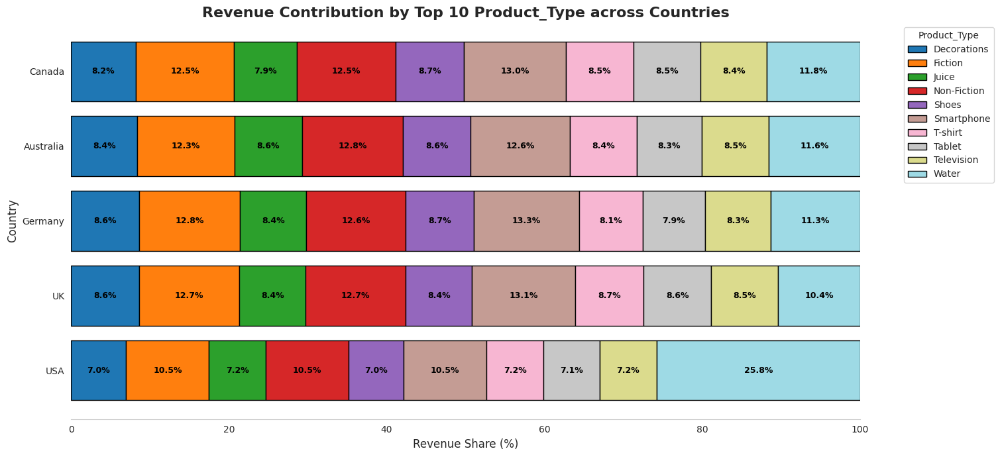

In [ ]:
x = "Product_Type"

# Find top 10 product types by Total_Amount
top_types = (
    df.groupby(x)["Total_Amount"]
    .sum()
    .nlargest(10)
    .index
)

# Filter df to only include top 10 product types
df_top = df[df[x].isin(top_types)]

# Plot
plot_categorical_composition_stacked_bar(
    df=df_top,
    main_category_column="Country",
    composition_column=x,
    aggregation_kpi="Total_Amount",
    agg_type="sum",
    n=None,  # still keeps top 10 countries
    title=f"Revenue Contribution by Top 10 {x} across Countries",
    y_label="Country",
    x_label="Revenue Share (%)",
    legend_title=x,
    colormap="tab20"
)



**Analysis for Revenue Contribution by Top 10 Product_Type across Countries:**

*   The revenue contribution of the top 10 product types is relatively consistent across the analyzed countries.
*   "Water" contributes a significantly higher revenue share in the USA compared to other product types and compared to "Water"'s performance in other countries.

**Business Insight:**

*   The popularity and revenue contribution of the top product types are generally consistent globally.
*   Investigate the reasons for the high revenue contribution of "Water" in the USA to inform product and marketing strategies for this product type in other regions.

## D. Top 10 Brand Revenue Distribution Across Different Features

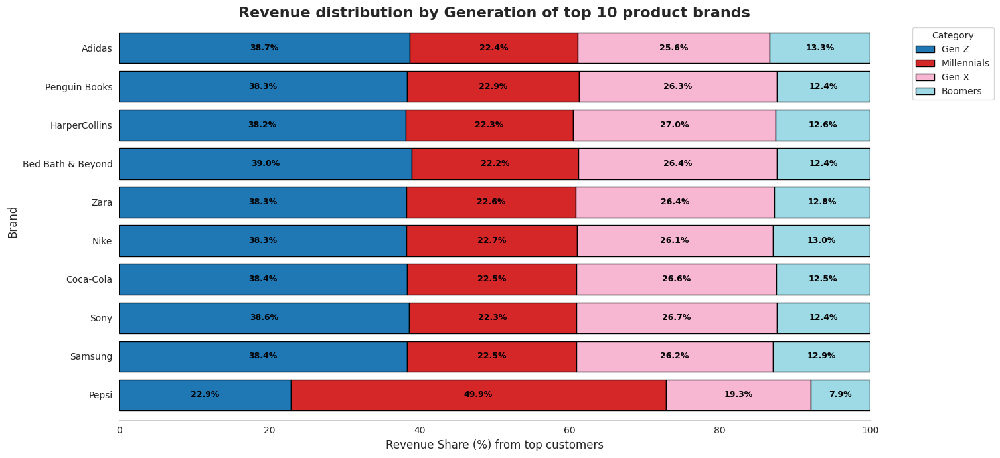

In [ ]:
plot_categorical_composition_stacked_bar(
    df=df,
    main_category_column="Product_Brand",
    composition_column="Generation",
    aggregation_kpi="Total_Amount",
    agg_type="sum",
    n=10,
    top_or_bottom="top",
    sort_by_total_kpi=True,
    title="Revenue distribution by Generation of top 10 product brands",
    y_label="Brand",
    x_label="Revenue Share (%) from top customers",
    legend_title="Category",
    colormap="tab20",
    # figsize=(14,7)
)

**Analysis for Revenue distribution by Generation of top 10 product brands:**

*   Most brands show **Gen Z dominance** (~38–39%).  
*   **Pepsi is an outlier**, driven heavily by Millennials (49.9%).  
*   Gen X (26%) and Boomers (12–13%) are relatively consistent across brands.  

**Business Insight:**

*   Double down on **Gen Z engagement** across apparel, tech, and lifestyle brands.  
*   For **Pepsi**, lean into **Millennial-focused campaigns**.  
*   Maintain **steady retention strategies** for Gen X and Boomers.  


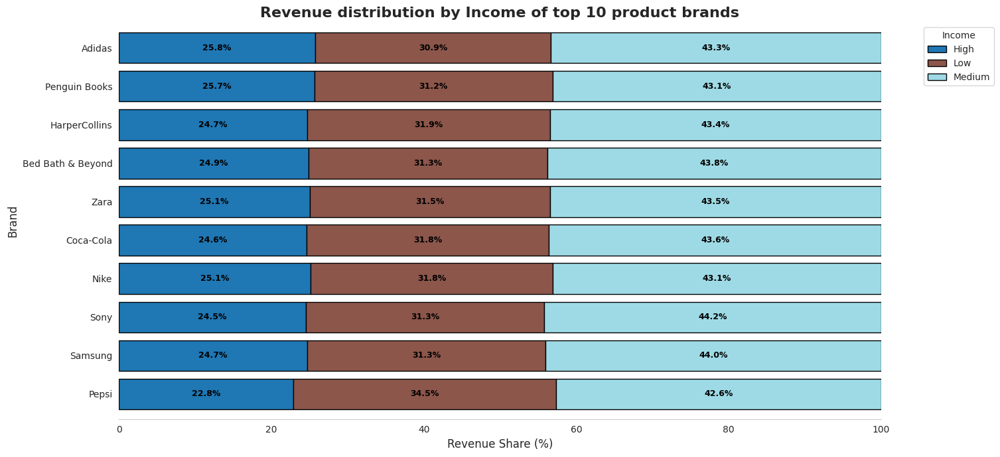

In [ ]:
plot_categorical_composition_stacked_bar(
    df=df,
    main_category_column="Product_Brand",
    composition_column="Income",
    aggregation_kpi="Total_Amount",
    agg_type="sum",
    n=10,
    top_or_bottom="top",
    sort_by_total_kpi=True,
    title="Revenue distribution by Income of top 10 product brands",
    y_label="Brand",
    x_label="Revenue Share (%)",
    legend_title="Income",
    colormap="tab20",
    # figsize=(14,7)
)

**Analysis for Revenue distribution by Income of top 10 product brands:**

*   **Medium-income** dominates (~43–44%) across brands.  
*   **Low-income** steady (~31–32%).  
*   **High-income** smaller (~25%), lowest for Pepsi (22.8%).  

**Business Insight:**

*   Focus on **medium-income buyers** as core market.  
*   Create **value deals** for low-income groups.  
*   Use **premium positioning** for selective high-income targeting.  


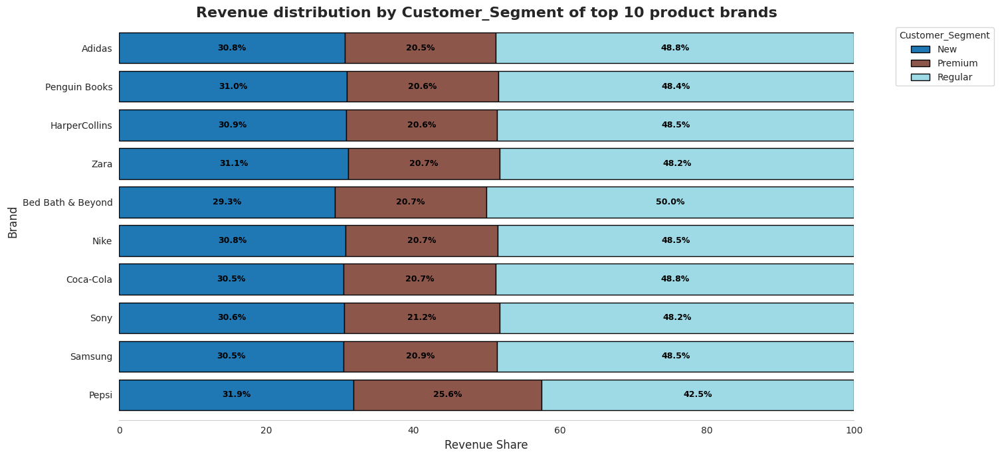

In [ ]:
plot_categorical_composition_stacked_bar(
    df=df,
    main_category_column="Product_Brand",
    composition_column="Customer_Segment",
    aggregation_kpi="Total_Amount",
    agg_type="sum",
    n=10,
    top_or_bottom="top",
    sort_by_total_kpi=True,
    title="Revenue distribution by Customer_Segment of top 10 product brands",
    y_label="Brand",
    x_label="Revenue Share",
    legend_title="Customer_Segment",
    colormap="tab20",
    # figsize=(14,7)
)

**Analysis for Revenue distribution by Customer Segment of top 10 product brands:**

*   **Regular customers** dominate (~48–50%).  
*   **Pepsi stands out** with higher Premium share (25.6%).  

**Business Insight:**

*   Strengthen **loyalty programs** for regulars.  
*   For Pepsi, expand **premium-focused campaigns**.  


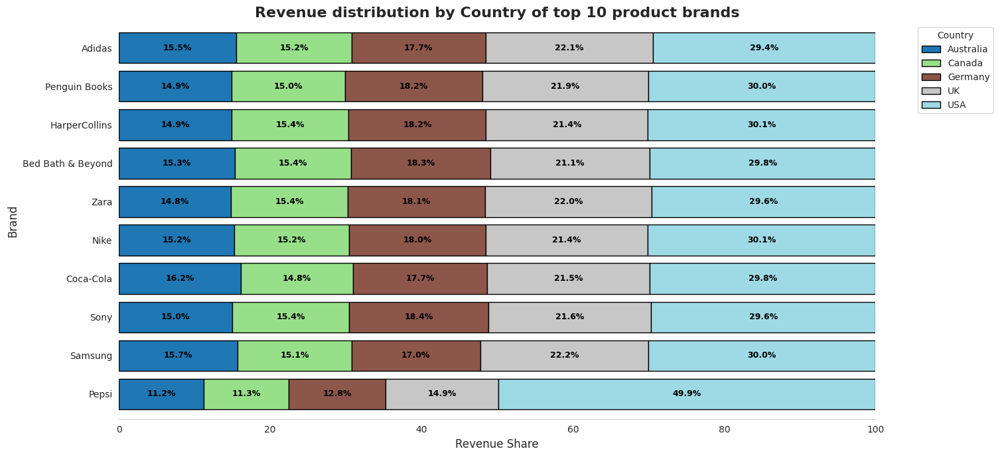

In [ ]:
plot_categorical_composition_stacked_bar(
    df=df,
    main_category_column="Product_Brand",
    composition_column="Country",
    aggregation_kpi="Total_Amount",
    agg_type="sum",
    n=10,
    top_or_bottom="top",
    sort_by_total_kpi=True,
    title="Revenue distribution by Country of top 10 product brands",
    y_label="Brand",
    x_label="Revenue Share",
    legend_title="Country",
    colormap="tab20",
    # figsize=(14,7)
)

**Analysis for Revenue distribution by Country of top 10 product brands:**

*   **USA dominates** across brands (~30%), especially Pepsi (49.9%).  
*   Other countries (Australia, Canada, Germany, UK) stay balanced (~15–22%).  

**Business Insight:**

*   Strengthen **US-focused campaigns** for higher ROI.  
*   For balanced markets, apply **localized strategies** to maintain share.  


## E. Top 10 Product Type Revenue Distribution Across Different Features

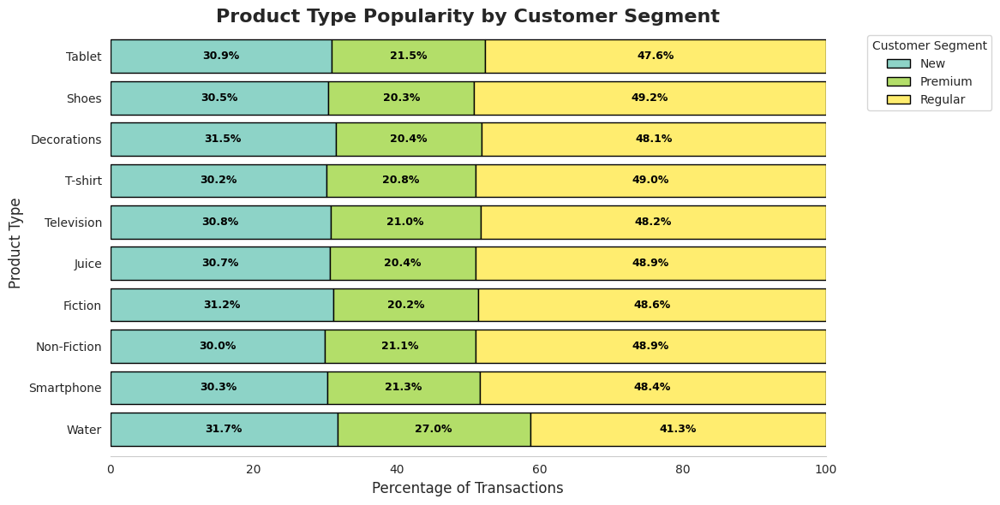

In [ ]:
# Product Type popularity by Customer Segment ---
plot_categorical_composition_stacked_bar(
    df=df,
    main_category_column="Product_Type",
    composition_column="Customer_Segment",
    aggregation_kpi="Transaction_ID",   # transaction counts
    agg_type="count",
    n=10,   # limit to top 10 product types for readability
    top_or_bottom="top",
    sort_by_total_kpi=True,
    title="Product Type Popularity by Customer Segment",
    x_label="Percentage of Transactions",
    y_label="Product Type",
    legend_title="Customer Segment",
    colormap="Set3",
    figsize=(14,6)
)


**Analysis for Product Type × Customer Segment Popularity:**

*   Across most product types, **Regular customers dominate** transactions (~48–49%).
*   **New customers** consistently contribute 30%, while **Premium customers** remain lower (~20–21%).
*   An exception is **Water**, where Premium customers (27%) have a stronger presence compared to other product types.

**Business Insight:**

*   Revenue growth largely depends on **Regular customers**, so retaining them is crucial.
*   **Premium customer base is underutilized** — targeted campaigns and loyalty programs could shift more Premium engagement.
*   **Water stands out** as a segment with relatively higher Premium appeal → opportunity to expand Premium-focused marketing for similar essential categories.


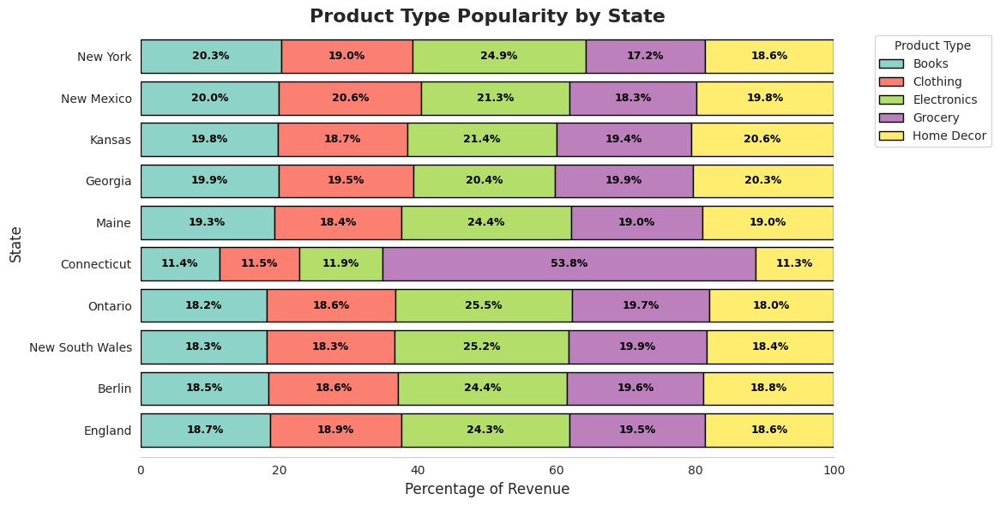

In [ ]:
# Product Type popularity by State ---
plot_categorical_composition_stacked_bar(
    df=df,
    main_category_column="State",
    composition_column="Product_Category",
    aggregation_kpi="Total_Amount",   # transaction counts
    agg_type="sum",
    n=10,   # limit to top 10 product types for readability
    top_or_bottom="top",
    sort_by_total_kpi=True,
    title="Product Type Popularity by State",
    x_label="Percentage of Revenue",
    y_label="State",
    legend_title="Product Type",
    colormap="Set3",
    figsize=(14,6)
)


**Analysis for Product Type × State Popularity:**

*   Most states show a **balanced share** across categories (~18–25%).  
*   **Electronics** consistently lead in many states (Ontario, England, Berlin).  
*   **Connecticut is unique** with Grocery dominating (53.8%).  

**Business Insight:**

*   Push **Electronics promotions** in tech-oriented states.  
*   Leverage **Grocery dominance in Connecticut** with bundled offers.  
*   For balanced markets, apply **broad-based campaigns** to capture share across categories.  


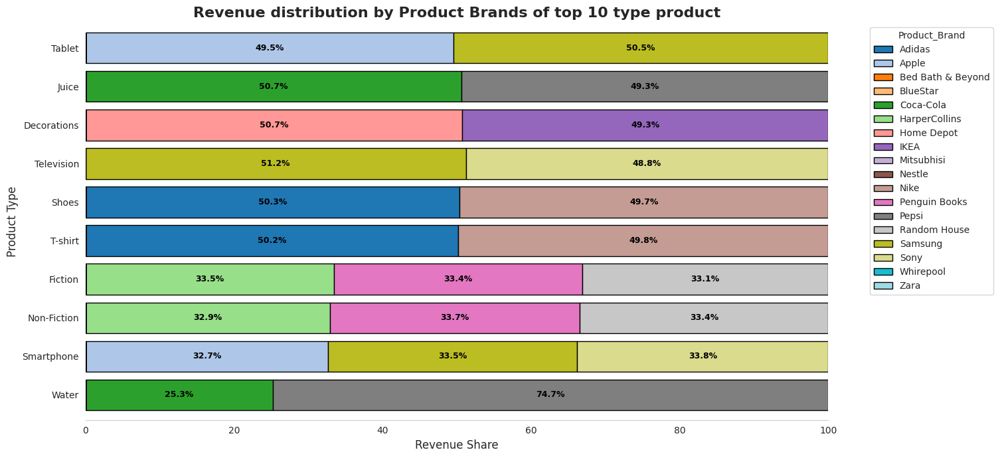

In [ ]:
plot_categorical_composition_stacked_bar(
    df=df,
    main_category_column="Product_Type",
    composition_column="Product_Brand",
    aggregation_kpi="Total_Amount",
    agg_type="sum",
    n=10,
    top_or_bottom="top",
    sort_by_total_kpi=True,
    title="Revenue distribution by Product Brands of top 10 type product",
    y_label="Product Type",
    x_label="Revenue Share",
    legend_title="Product_Brand",
    colormap="tab20",
    # figsize=(14,7)
)

**Analysis for Revenue distribution by Product Brands of top 10 product types:**

*   Most categories show **balanced split (~50/50)** across top brands.  
*   **Water is unique**, with Pepsi dominating (74.7%).  

**Business Insight:**

*   Compete with **brand-driven campaigns** in balanced markets.  
*   For Water, Pepsi should **leverage dominance** with premium pricing and brand loyalty pushes.  


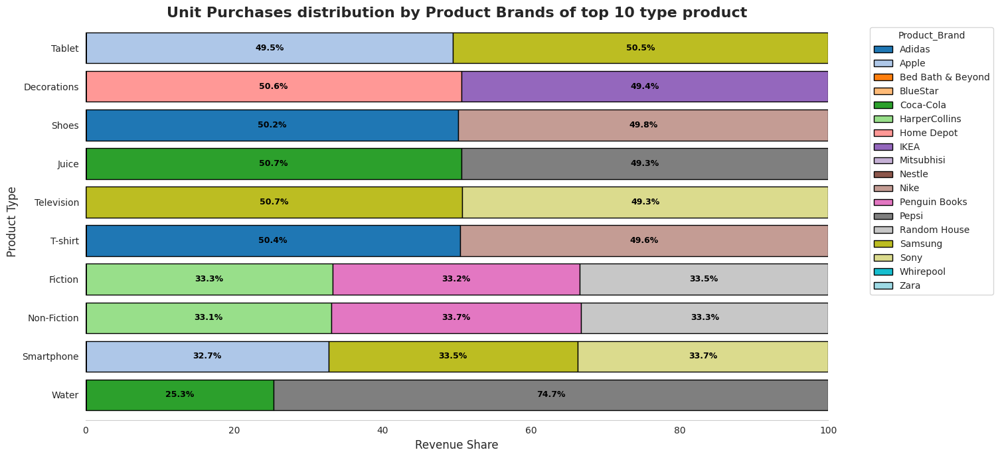

In [ ]:
plot_categorical_composition_stacked_bar(
    df=df,
    main_category_column="Product_Type",
    composition_column="Product_Brand",
    aggregation_kpi="Total_Purchases",
    agg_type="sum",
    n=10,
    top_or_bottom="top",
    sort_by_total_kpi=True,
    title="Unit Purchases distribution by Product Brands of top 10 type product",
    y_label="Product Type",
    x_label="Revenue Share",
    legend_title="Product_Brand",
    colormap="tab20",
    # figsize=(14,7)
)

**Analysis for Unit Purchases distribution by Product Brands of top 10 product types:**

*   Most categories show **balanced unit share (~50/50)**.  
*   **Water stands out**, with Pepsi dominating purchases (74.7%).  

**Business Insight:**

*   In balanced markets, focus on **brand differentiation** to gain edge.  
*   Pepsi should **capitalize on strong water dominance** with cross-sell and upsell strategies.  


## F. Product Category Multivariate Analysis With Different Features

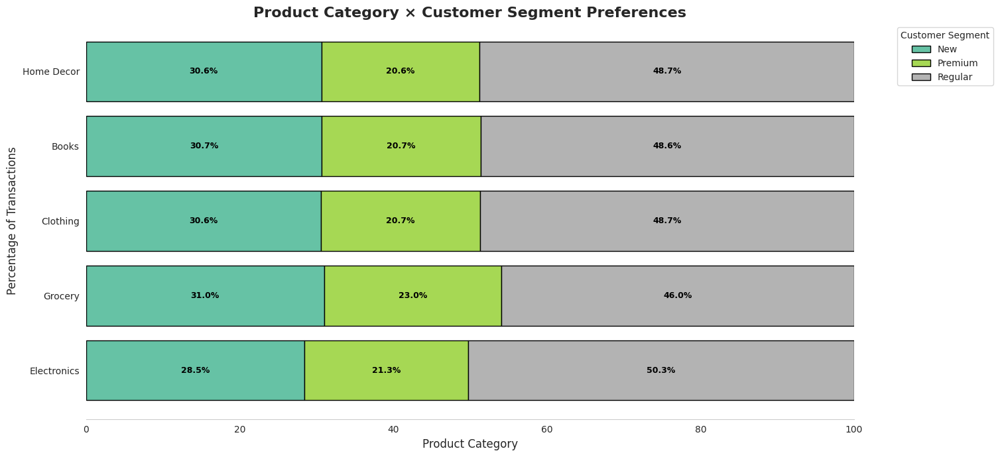

In [ ]:
plot_categorical_composition_stacked_bar(
    df=df,
    main_category_column="Product_Category",
    composition_column="Customer_Segment",
    aggregation_kpi="Transaction_ID",   # transaction counts
    agg_type="count",
    n=None,
    top_or_bottom="top",
    sort_by_total_kpi=True,
    title="Product Category × Customer Segment Preferences",
    x_label="Product Category",
    y_label="Percentage of Transactions",
    legend_title="Customer Segment",
    colormap="Set2",

)

**Analysis for Product Category × Customer Segment Preferences:**

*   The distribution of transactions across customer segments (New, Premium, Regular) is very similar for all product categories.

**Business Insight:**

*   Current strategies are reaching all segments relatively evenly across categories.
*   Consider tailoring offerings or marketing specifically for certain segments within categories to potentially improve targeting and engagement.

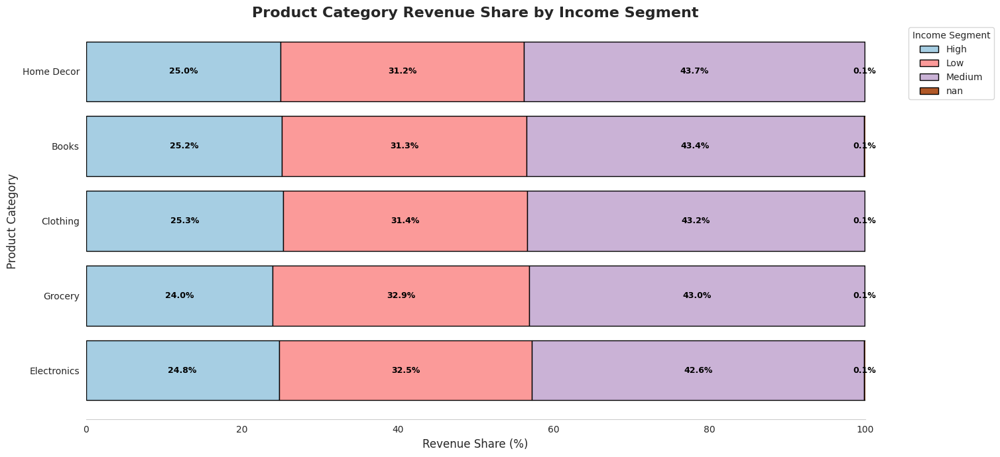

In [ ]:
# Ensure Income is categorical (e.g., 'Low','Medium','High') — if it's messy, try mapping/cleaning
df["Income_clean"] = df["Income"].astype(str).str.strip()

plot_categorical_composition_stacked_bar(
    df=df,
    main_category_column="Product_Category",
    composition_column="Income_clean",
    aggregation_kpi="Total_Amount",
    agg_type="sum",
    n=10,  # limit categories for readability (top 10)
    top_or_bottom="top",
    sort_by_total_kpi=True,
    title="Product Category Revenue Share by Income Segment",
    y_label="Product Category",
    x_label="Revenue Share (%)",
    legend_title="Income Segment",
    colormap="Paired",
    # figsize=(14,7)
)

# safe_show("Interpretation hint: If a category is driven by High income, consider premium SKUs and targeted high-income ads; if Low income dominates, focus on price/value promotions.")


**Analysis for Product Category Revenue Share by Income Segment:**

The Medium income segment dominates revenue share across all categories (~43%).

Low and High income segments contribute similar, smaller shares (~24–33%).

The non-income segment is negligible (<0.2%) for all categories.

**Business Insight:**

Focus marketing and product development on the Medium income segment.

For broader reach, maintain targeted campaigns for High and Low segments.

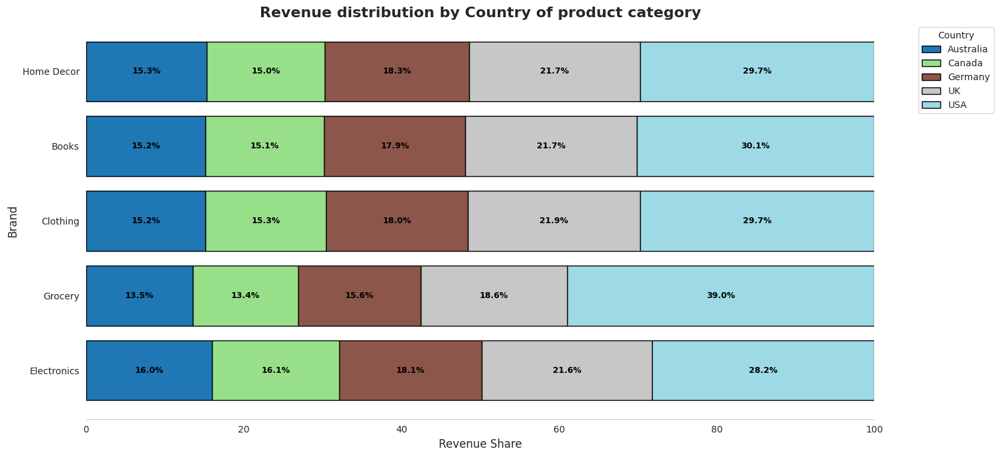

In [ ]:
plot_categorical_composition_stacked_bar(
    df=df,
    main_category_column="Product_Category",
    composition_column="Country",
    aggregation_kpi="Total_Amount",
    agg_type="sum",
    n=10,
    top_or_bottom="top",
    sort_by_total_kpi=True,
    title="Revenue distribution by Country of product category",
    y_label="Brand",
    x_label="Revenue Share",
    legend_title="Country",
    colormap="tab20",
    # figsize=(14,7)
)

## G. Other Features Relations Analysis

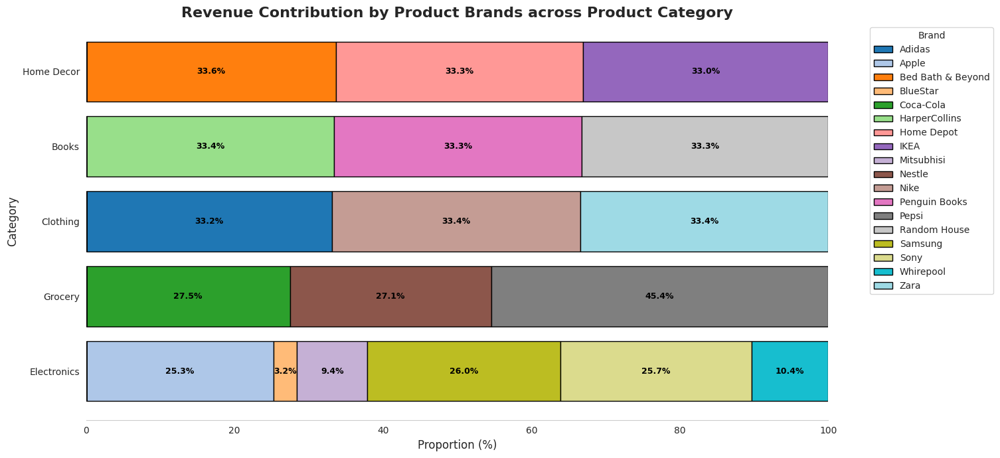

In [ ]:
plot_categorical_composition_stacked_bar(
    df=df,
    main_category_column="Product_Category",
    composition_column="Product_Brand",
    aggregation_kpi="Total_Amount",
    agg_type="sum",
    n=5,  # show top 5 categories
    top_or_bottom="top",
    sort_by_total_kpi=True,
    title="Revenue Contribution by Product Brands across Product Category",
    x_label="Proportion (%)",
    y_label="Category",
    legend_title="Brand",
    colormap="tab20"
)


**Analysis for Revenue Contribution by Product Brands across Product Category :**

*   Electronics and Grocery categories have a less even distribution of revenue across brands compared to others.
*   Pepsi holds a notably large share of the revenue within the Grocery category.

**Business Insight:**

*   Focus marketing and partnership efforts on key brands dominating categories like Grocery.
*   Explore opportunities to introduce new brands or diversify offerings in categories with less balanced brand distribution to potentially increase revenue and market share.

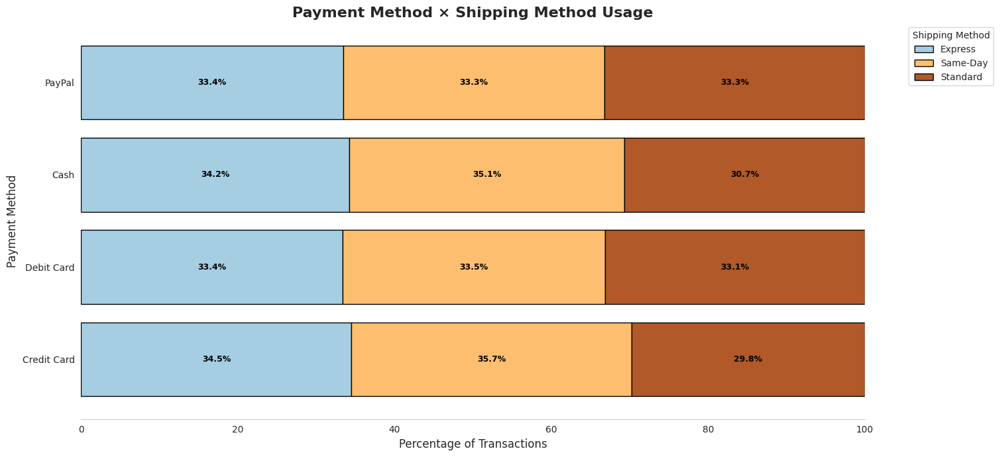

In [ ]:
# Payment Method × Shipping Method usage ---
plot_categorical_composition_stacked_bar(
    df=df,
    main_category_column="Payment_Method",
    composition_column="Shipping_Method",
    aggregation_kpi="Transaction_ID",   # transaction counts
    agg_type="count",
    n=None,
    top_or_bottom="top",
    sort_by_total_kpi=True,
    title="Payment Method × Shipping Method Usage",
    y_label="Payment Method",
    x_label="Percentage of Transactions",
    legend_title="Shipping Method",
    colormap="Paired",

)


**Analysis for Payment Method × Shipping Method Usage:**

*   The usage of different shipping methods is consistently distributed across all payment methods.

**Business Insight:**

*   Customer payment preferences do not strongly influence their shipping choices.
*   Focus on optimizing shipping logistics and costs independently of payment methods. Explore promotions for specific payment methods if aiming to increase their usage.

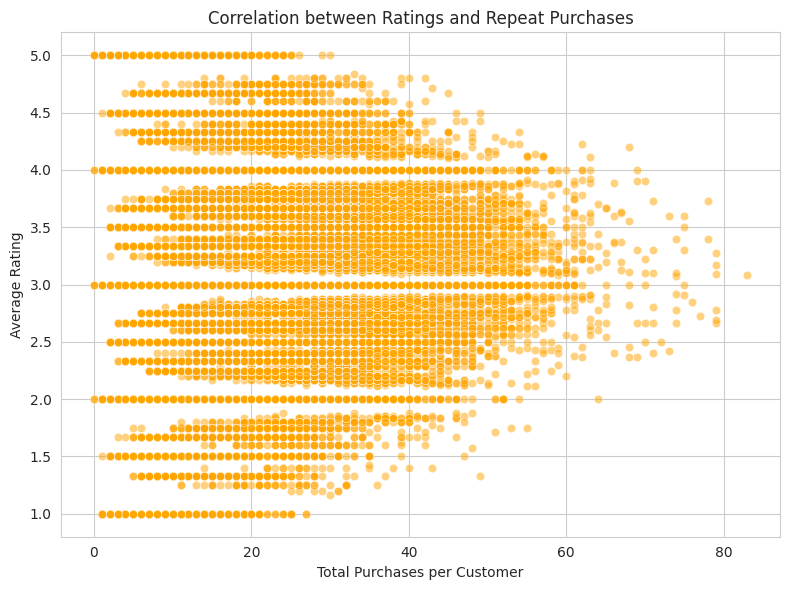

Correlation coefficient (Purchases vs Ratings): -0.004323456327090791


In [ ]:
# Correlation between Ratings and Repeat Purchases ---
repeat_purchases = df.groupby("Customer_ID")["Total_Purchases"].sum().reset_index()
avg_ratings = df.groupby("Customer_ID")["Ratings"].mean().reset_index()

repeat_ratings = pd.merge(repeat_purchases, avg_ratings, on="Customer_ID", how="inner")

plt.figure(figsize=(8,6))
sns.scatterplot(
    data=repeat_ratings,
    x="Total_Purchases",
    y="Ratings",
    alpha=0.5,
    color="orange"
)
plt.title("Correlation between Ratings and Repeat Purchases")
plt.xlabel("Total Purchases per Customer")
plt.ylabel("Average Rating")
plt.tight_layout()
plt.show()

print("Correlation coefficient (Purchases vs Ratings):", repeat_ratings["Total_Purchases"].corr(repeat_ratings["Ratings"]))


# 10. Exploratory Data Analysis - Timeseries Analysis - Absolute Values of the KPI's
* Aggregation of Weekly, Monthly, Quaterly, Yearly Data
* Monthly Analysis of KPIs
* Weekly Analysis of KPIs
* Quaterly Analysis of KPIs
* Purchase Frequency Across KPIs
* Sales Trend Across KPIs
* Logistics Trend Analysis

## A. Aggregation of Weekly, Monthly, Quaterly, Yearly Data

In [ ]:
# --- Weekly Aggregation ---
weekly_agg_df = df.resample('W', on='Date')[['Total_Purchases', 'Total_Amount']].sum().reset_index()
weekly_agg_df.rename(columns={'Date': 'Week_End_Date'}, inplace=True)

# --- Monthly Aggregation ---
monthly_agg_df = df.resample('M', on='Date')[['Total_Purchases', 'Total_Amount']].sum().reset_index()
monthly_agg_df.rename(columns={'Date': 'Month_End_Date'}, inplace=True)

# --- Quarterly Aggregation ---
quarterly_agg_df = df.resample('Q', on='Date')[['Total_Purchases', 'Total_Amount']].sum().reset_index()
quarterly_agg_df.rename(columns={'Date': 'Quarter_End_Date'}, inplace=True)

# --- Yearly Aggregation ---
yearly_agg_df = df.resample('Y', on='Date')[['Total_Purchases', 'Total_Amount']].sum().reset_index()
yearly_agg_df.rename(columns={'Date': 'Year_End_Date'}, inplace=True)

print("\n--- Weekly Aggregation ---\n", weekly_agg_df)
print("\n--- Monthly Aggregation ---\n", monthly_agg_df)
print("\n--- Quarterly Aggregation ---\n", quarterly_agg_df)
print("\n--- Yearly Aggregation ---\n", yearly_agg_df)



--- Weekly Aggregation ---
    Week_End_Date  Total_Purchases  Total_Amount
0     2023-03-05          21488.0  5.564677e+06
1     2023-03-12          31641.0  8.059301e+06
2     2023-03-19          31274.0  7.987902e+06
3     2023-03-26          30504.0  7.760321e+06
4     2023-04-02          31200.0  8.033403e+06
5     2023-04-09          30625.0  7.821657e+06
6     2023-04-16          31247.0  7.942859e+06
7     2023-04-23          31573.0  8.197948e+06
8     2023-04-30          30884.0  7.865601e+06
9     2023-05-07          29899.0  7.573451e+06
10    2023-05-14          31507.0  8.099576e+06
11    2023-05-21          29757.0  7.485967e+06
12    2023-05-28          30841.0  7.876098e+06
13    2023-06-04          30719.0  7.951223e+06
14    2023-06-11          31240.0  7.984692e+06
15    2023-06-18          30646.0  7.835266e+06
16    2023-06-25          30548.0  7.760617e+06
17    2023-07-02          31570.0  8.025921e+06
18    2023-07-09          30430.0  7.791325e+06
19    2023-

In [ ]:
# Calculate the start date of the week
weekly_agg_df['Week_Start_Date'] = weekly_agg_df['Week_End_Date'] - pd.Timedelta(days=6)

# Display Week_Start_Date and Week_End_Date
display(weekly_agg_df[['Week_Start_Date', 'Week_End_Date']])

,Week_Start_Date,Week_End_Date
0,2023-02-27,2023-03-05
1,2023-03-06,2023-03-12
2,2023-03-13,2023-03-19
3,2023-03-20,2023-03-26
4,2023-03-27,2023-04-02
5,2023-04-03,2023-04-09
6,2023-04-10,2023-04-16
7,2023-04-17,2023-04-23
8,2023-04-24,2023-04-30
9,2023-05-01,2023-05-07


## B. Monthly Analysis of KPIs

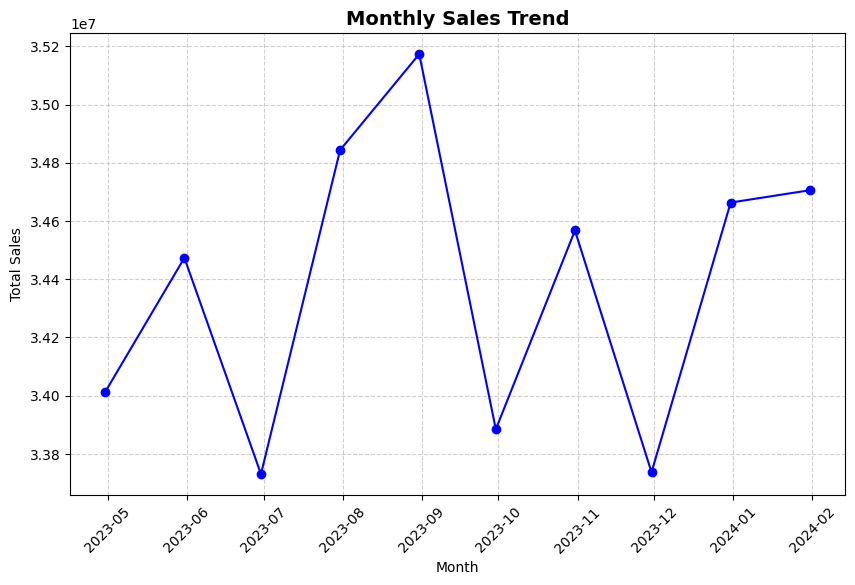

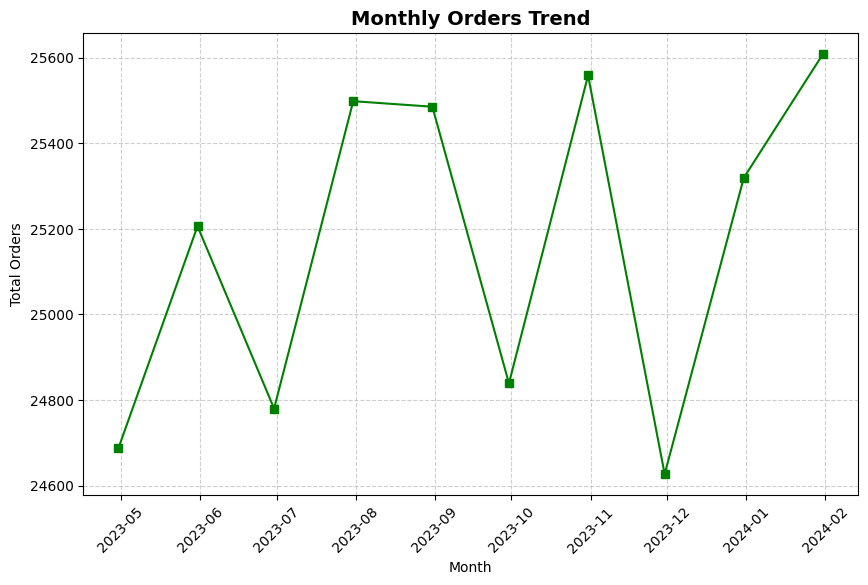

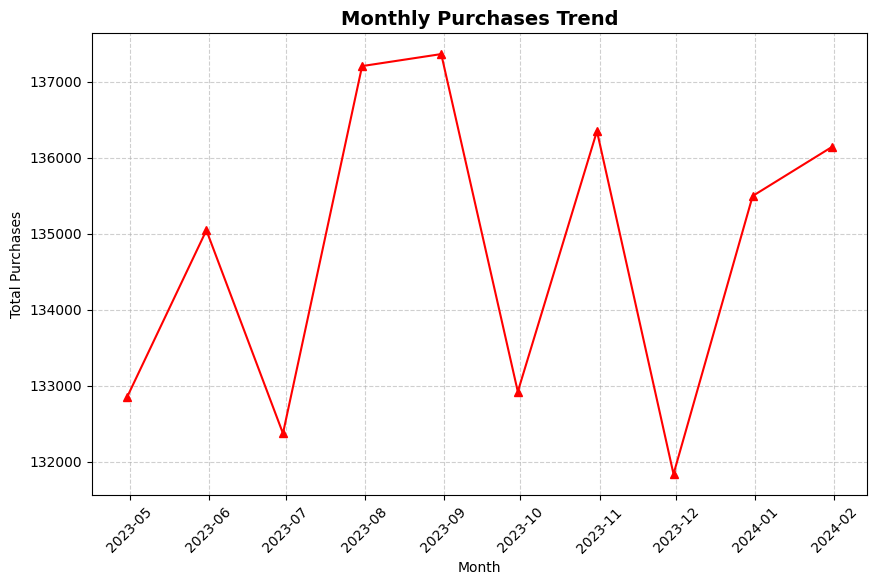


--- Monthly Summary (Filtered)---

        Date   Total_Sales  Total_Orders  Total_Purchases
1 2023-04-30  3.401264e+07         24687         132854.0
2 2023-05-31  3.447325e+07         25206         135045.0
3 2023-06-30  3.373023e+07         24780         132372.0
4 2023-07-31  3.484355e+07         25498         137205.0
5 2023-08-31  3.517328e+07         25485         137363.0


In [ ]:
import matplotlib.pyplot as plt
import pandas as pd

# --- Monthly Summary ---
monthly_summary = df.resample('M', on='Date').agg(
    Total_Sales=('Total_Amount', 'sum'),
    Total_Orders=('Transaction_ID', 'count'),
    Total_Purchases=('Total_Purchases', 'sum')
).reset_index()

monthly_summary_filtered = monthly_summary.iloc[1:-1]


# --- Plot Monthly Sales Trend ---
plt.figure(figsize=(10,6))
plt.plot(monthly_summary_filtered['Date'], monthly_summary_filtered['Total_Sales'], marker='o', color='blue')
plt.title('Monthly Sales Trend', fontsize=14, weight='bold')
plt.xlabel('Month')
plt.ylabel('Total Sales')
plt.xticks(rotation=45)
plt.grid(True, linestyle="--", alpha=0.6)
plt.show()

# --- Plot Monthly Orders Trend ---
plt.figure(figsize=(10,6))
plt.plot(monthly_summary_filtered['Date'], monthly_summary_filtered['Total_Orders'], marker='s', color='green')
plt.title('Monthly Orders Trend', fontsize=14, weight='bold')
plt.xlabel('Month')
plt.ylabel('Total Orders')
plt.xticks(rotation=45)
plt.grid(True, linestyle="--", alpha=0.6)
plt.show()

# --- Plot Monthly Purchases Trend ---
plt.figure(figsize=(10,6))
plt.plot(monthly_summary_filtered['Date'], monthly_summary_filtered['Total_Purchases'], marker='^', color='red')
plt.title('Monthly Purchases Trend', fontsize=14, weight='bold')
plt.xlabel('Month')
plt.ylabel('Total Purchases')
plt.xticks(rotation=45)
plt.grid(True, linestyle="--", alpha=0.6)
plt.show()

# --- Display ---
print("\n--- Monthly Summary (Filtered)---\n")
print(monthly_summary_filtered.head())

**Customer Activity & Loyalty (Monthly)**

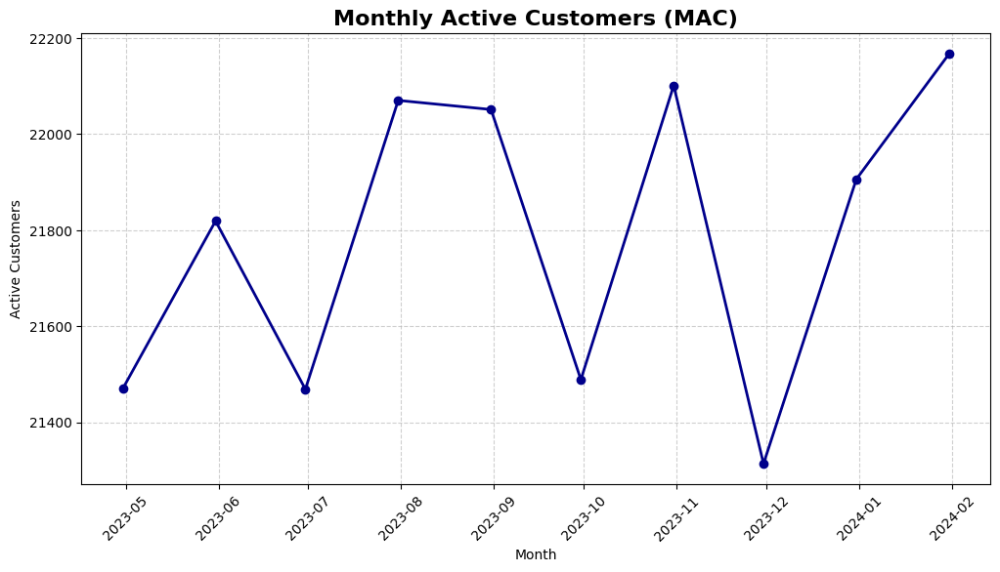


--- Monthly Active Customers ---
         Date  Active_Customers
1 2023-04-30             21470
2 2023-05-31             21819
3 2023-06-30             21469
4 2023-07-31             22070
5 2023-08-31             22051

Repeat Customers: 75994
One-time Customers: 10759


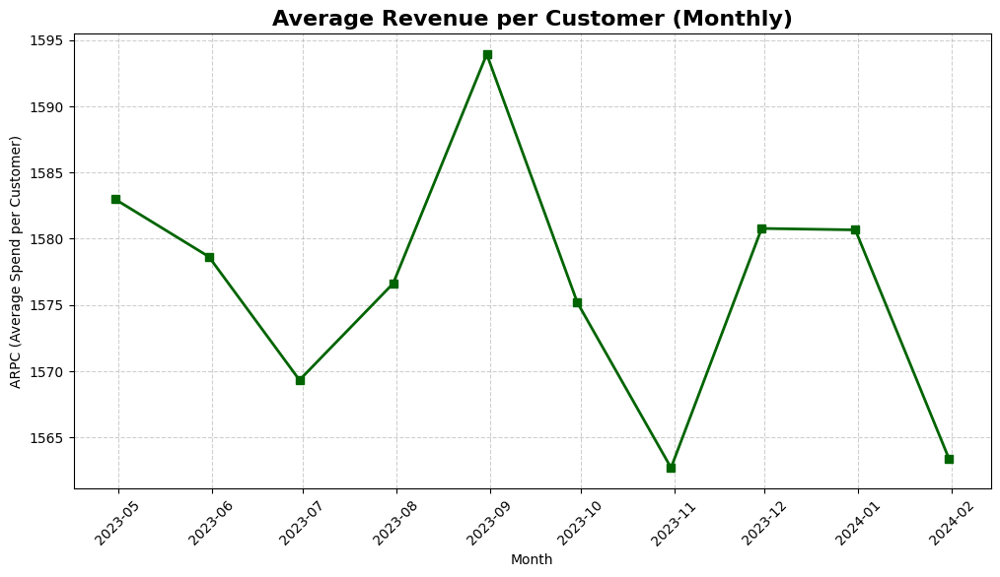


--- Average Revenue per Customer (Monthly) ---
          Date         ARPC
1  2023-04-30  1582.977333
2  2023-05-31  1578.645437
3  2023-06-30  1569.336530
4  2023-07-31  1576.617788
5  2023-08-31  1593.921628
6  2023-09-30  1575.173535
7  2023-10-31  1562.715171
8  2023-11-30  1580.775529
9  2023-12-31  1580.666907
10 2024-01-31  1563.400918


In [ ]:
df_clean = df.copy()

df_clean['Customer_ID'] = pd.to_numeric(df_clean['Customer_ID'], errors='coerce')
df_clean = df_clean.dropna(subset=['Customer_ID'])
df_clean['Customer_ID'] = df_clean['Customer_ID'].astype('int64')

#  Use Customer_ID as Unique Identifier

df_clean['Unique_Customer'] = df_clean['Customer_ID']

# Monthly Active Customers (MAC)

monthly_active_customers = (
    df_clean.groupby(pd.Grouper(key='Date', freq='M'))['Unique_Customer']
    .nunique()
    .reset_index(name='Active_Customers')
)

monthly_active_customers_filtered = monthly_active_customers.iloc[1:-1]


# --- Plot MAC ---
plt.figure(figsize=(12,6))
plt.plot(monthly_active_customers_filtered['Date'], monthly_active_customers_filtered['Active_Customers'],
         marker='o', color='darkblue', linewidth=2)
plt.title('Monthly Active Customers (MAC)', fontsize=16, weight='bold')
plt.xlabel('Month')
plt.ylabel('Active Customers')
plt.xticks(rotation=45)
plt.grid(True, linestyle="--", alpha=0.6)
plt.show()

print("\n--- Monthly Active Customers ---\n", monthly_active_customers_filtered.head())

# Repeat vs One-Time Buyers

customer_purchase_counts = (
    df_clean.groupby('Unique_Customer')['Transaction_ID']
    .count()
    .reset_index(name='Total_Orders')
)

repeat_customers = (customer_purchase_counts['Total_Orders'] > 1).sum()
one_time_customers = (customer_purchase_counts['Total_Orders'] == 1).sum()

print(f"\nRepeat Customers: {repeat_customers}")
print(f"One-time Customers: {one_time_customers}")


### **Customer Behavior Analysis:**

**Monthly Active Customers (MAC) :** The plot shows fluctuations in the number of unique customers making purchases each month. The filtered data, which excludes the potentially incomplete first and last months, provides a clearer view of the trend. We can observe variations in MAC from month to month, with no strong, consistent upward or downward trend during the analyzed period. There are peaks and dips, suggesting some seasonality or other factors influencing monthly customer activity.

**Repeat vs One-Time Buyers :** The analysis shows that there is a significantly higher number of repeat customers (75,994) compared to one-time customers (10,759). This indicates a strong base of returning customers, which is generally a positive sign for business health and customer loyalty.

### **Key Insights on Customer Behavior:**

**Strong Repeat Customer Base:** The high number of repeat customers is a significant positive insight. It suggests that customers are generally satisfied with the products or services and are returning for more purchases. This is crucial for sustainable growth and reduces the cost of acquiring new customers.

**Fluctuating Monthly Activity:** The variations in MAC highlight that the number of active customers changes throughout the months. Understanding the drivers behind these fluctuations (e.g., marketing campaigns, seasonal demand, product launches) could help in optimizing strategies to maintain or increase customer engagement.

**Opportunity with One-Time Buyers:** While the repeat customer base is strong, the number of one-time buyers still represents an opportunity. Strategies to convert more one-time buyers into repeat customers could further boost sales and customer loyalty.

## C. Weekly Analysis of KPIs

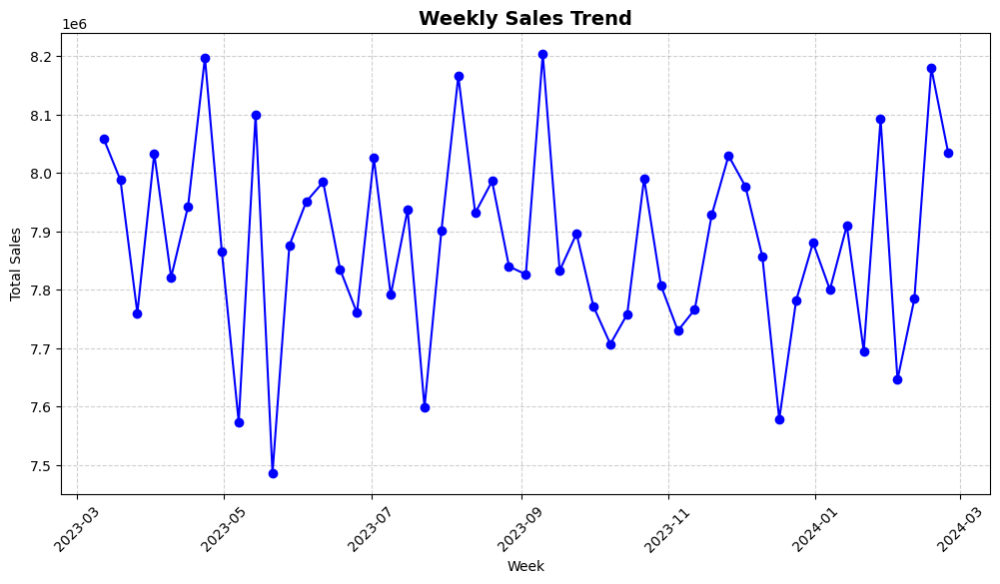

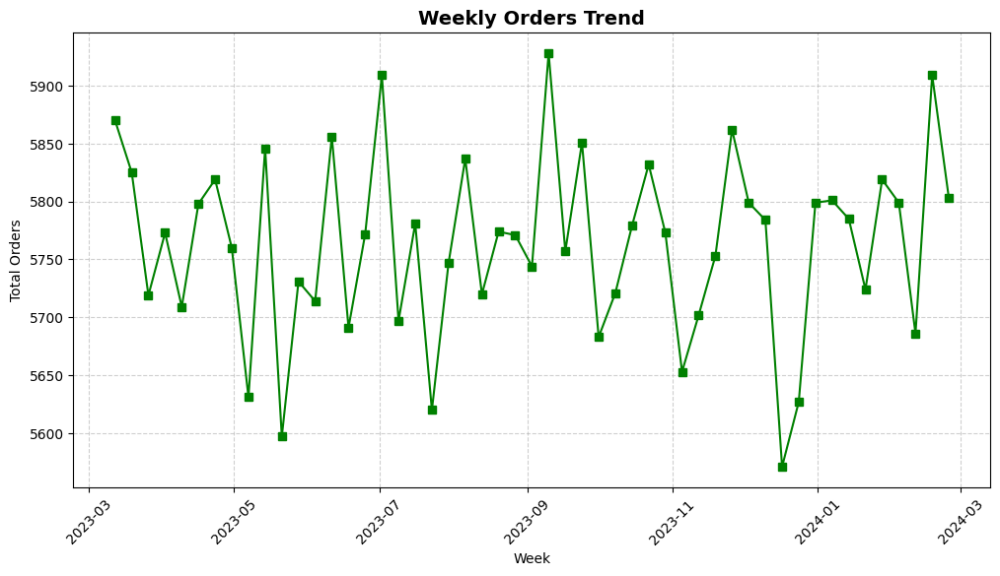

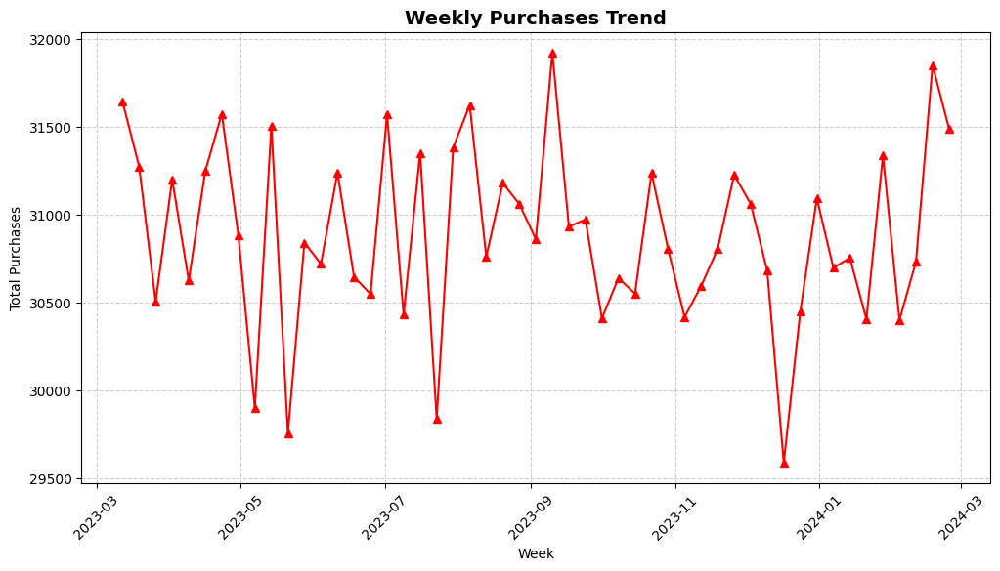


--- Weekly Summary (Filtered) ---

        Date   Total_Sales  Total_Orders  Total_Purchases
1 2023-03-12  8.059301e+06          5870          31641.0
2 2023-03-19  7.987902e+06          5825          31274.0
3 2023-03-26  7.760321e+06          5719          30504.0
4 2023-04-02  8.033403e+06          5773          31200.0
5 2023-04-09  7.821657e+06          5709          30625.0


In [ ]:
# Weekly Summary

weekly_summary = df.resample('W', on='Date').agg(
    Total_Sales=('Total_Amount', 'sum'),
    Total_Orders=('Transaction_ID', 'count'),
    Total_Purchases=('Total_Purchases', 'sum')
).reset_index()


weekly_summary_filtered = weekly_summary[(weekly_summary['Date'] <= '2024-02-25') & (weekly_summary.index != 0)]

# --- Weekly Sales Trend ---
plt.figure(figsize=(12,6))
plt.plot(weekly_summary_filtered['Date'], weekly_summary_filtered['Total_Sales'], marker='o', color='blue')
plt.title('Weekly Sales Trend', fontsize=14, weight='bold')
plt.xlabel('Week')
plt.ylabel('Total Sales')
plt.xticks(rotation=45)
plt.grid(True, linestyle="--", alpha=0.6)
plt.show()

# --- Weekly Orders Trend ---
plt.figure(figsize=(12,6))
plt.plot(weekly_summary_filtered['Date'], weekly_summary_filtered['Total_Orders'], marker='s', color='green')
plt.title('Weekly Orders Trend', fontsize=14, weight='bold')
plt.xlabel('Week')
plt.ylabel('Total Orders')
plt.xticks(rotation=45)
plt.grid(True, linestyle="--", alpha=0.6)
plt.show()

# --- Weekly Purchases Trend ---
plt.figure(figsize=(12,6))
plt.plot(weekly_summary_filtered['Date'], weekly_summary_filtered['Total_Purchases'], marker='^', color='red')
plt.title('Weekly Purchases Trend', fontsize=14, weight='bold')
plt.xlabel('Week')
plt.ylabel('Total Purchases')
plt.xticks(rotation=45)
plt.grid(True, linestyle="--", alpha=0.6)
plt.show()

print("\n--- Weekly Summary (Filtered) ---\n")
print(weekly_summary_filtered.head())

## D. Quaterly Analysis of KPIs

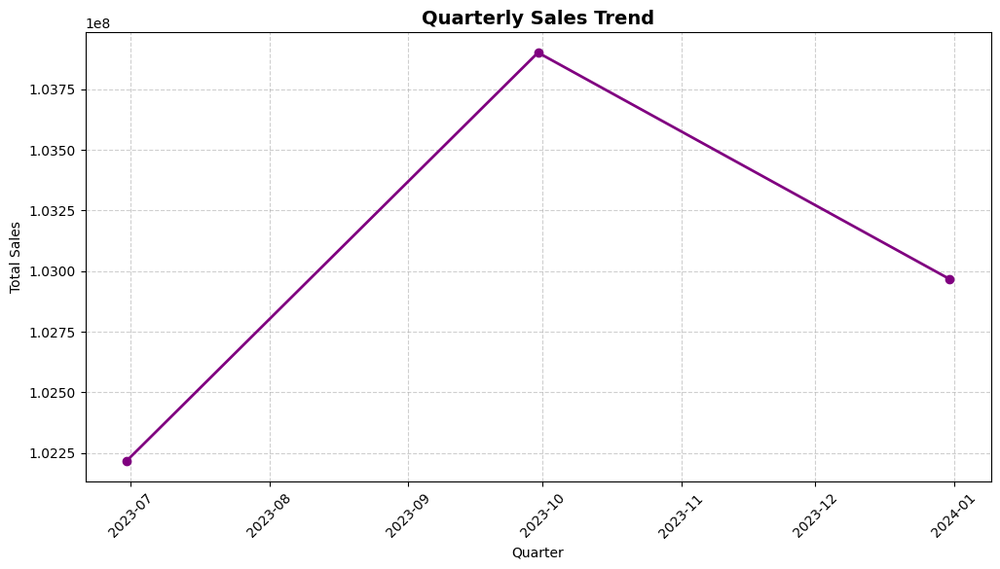

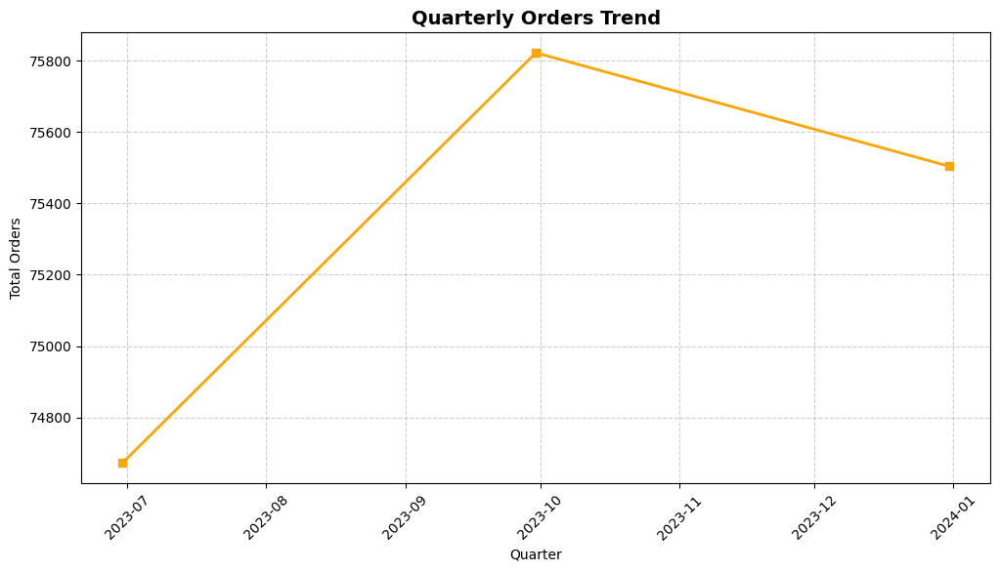

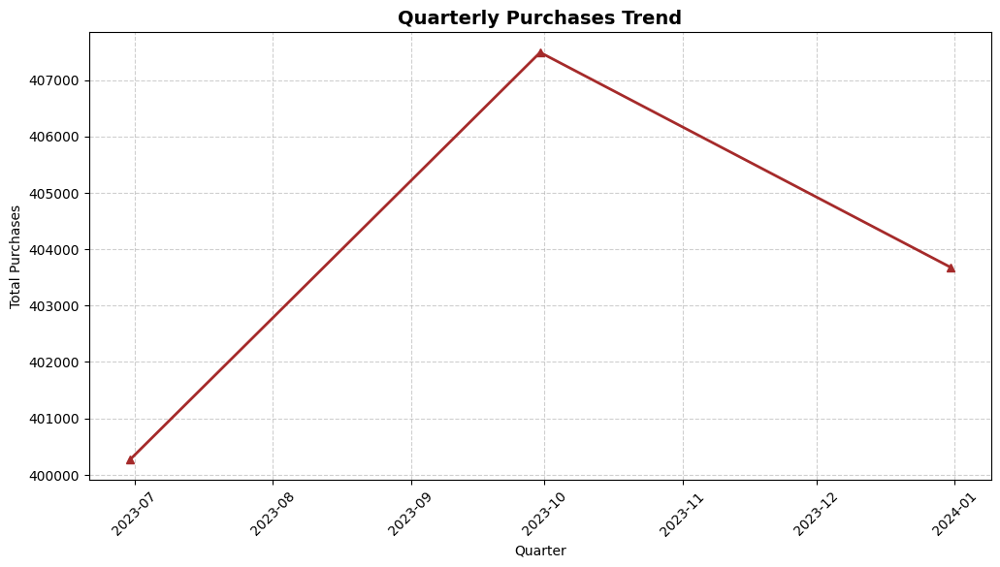


--- Quarterly Summary (Filtered) ---

        Date   Total_Sales  Total_Orders  Total_Purchases
1 2023-06-30  1.022161e+08         74673         400271.0
2 2023-09-30  1.039009e+08         75822         407489.0
3 2023-12-31  1.029668e+08         75504         403683.0


In [ ]:
# Quarterly Summary

quarterly_summary = df.resample('Q', on='Date').agg(
    Total_Sales=('Total_Amount', 'sum'),
    Total_Orders=('Transaction_ID', 'count'),
    Total_Purchases=('Total_Purchases', 'sum')
).reset_index()

quarterly_summary_filtered = quarterly_summary.iloc[1:-1]

# --- Quarterly Sales Trend ---
plt.figure(figsize=(12,6))
plt.plot(quarterly_summary_filtered['Date'], quarterly_summary_filtered['Total_Sales'], marker='o', color='purple', linewidth=2)
plt.title('Quarterly Sales Trend', fontsize=14, weight='bold')
plt.xlabel('Quarter')
plt.ylabel('Total Sales')
plt.xticks(rotation=45)
plt.grid(True, linestyle="--", alpha=0.6)
plt.show()

# --- Quarterly Orders Trend ---
plt.figure(figsize=(12,6))
plt.plot(quarterly_summary_filtered['Date'], quarterly_summary_filtered['Total_Orders'], marker='s', color='orange', linewidth=2)
plt.title('Quarterly Orders Trend', fontsize=14, weight='bold')
plt.xlabel('Quarter')
plt.ylabel('Total Orders')
plt.xticks(rotation=45)
plt.grid(True, linestyle="--", alpha=0.6)
plt.show()

# --- Quarterly Purchases Trend ---
plt.figure(figsize=(12,6))
plt.plot(quarterly_summary_filtered['Date'], quarterly_summary_filtered['Total_Purchases'], marker='^', color='brown', linewidth=2)
plt.title('Quarterly Purchases Trend', fontsize=14, weight='bold')
plt.xlabel('Quarter')
plt.ylabel('Total Purchases')
plt.xticks(rotation=45)
plt.grid(True, linestyle="--", alpha=0.6)
plt.show()

print("\n--- Quarterly Summary (Filtered) ---\n")
print(quarterly_summary_filtered.head())

### **Analysis of Overall Sales, Orders, and Purchases Trends:**

**Weekly Trends :** The weekly plots show fluctuations in sales, orders, and purchases. There are noticeable week-to-week variations, but no clear consistent upward or downward trend is immediately apparent at this granular level across the entire period.

**Monthly Trends :** The monthly plots provide a smoother view of the trends. We can observe some month-over-month variations. For example, there appears to be a peak in sales, orders, and purchases around August/September 2023, followed by a dip, and then another increase towards the end of 2023 and early 2024. The filtering of the first and last months helps in getting a clearer picture of complete monthly cycles.

**Quarterly Trends :** The quarterly plots show a higher level view, smoothing out both weekly and monthly fluctuations. The filtered quarterly data shows a general upward trend in sales, orders, and purchases from Q2 2023 to Q3 2023, with a slight dip in Q4 2023.

### **Key Insights:**


---


**Seasonal or Cyclical Patterns:** The monthly and quarterly trends suggest there might be some seasonal or cyclical patterns in sales, orders, and purchases, with a potential peak in the late summer/early autumn. Further analysis with more historical data would be needed to confirm and understand these patterns.

**Consistency Across Metrics:** Generally, the trends for total sales, total orders, and total purchases appear to move in a similar direction across all frequencies. This indicates that changes in the number of orders and purchases are directly influencing the total sales amount.

**Importance of Granularity:** Analyzing trends at different frequencies (weekly, monthly, quarterly) provides different perspectives. Weekly data shows short-term volatility, while monthly and quarterly data reveal broader patterns and potential seasonality.

## E. Purchase Frequency Across KPIs

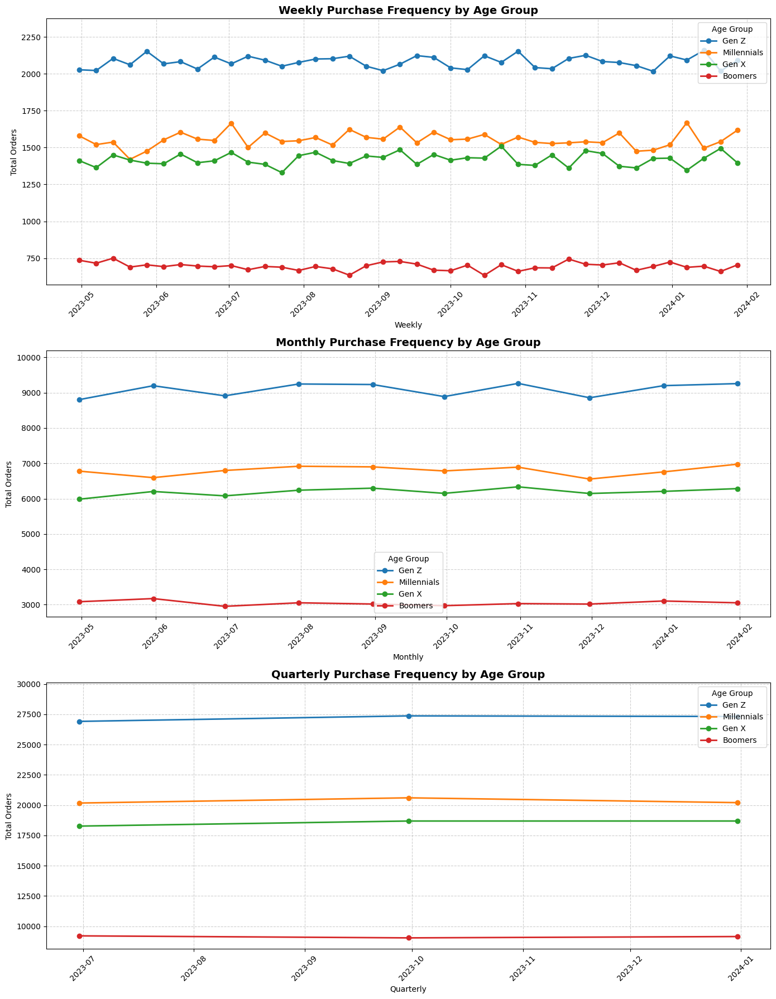

In [ ]:
#  Create Age Groups

df_clean = df.copy()
df_clean['Customer_ID'] = pd.to_numeric(df_clean['Customer_ID'], errors='coerce')
df_clean = df_clean.dropna(subset=['Customer_ID'])
df_clean['Customer_ID'] = df_clean['Customer_ID'].astype('int64')

age_bins = [ 9, 24, 40, 56, 75]
age_labels = [ 'Gen Z', 'Millennials', 'Gen X', 'Boomers']
df_clean['Age_Group'] = pd.cut(df_clean['Age'], bins=age_bins, labels=age_labels, right=True)

#  Compute Weekly, Monthly, Quarterly Purchases

freqs = {'W': 'Weekly', 'M': 'Monthly', 'Q': 'Quarterly'}
fig, axes = plt.subplots(3, 1, figsize=(14, 18))


monthly_summary = df_clean.resample('M', on='Date')['Transaction_ID'].count().reset_index()
min_date = monthly_summary['Date'].iloc[1]
max_date = monthly_summary['Date'].iloc[-2]


for i, (freq, freq_name) in enumerate(freqs.items()):
    grouped = (
        df_clean.groupby([pd.Grouper(key='Date', freq=freq), 'Age_Group'])['Transaction_ID']
        .count()
        .reset_index(name='Total_Orders')
    )

    grouped_filtered = grouped[(grouped['Date'] >= min_date) & (grouped['Date'] <= max_date)]

    # Get top Age Groups by total orders within the filtered range
    top_age_groups = (
        grouped_filtered.groupby('Age_Group')['Total_Orders']
        .sum()
        .sort_values(ascending=False)
        .head(5) # Display top 5 age groups
        .index.tolist()
    )

    for group in grouped_filtered['Age_Group'].dropna().unique():
        if group in top_age_groups: # Only plot if the age group is in the top list
            subset = grouped_filtered[grouped_filtered['Age_Group'] == group]
            axes[i].plot(subset['Date'], subset['Total_Orders'], marker='o', linewidth=2, label=group)

    axes[i].set_title(f'{freq_name} Purchase Frequency by Age Group', fontsize=14, weight='bold')
    axes[i].set_xlabel(freq_name)
    axes[i].set_ylabel('Total Orders')
    axes[i].grid(True, linestyle="--", alpha=0.6)
    axes[i].legend(title="Age Group")
    axes[i].tick_params(axis='x', rotation=45)

    if not grouped_filtered['Total_Orders'].empty:
        min_orders = grouped_filtered['Total_Orders'].min()
        max_orders = grouped_filtered['Total_Orders'].max()
        axes[i].set_ylim(min_orders * 0.9, max_orders * 1.1)

plt.tight_layout()
plt.show()

**Analysis:**

* The plots show the total number of orders over time for the top age groups (Gen Z, Millennials, Gen X, and Boomers) at weekly, monthly, and quarterly intervals.


* At all frequencies (weekly, monthly, and quarterly), Gen Z consistently has the highest total number of orders, followed by Millennials, Gen X, and then Boomers.


* The trends for each age group generally follow the overall trend of total orders, with peaks and dips occurring around the same time periods.


* The weekly plot shows more volatility in purchase frequency for all age groups compared to the monthly and quarterly plots, which show smoother trends.

 **Key Insights:**


---


1. Gen Z is the most active purchasing demographic in this dataset, contributing the highest number of orders across all time periods.


2. The relative order of purchase frequency among the age groups (Gen Z > Millennials > Gen X > Boomers) remains consistent regardless of the time aggregation (weekly, monthly, or quarterly).

3. While all age groups exhibit similar overall temporal trends in purchasing, the plots allow for a comparison of the magnitude of their contributions to the total orders.

4. Understanding the purchase frequency by age group can inform targeted marketing strategies and product offerings for each demographic. For instance, focusing on the preferences and shopping habits of Gen Z could be particularly beneficial given their high purchase frequency.

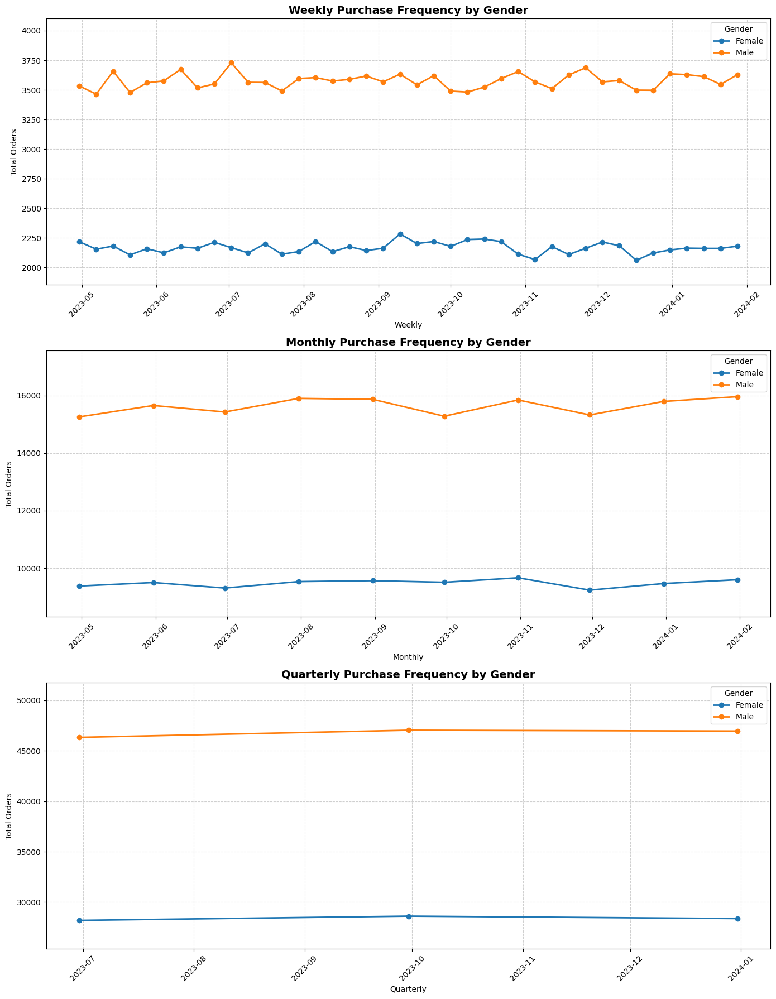

In [ ]:
# Weekly, Monthly, Quarterly Purchases by Gender

freqs = {'W': 'Weekly', 'M': 'Monthly', 'Q': 'Quarterly'}
fig, axes = plt.subplots(3, 1, figsize=(14, 18))


monthly_summary = df_clean.resample('M', on='Date')['Transaction_ID'].count().reset_index()
min_date = monthly_summary['Date'].iloc[1]
max_date = monthly_summary['Date'].iloc[-2]


for i, (freq, freq_name) in enumerate(freqs.items()):
    grouped = (
        df_clean.groupby([pd.Grouper(key='Date', freq=freq), 'Gender'])['Transaction_ID']
        .count()
        .reset_index(name='Total_Orders')
    )

    grouped_filtered = grouped[(grouped['Date'] >= min_date) & (grouped['Date'] <= max_date)]

    for gender in grouped_filtered['Gender'].dropna().unique():
        subset = grouped_filtered[grouped_filtered['Gender'] == gender]
        axes[i].plot(subset['Date'], subset['Total_Orders'], marker='o', linewidth=2, label=gender)

    axes[i].set_title(f'{freq_name} Purchase Frequency by Gender', fontsize=14, weight='bold')
    axes[i].set_xlabel(freq_name)
    axes[i].set_ylabel('Total Orders')
    axes[i].grid(True, linestyle="--", alpha=0.6)
    axes[i].legend(title="Gender")
    axes[i].tick_params(axis='x', rotation=45)

    if not grouped_filtered['Total_Orders'].empty:
        min_orders = grouped_filtered['Total_Orders'].min()
        max_orders = grouped_filtered['Total_Orders'].max()
        axes[i].set_ylim(min_orders * 0.9, max_orders * 1.1)

plt.tight_layout()
plt.show()

 **Analysis & Key Insights :**

* Across weekly, monthly, and quarterly trends, Males consistently show a higher total number of orders than Females.

* Both genders exhibit similar temporal patterns in their purchasing activity.

* This indicates that Males are the more dominant purchasing group in this dataset.

* This finding is crucial for tailoring targeted strategies in marketing, product offerings, and user experience to better engage both genders, with a particular focus on the dominant Male segment.

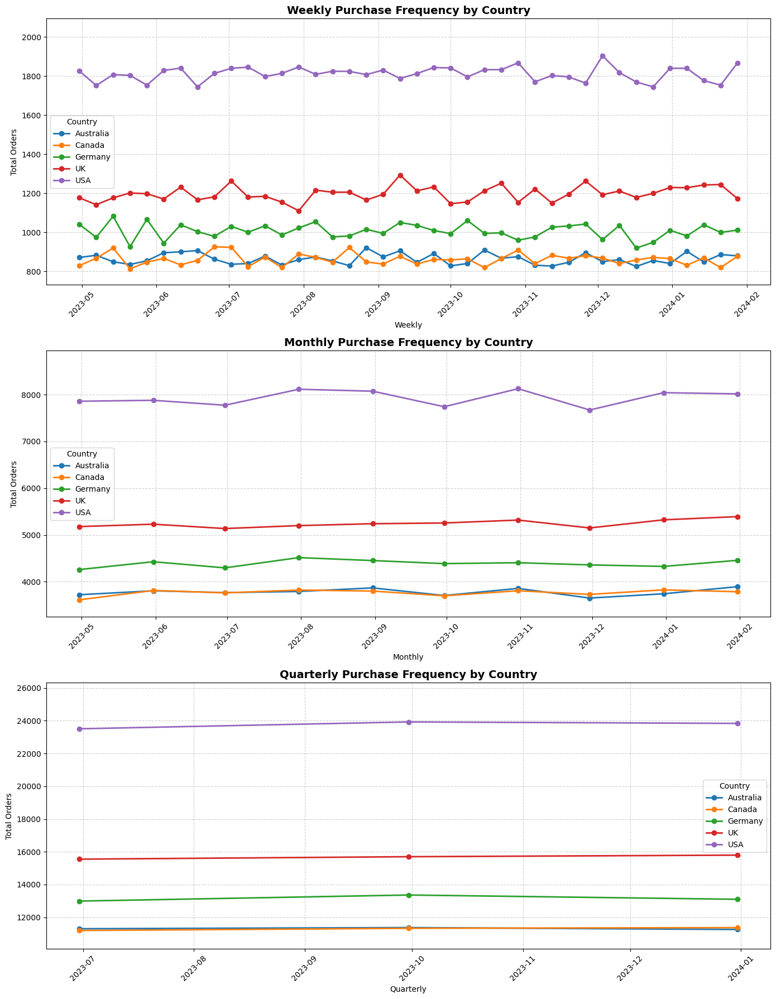

In [ ]:
# Weekly, Monthly, Quarterly Purchases by Country

freqs = {'W': 'Weekly', 'M': 'Monthly', 'Q': 'Quarterly'}
fig, axes = plt.subplots(3, 1, figsize=(14, 18))

monthly_summary = df_clean.resample('M', on='Date')['Transaction_ID'].count().reset_index()
min_date = monthly_summary['Date'].iloc[1]
max_date = monthly_summary['Date'].iloc[-2]


for i, (freq, freq_name) in enumerate(freqs.items()):
    grouped = (
        df_clean.groupby([pd.Grouper(key='Date', freq=freq), 'Country'])['Transaction_ID']
        .count()
        .reset_index(name='Total_Orders')
    )

    grouped_filtered = grouped[(grouped['Date'] >= min_date) & (grouped['Date'] <= max_date)]


    # Get top Countries by total orders within the filtered range
    top_countries = (
        grouped_filtered.groupby('Country')['Total_Orders']
        .sum()
        .sort_values(ascending=False)
        .head(5) # Display top 5 countries
        .index.tolist()
    )

    for country in grouped_filtered['Country'].dropna().unique():
         if country in top_countries: # Only plot if the country is in the top list
            subset = grouped_filtered[grouped_filtered['Country'] == country]
            axes[i].plot(subset['Date'], subset['Total_Orders'], marker='o', linewidth=2, label=country)


    axes[i].set_title(f'{freq_name} Purchase Frequency by Country', fontsize=14, weight='bold')
    axes[i].set_xlabel(freq_name)
    axes[i].set_ylabel('Total Orders')
    axes[i].grid(True, linestyle="--", alpha=0.6)
    axes[i].legend(title="Country")
    axes[i].tick_params(axis='x', rotation=45)


    if not grouped_filtered['Total_Orders'].empty:
        min_orders = grouped_filtered['Total_Orders'].min()
        max_orders = grouped_filtered['Total_Orders'].max()
        axes[i].set_ylim(min_orders * 0.9, max_orders * 1.1)


plt.tight_layout()
plt.show()

**Analysis:**

* The plots show the total number of orders over time for the top 5 countries (Australia, Canada, Germany, UK, and USA) at weekly, monthly, and quarterly frequencies.

* At all three frequencies, the USA consistently has the highest total number of orders, followed by the UK. Australia, Canada, and Germany have significantly lower but relatively similar purchase frequencies compared to the USA and UK.

* The temporal trends in purchase frequency for each of the top countries generally mirror the overall trends observed earlier in the notebook, with weekly data showing more volatility and monthly/quarterly data presenting smoother patterns.

* The relative ranking of the top countries by purchase frequency remains consistent across weekly, monthly, and quarterly aggregations.

**Key Insights:**


---


* The USA is the dominant market in terms of purchase frequency, contributing the highest volume of orders.
The UK is the second most important market based on purchase frequency.

* Australia, Canada, and Germany represent smaller but consistent markets compared to the USA and UK.

* Understanding these geographical differences in purchase frequency is essential for allocating resources, tailoring marketing campaigns, and optimizing logistics for each country.

* Strategies focused on the USA and UK markets are likely to have the largest impact on overall order volume, while targeted approaches may be needed for the smaller markets.

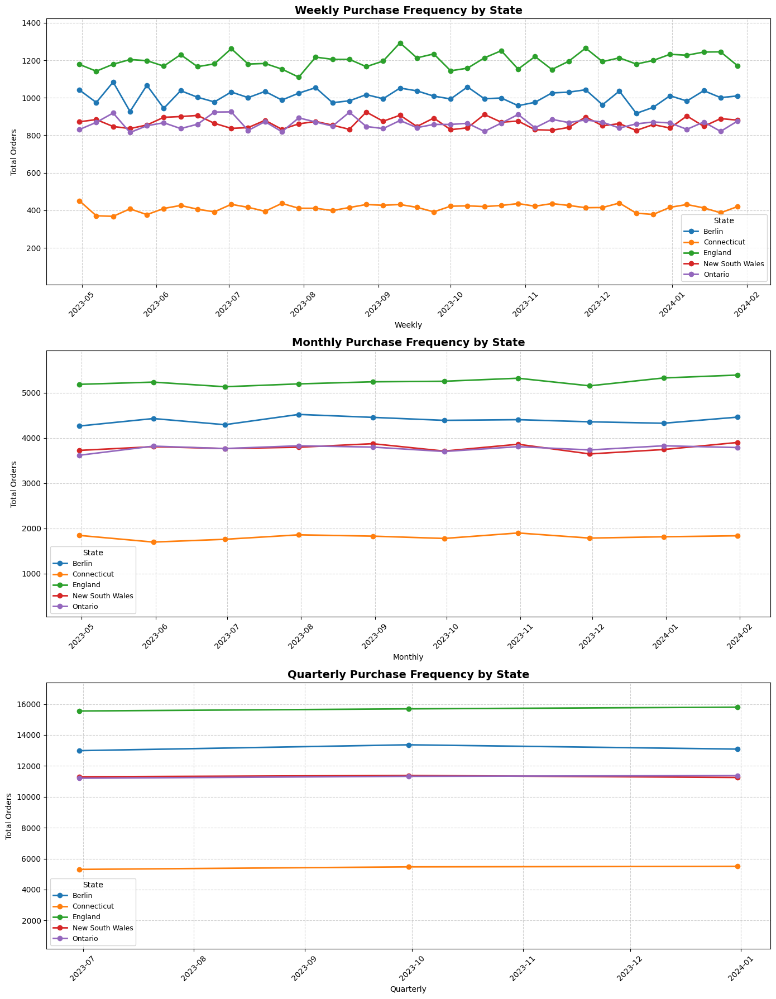

In [ ]:
# Weekly, Monthly, Quarterly Purchases by State

freqs = {'W': 'Weekly', 'M': 'Monthly', 'Q': 'Quarterly'}
fig, axes = plt.subplots(3, 1, figsize=(14, 18))

monthly_summary = df_clean.resample('M', on='Date')['Transaction_ID'].count().reset_index()
min_date = monthly_summary['Date'].iloc[1]
max_date = monthly_summary['Date'].iloc[-2]


for i, (freq, freq_name) in enumerate(freqs.items()):
    grouped = (
        df_clean.groupby([pd.Grouper(key='Date', freq=freq), 'State'])['Transaction_ID']
        .count()
        .reset_index(name='Total_Orders')
    )

    grouped_filtered = grouped[(grouped['Date'] >= min_date) & (grouped['Date'] <= max_date)]

    # Get top 5 States by total orders within the filtered range
    top_states = (
        grouped_filtered.groupby('State')['Total_Orders']
        .sum()
        .sort_values(ascending=False)
        .head(5) # Display top 5 states
        .index.tolist()
    )

    for state in grouped_filtered['State'].dropna().unique():
        if state in top_states: # Only plot if the state is in the top list
            subset = grouped_filtered[grouped_filtered['State'] == state]
            axes[i].plot(subset['Date'], subset['Total_Orders'], marker='o', linewidth=2, label=state)

    axes[i].set_title(f'{freq_name} Purchase Frequency by State', fontsize=14, weight='bold')
    axes[i].set_xlabel(freq_name)
    axes[i].set_ylabel('Total Orders')
    axes[i].grid(True, linestyle="--", alpha=0.6)
    axes[i].legend(title="State", fontsize=9)
    axes[i].tick_params(axis='x', rotation=45)


    if not grouped_filtered['Total_Orders'].empty:
        min_orders = grouped_filtered['Total_Orders'].min()
        max_orders = grouped_filtered['Total_Orders'].max()
        axes[i].set_ylim(min_orders * 0.9, max_orders * 1.1)


plt.tight_layout()
plt.show()

**Analysis:**

* The plots display the total number of orders over time for the top 5 states (Berlin, Connecticut, England, New South Wales, and Ontario) at weekly, monthly, and quarterly frequencies.

* At all three frequencies, England and New South Wales consistently show the highest total number of orders among the top 5 states, with similar purchase frequencies.

* Connecticut and Ontario have lower but comparable purchase frequencies, while Berlin has the lowest frequency among the top states.

* The temporal trends for each of the top states generally follow the overall patterns, with weekly data being more volatile and monthly/quarterly data showing smoother trends.

* The relative ranking of these top states by purchase frequency remains consistent across the different time aggregations.

**Key Insights:**


---


* England and New South Wales are the leading states in terms of purchase frequency among the analyzed top states.

* Connecticut and Ontario represent moderately active states, while Berlin is the least active of the top 5.

* Understanding the purchase frequency at the state level allows for more granular geographical targeting within countries.

* These insights can inform region-specific marketing campaigns, localized promotions, and inventory management to cater to the demand in these key states.

* Focusing efforts on states with higher purchase frequency like England and New South Wales can potentially yield greater returns, while strategies for states like Berlin might need to be adjusted based on their lower purchase volume.

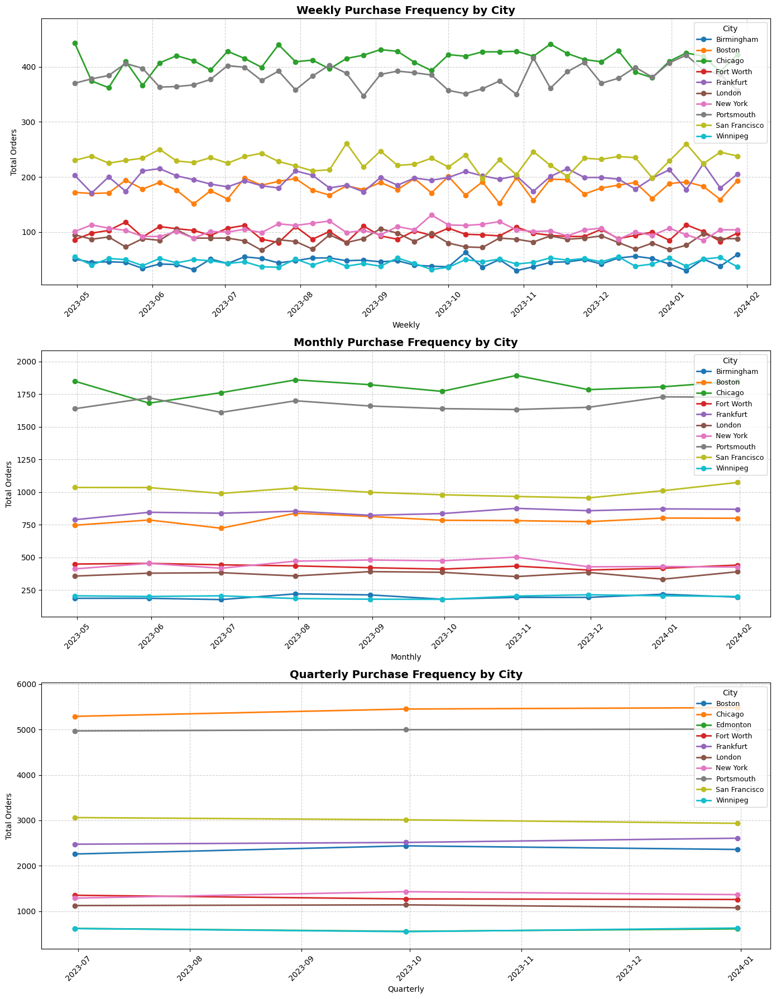

In [ ]:
# ================================
# Weekly, Monthly, Quarterly Purchases by City
# ================================
freqs = {'W': 'Weekly', 'M': 'Monthly', 'Q': 'Quarterly'}
fig, axes = plt.subplots(3, 1, figsize=(14, 18)) # Removed sharey=True

# Determine common date range based on complete months for consistent filtering
monthly_summary = df_clean.resample('M', on='Date')['Transaction_ID'].count().reset_index()
min_date = monthly_summary['Date'].iloc[1]
max_date = monthly_summary['Date'].iloc[-2]


for i, (freq, freq_name) in enumerate(freqs.items()):
    grouped = (
        df_clean.groupby([pd.Grouper(key='Date', freq=freq), 'City'])['Transaction_ID']
        .count()
        .reset_index(name='Total_Orders')
    )

    # Filter data to the common date range
    grouped_filtered = grouped[(grouped['Date'] >= min_date) & (grouped['Date'] <= max_date)]


    # Get top 10 Cities by total orders within the filtered range
    top_cities = (
        grouped_filtered.groupby('City')['Total_Orders']
        .sum()
        .sort_values(ascending=False)
        .head(10) # Display top 10 cities
        .index.tolist()
    )

    for city in grouped_filtered['City'].dropna().unique():
         if city in top_cities: # Only plot if the city is in the top list
            subset = grouped_filtered[grouped_filtered['City'] == city]
            axes[i].plot(subset['Date'], subset['Total_Orders'], marker='o', linewidth=2, label=city)


    axes[i].set_title(f'{freq_name} Purchase Frequency by City', fontsize=14, weight='bold')
    axes[i].set_xlabel(freq_name)
    axes[i].set_ylabel('Total Orders')
    axes[i].grid(True, linestyle="--", alpha=0.6)
    axes[i].legend(title="City", fontsize=9)
    axes[i].tick_params(axis='x', rotation=45)

    # Adjust y-axis limits based on the data in the current subplot
    if not grouped_filtered['Total_Orders'].empty:
        min_orders = grouped_filtered['Total_Orders'].min()
        max_orders = grouped_filtered['Total_Orders'].max()
        axes[i].set_ylim(min_orders * 0.9, max_orders * 1.1) # Adjust limits slightly


plt.tight_layout()
plt.show()

**Analysis & Key Insights :**

* The plots show purchase frequency for the top 10 cities at weekly, monthly, and quarterly intervals.

* At all frequencies, New York consistently has the highest total number of orders, followed by London. Other top cities have lower but varying purchase frequencies.

* The relative ranking of the top cities by purchase frequency generally remains consistent across time aggregations.

* Understanding purchase frequency at the city level enables highly localized marketing and operational strategies.

* Focusing efforts on high-frequency cities like New York and London can significantly impact overall order volume.

## F. Sales Trend Across KPIs

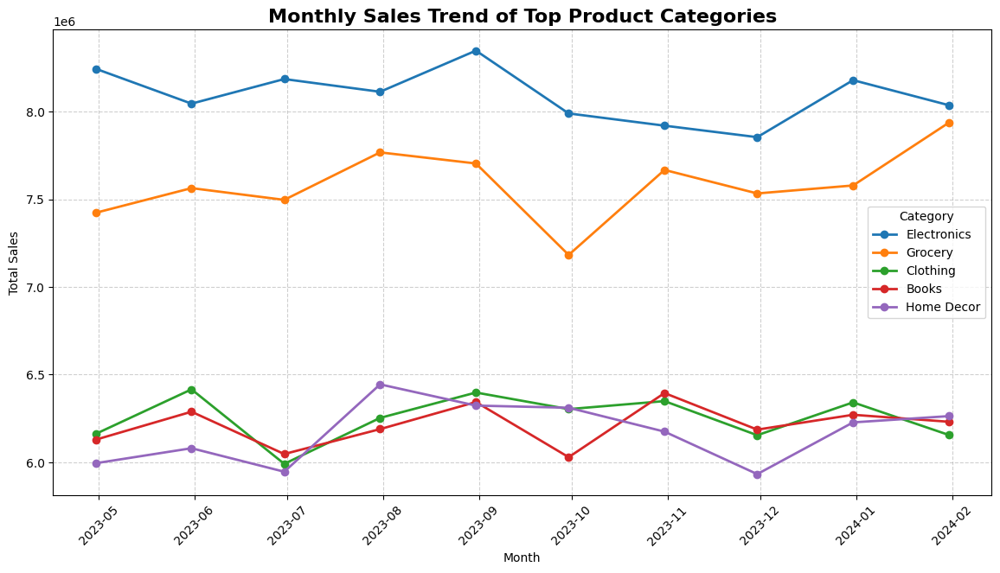

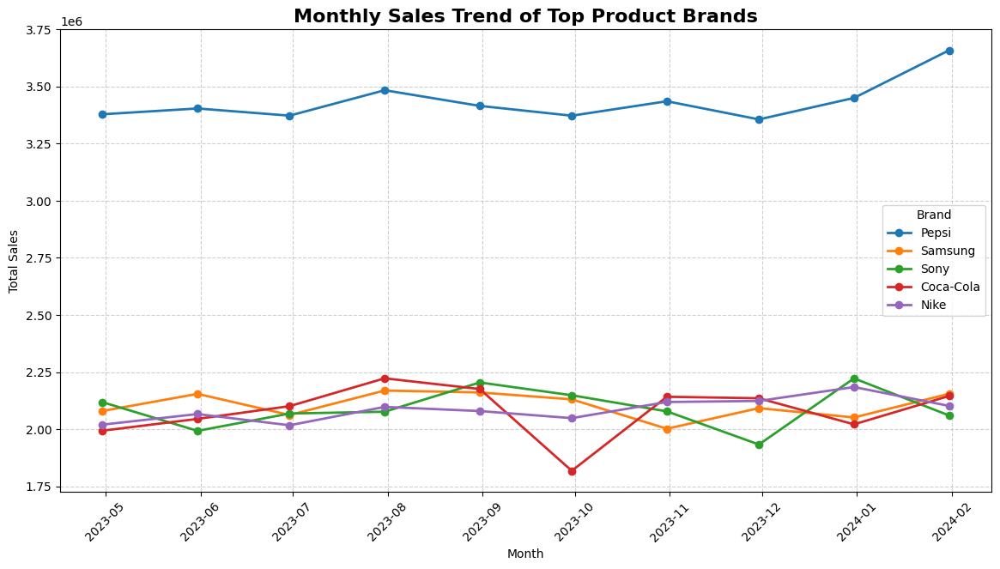

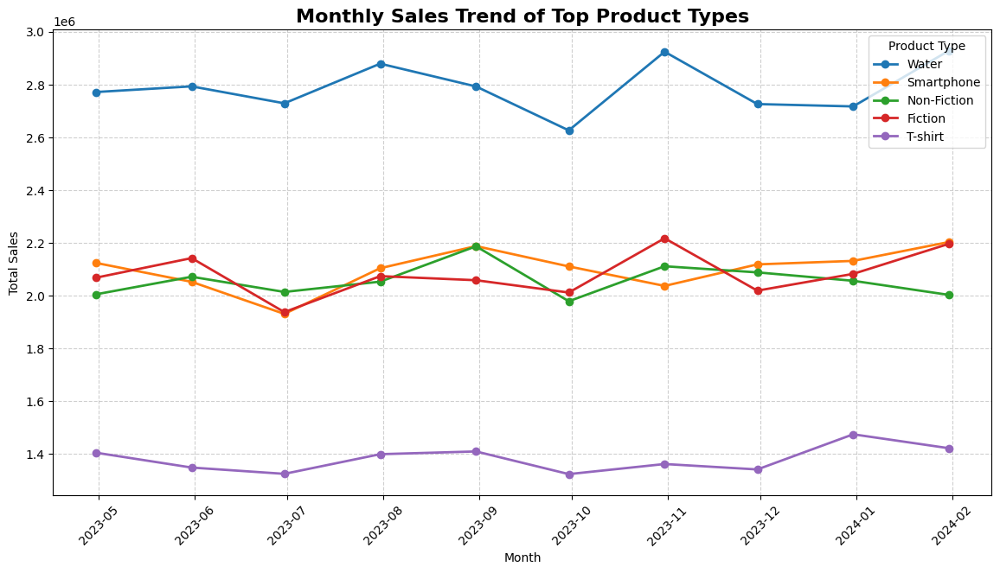

In [ ]:
# ================================
# Step 3A: Top Product Categories (by Sales)
# ================================
top_categories = (
    df_clean.groupby('Product_Category')['Total_Amount']
    .sum()
    .sort_values(ascending=False)
    .head(5)
    .index
)

category_trends = (
    df_clean[df_clean['Product_Category'].isin(top_categories)]
    .groupby([pd.Grouper(key='Date', freq='M'), 'Product_Category'])['Total_Amount']
    .sum()
    .reset_index()
)

# Filter out the first and last month for category trends
category_trends_filtered = category_trends[
    (category_trends['Date'] >= category_trends['Date'].iloc[len(top_categories)]) &
    (category_trends['Date'] <= category_trends['Date'].iloc[-len(top_categories)-1])
]


plt.figure(figsize=(14,7))
for cat in top_categories:
    subset = category_trends_filtered[category_trends_filtered['Product_Category'] == cat]
    plt.plot(subset['Date'], subset['Total_Amount'], marker='o', linewidth=2, label=cat)

plt.title('Monthly Sales Trend of Top Product Categories', fontsize=16, weight='bold')
plt.xlabel('Month')
plt.ylabel('Total Sales')
plt.legend(title="Category")
plt.xticks(rotation=45)
plt.grid(True, linestyle="--", alpha=0.6)
plt.show()

# ================================
# Step 3B: Top Product Brands (by Sales)
# ================================
top_brands = (
    df_clean.groupby('Product_Brand')['Total_Amount']
    .sum()
    .sort_values(ascending=False)
    .head(5)
    .index
)

brand_trends = (
    df_clean[df_clean['Product_Brand'].isin(top_brands)]
    .groupby([pd.Grouper(key='Date', freq='M'), 'Product_Brand'])['Total_Amount']
    .sum()
    .reset_index()
)

# Filter out the first and last month for brand trends
brand_trends_filtered = brand_trends[
    (brand_trends['Date'] >= brand_trends['Date'].iloc[len(top_brands)]) &
    (brand_trends['Date'] <= brand_trends['Date'].iloc[-len(top_brands)-1])
]

plt.figure(figsize=(14,7))
for brand in top_brands:
    subset = brand_trends_filtered[brand_trends_filtered['Product_Brand'] == brand]
    plt.plot(subset['Date'], subset['Total_Amount'], marker='o', linewidth=2, label=brand)

plt.title('Monthly Sales Trend of Top Product Brands', fontsize=16, weight='bold')
plt.xlabel('Month')
plt.ylabel('Total Sales')
plt.legend(title="Brand")
plt.xticks(rotation=45)
plt.grid(True, linestyle="--", alpha=0.6)
plt.show()

# ================================
# Step 3C: Top Product Types (by Sales)
# ================================
top_types = (
    df_clean.groupby('Product_Type')['Total_Amount']
    .sum()
    .sort_values(ascending=False)
    .head(5)
    .index
)

type_trends = (
    df_clean[df_clean['Product_Type'].isin(top_types)]
    .groupby([pd.Grouper(key='Date', freq='M'), 'Product_Type'])['Total_Amount']
    .sum()
    .reset_index()
)

# Filter out the first and last month for type trends
type_trends_filtered = type_trends[
    (type_trends['Date'] >= type_trends['Date'].iloc[len(top_types)]) &
    (type_trends['Date'] <= type_trends['Date'].iloc[-len(top_types)-1])
]


plt.figure(figsize=(14,7))
for t in top_types:
    subset = type_trends_filtered[type_trends_filtered['Product_Type'] == t]
    plt.plot(subset['Date'], subset['Total_Amount'], marker='o', linewidth=2, label=t)

plt.title('Monthly Sales Trend of Top Product Types', fontsize=16, weight='bold')
plt.xlabel('Month')
plt.ylabel('Total Sales')
plt.legend(title="Product Type")
plt.xticks(rotation=45)
plt.grid(True, linestyle="--", alpha=0.6)
plt.show()

**Analysis:**

* The plots show the monthly sales trends for the top 5 product categories, top 5 product brands, and top 5 product types based on total sales.

* Looking at the top categories, 'Electronics' generally has the highest monthly sales, followed by 'Grocery'. 'Clothing', 'Books', and 'Home Decor' have lower but relatively similar sales trends. All categories show some month-to-month fluctuation.

* For the top brands, 'Pepsi' and 'Samsung' appear to be the top two in terms of monthly sales, with 'Pepsi' generally having higher sales. The other brands ('Sony', 'Coca-Cola', 'Nike') have lower sales but show varying trends.

* Among the top product types, 'Water' and 'Smartphone' seem to be the top performers in terms of monthly sales. The other product types ('Non-Fiction', 'Fiction', 'T-shirt') have lower sales volumes.

* The plots for categories, brands, and types all show similar overall temporal patterns, reflecting the general monthly sales trend observed earlier in the notebook, with peaks and dips aligning across the different product hierarchies.

**Key Insights:**


---


* 'Electronics' and 'Grocery' are the leading product categories in terms of sales volume.

* 'Pepsi' and 'Samsung' are the top-selling brands, with 'Pepsi' potentially having the highest individual brand sales.

* 'Water' and 'Smartphone' are the top-selling specific product types.

* Analyzing sales trends at these different levels of the product hierarchy helps to identify the key revenue drivers.

* Understanding the performance of specific categories, brands, and types can inform inventory management, marketing efforts, and product development strategies. For example, focusing promotions on top-performing categories or brands could maximize sales. Conversely, analyzing the trends of lower-performing items could help identify areas for improvement or rationalization.

* The consistent temporal patterns across categories, brands, and types suggest that overall market conditions or promotional activities impact sales across the product range.

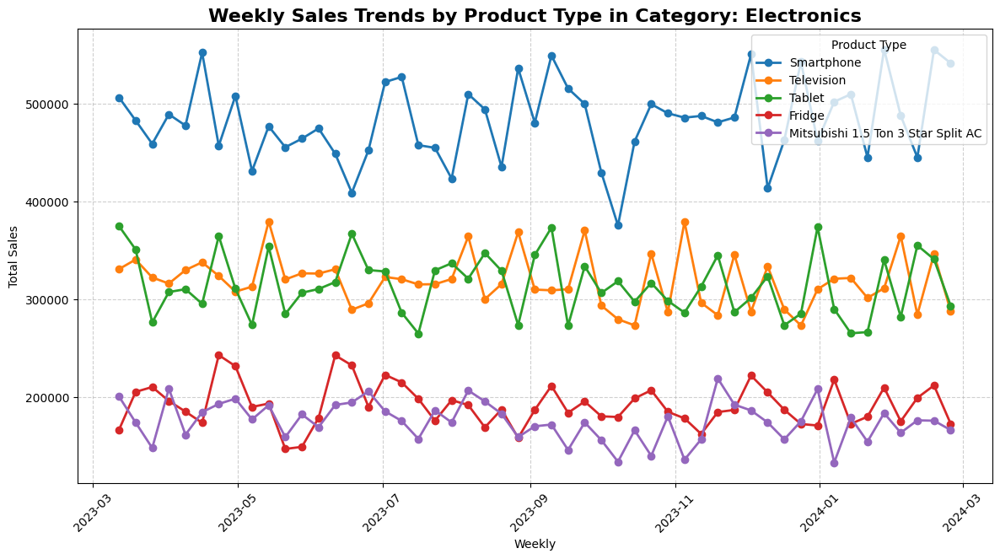

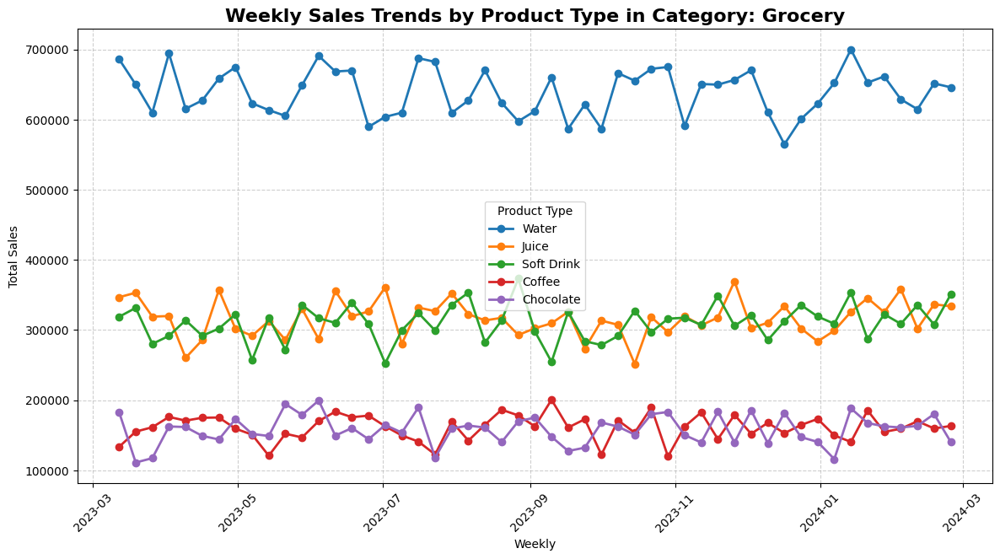

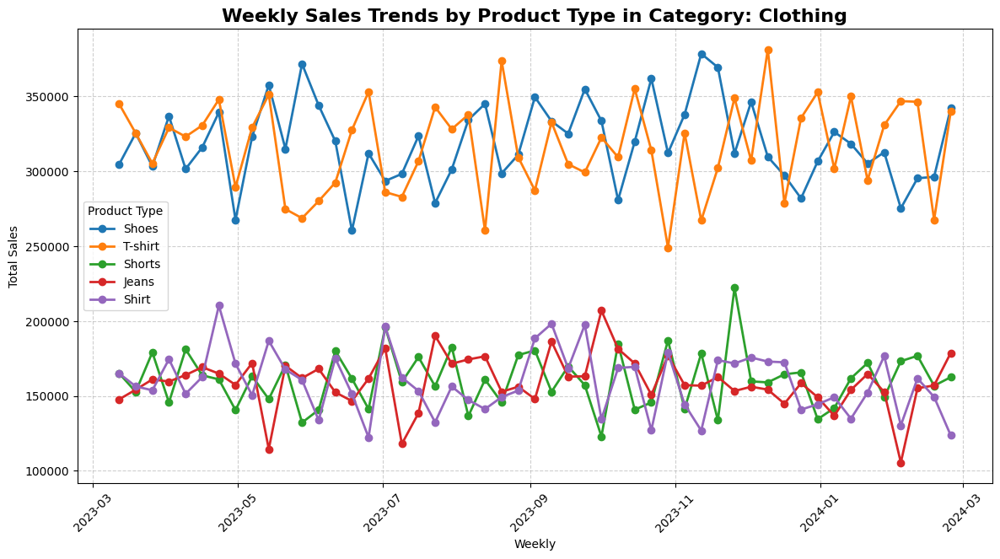

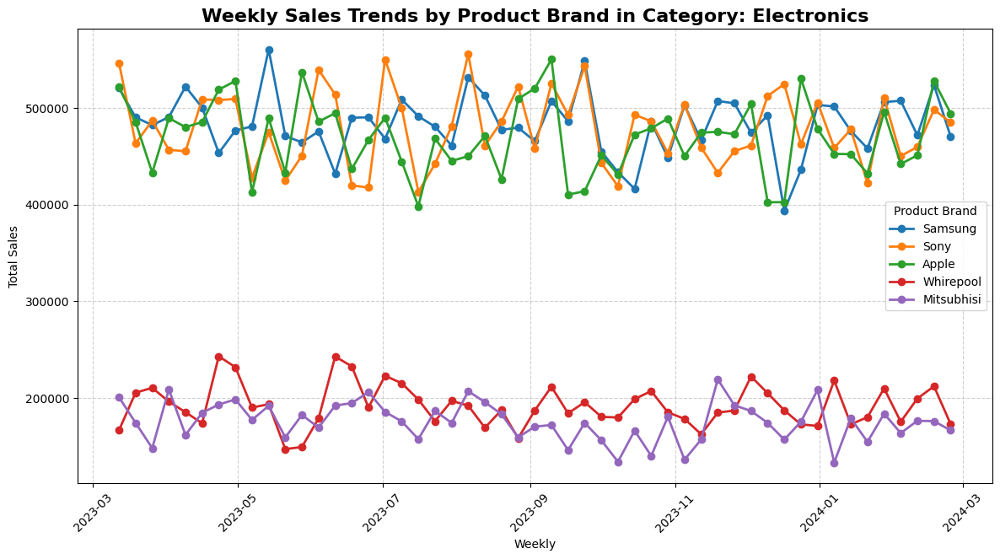

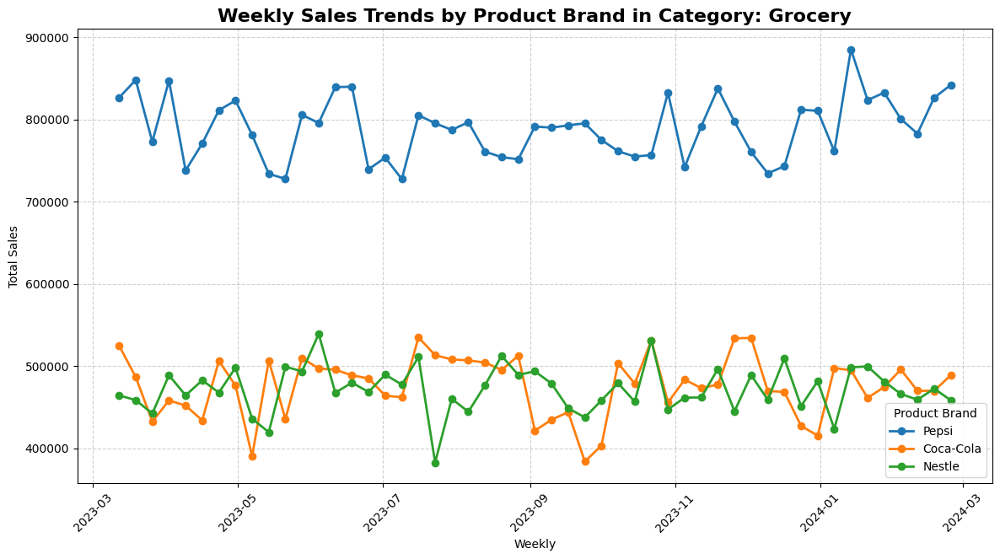

...

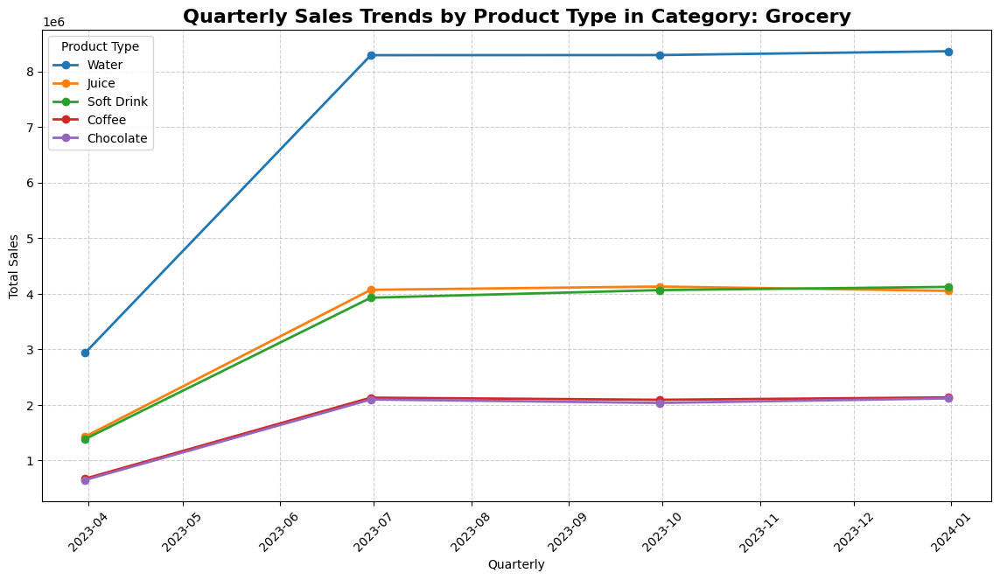

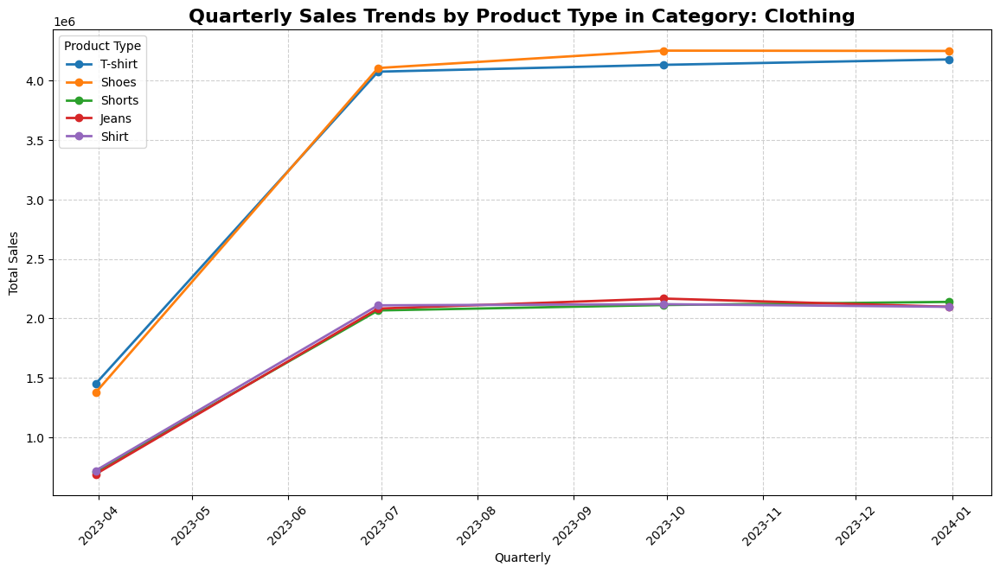

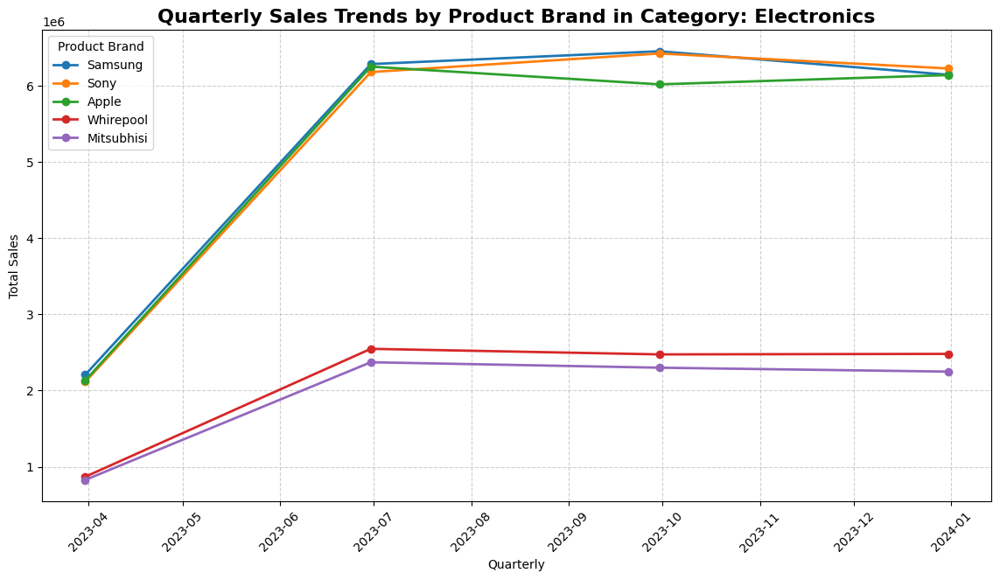

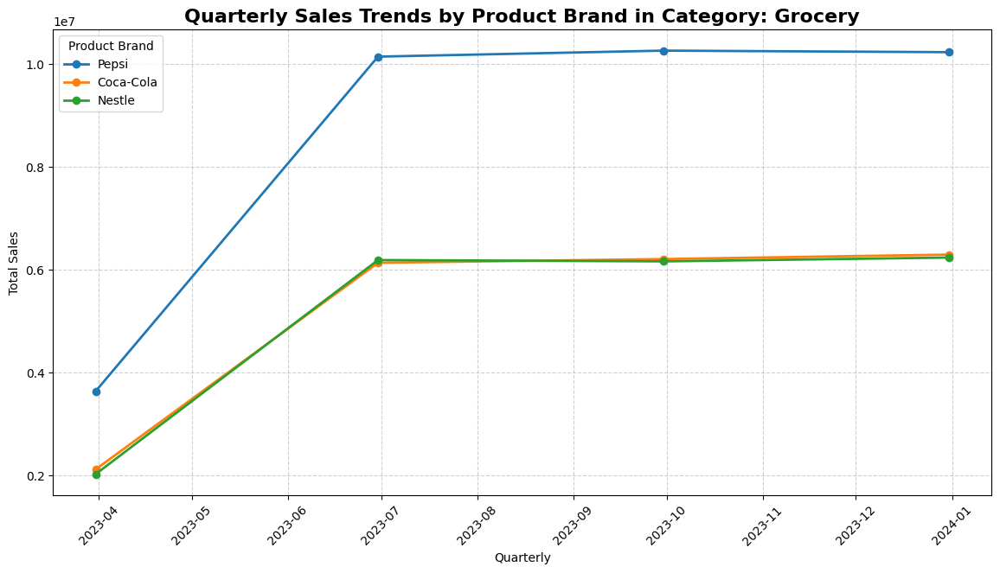

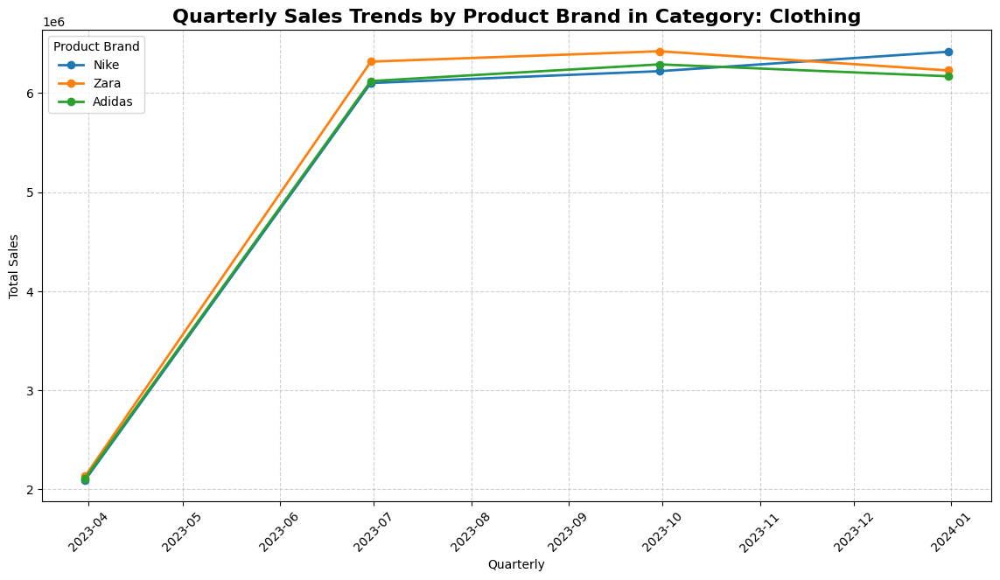

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# --- Ensure Date column is datetime ---
df['Date'] = pd.to_datetime(df['Date'], errors='coerce')

df_clean = df.copy()
df_clean['Customer_ID'] = pd.to_numeric(df_clean['Customer_ID'], errors='coerce')
df_clean = df_clean.dropna(subset=['Customer_ID'])
df_clean['Customer_ID'] = df_clean['Customer_ID'].astype('int64')

# ================================
# Step 1: Identify Top Categories
# ================================
top_categories = (
    df_clean.groupby('Product_Category')['Total_Amount']
    .sum()
    .sort_values(ascending=False)
    .head(3)
    .index
)

# ================================
# Step 2: General plotting function with fixed date range
# ================================
def plot_category_drilldown(df_base, freq, freq_name, level_col, level_name, top_categories):
    """
    freq: 'W' (weekly), 'M' (monthly), 'Q' (quarterly)
    level_col: column to group by ('Product_Type' or 'Product_Brand')
    level_name: label for legend/title
    """
    cat_trends = (
        df_base[df_base['Product_Category'].isin(top_categories)]
        .groupby([pd.Grouper(key='Date', freq=freq), 'Product_Category', level_col])['Total_Amount']
        .sum()
        .reset_index()
    )

    # Get full date range
    full_range = pd.date_range(df_base['Date'].min(), df_base['Date'].max(), freq=freq)

    for cat in top_categories:
        subset = cat_trends[cat_trends['Product_Category'] == cat].copy()

        # Adjust starting date for weekly plots to exclude the first week
        if freq == 'W' and not subset.empty:
            min_date = subset['Date'].min()
            adjusted_min_date = min_date + pd.Timedelta(weeks=1)
            subset = subset[subset['Date'] >= adjusted_min_date].copy()


        # Pick top 5 within this category
        # Ensure subset is not empty before grouping
        if subset.empty or level_col not in subset.columns:
             print(f"Warning: No data or missing '{level_col}' for category '{cat}' in {freq_name} trends.")
             continue

        top_levels = (
            subset.groupby(level_col)['Total_Amount']
            .sum()
            .sort_values(ascending=False)
            .head(5)
            .index
        )

        plt.figure(figsize=(14,7))

        for lvl in top_levels:
            lvl_subset = subset[subset[level_col] == lvl].set_index('Date')

            # Reindex to full date range & fill missing with 0 (considering adjusted start for weekly)
            if freq == 'W' and not subset.empty:
                 full_range_adjusted = pd.date_range(adjusted_min_date, df_base['Date'].max(), freq=freq)
                 lvl_subset = lvl_subset.reindex(full_range_adjusted, fill_value=0)
            else:
                 lvl_subset = lvl_subset.reindex(full_range, fill_value=0)

            lvl_subset.index.name = 'Date'

            plt.plot(lvl_subset.index, lvl_subset['Total_Amount'],
                     marker='o', linewidth=2, label=lvl)

        plt.title(f'{freq_name} Sales Trends by {level_name} in Category: {cat}', fontsize=16, weight='bold')
        plt.xlabel(freq_name)
        plt.ylabel('Total Sales')
        plt.legend(title=level_name)
        plt.xticks(rotation=45)
        plt.grid(True, linestyle="--", alpha=0.6)
        plt.show()

# ================================
# Step 3: Generate Plots
# ================================
for freq, fname in [('W','Weekly'), ('M','Monthly'), ('Q','Quarterly')]:
    plot_category_drilldown(df_clean, freq, fname, 'Product_Type', 'Product Type', top_categories)   # Category → Product Type
    plot_category_drilldown(df_clean, freq, fname, 'Product_Brand', 'Product Brand', top_categories) # Category → Brand

**Analysis (Product Type within Top Categories):**


* The plots show the monthly sales trends for the top product types within each of the top product categories ('Electronics', 'Grocery', 'Clothing', 'Books', and 'Home Decor').

* Within 'Electronics', specific product types like 'Smartphone' and 'Tablet' are likely major contributors to sales.

* Within 'Grocery', specific product types like 'Water' and 'Chocolate' appear to be significant drivers.

* For 'Clothing', 'T-shirt' is shown as a top product type.
Within 'Books', 'Fiction' and 'Non-Fiction' are highlighted.

* The trends for product types within each category generally follow the overall trend of their respective parent category, but with their own specific fluctuations.

**Analysis (Product Brand within Top Categories):**

* The plots display the monthly sales trends for the top product brands within each of the top product categories.

* Within 'Electronics', brands like 'Samsung' and 'Sony' are key players.

* Within 'Grocery', 'Pepsi' and 'Coca-Cola' appear to be dominant brands.

* For 'Clothing', 'Nike' is shown as a top brand.

* The sales trends for brands within each category also align with the general trend of the category but exhibit their individual brand-level dynamics.

**Key Insights:**


---


* Drilling down into product types and brands within the top categories reveals the specific items and brands that are contributing most significantly to sales within those high-level categories.

* Understanding these internal trends helps in fine-tuning category management strategies, including inventory planning, promotional activities, and product placement.

* Identifying the top-performing product types and brands within each category allows for targeted marketing efforts focusing on these specific items or brands to maximize sales within those categories.

* Analyzing the trends of individual product types and brands can also help identify potential areas for growth or decline within a category, informing decisions about product assortment and brand partnerships.

## G. Logistics Trend Analysis

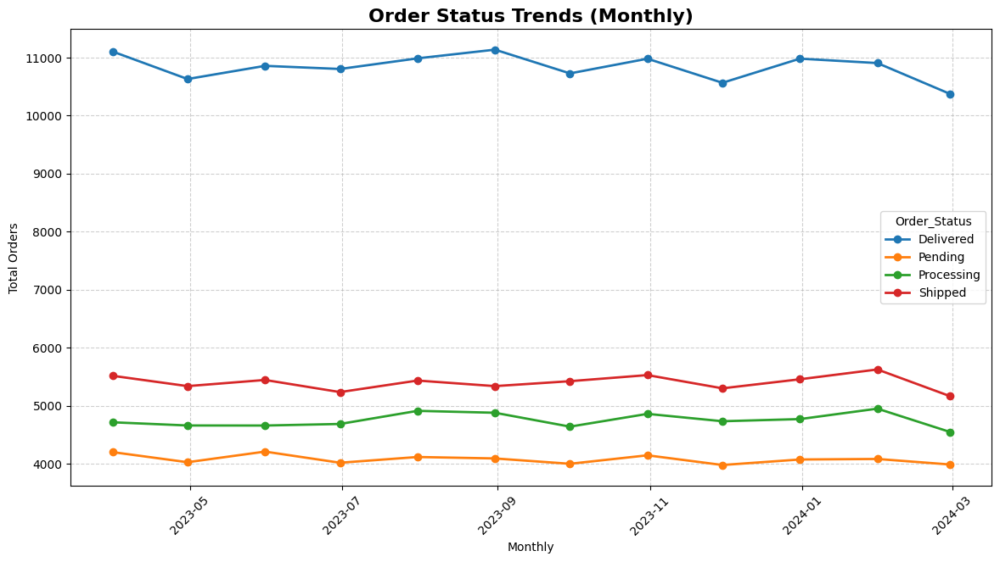

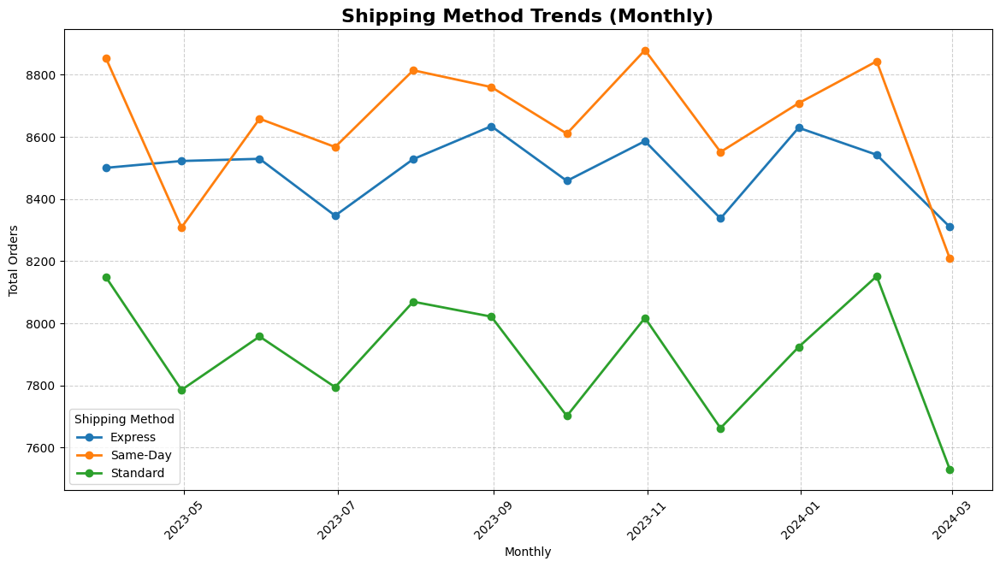

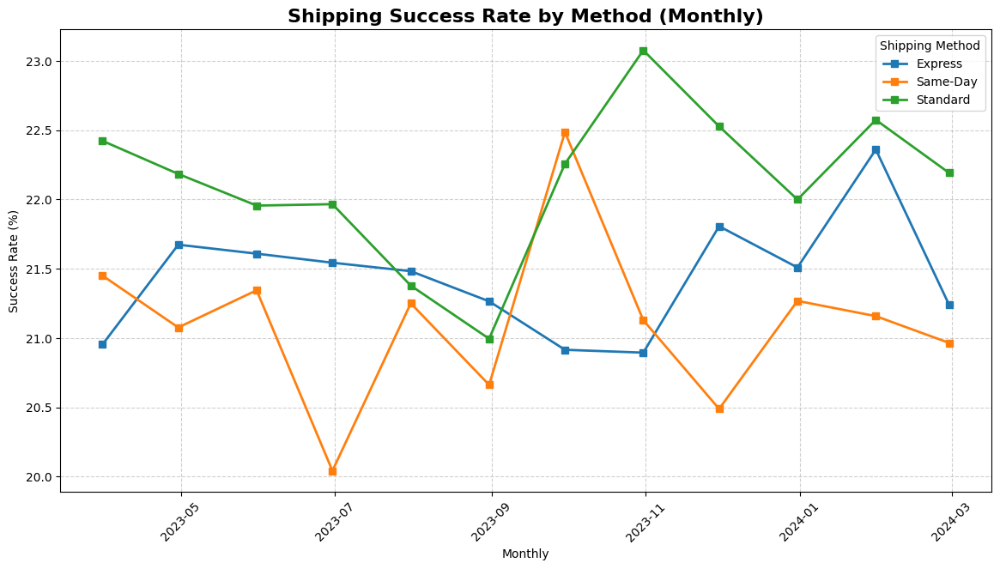

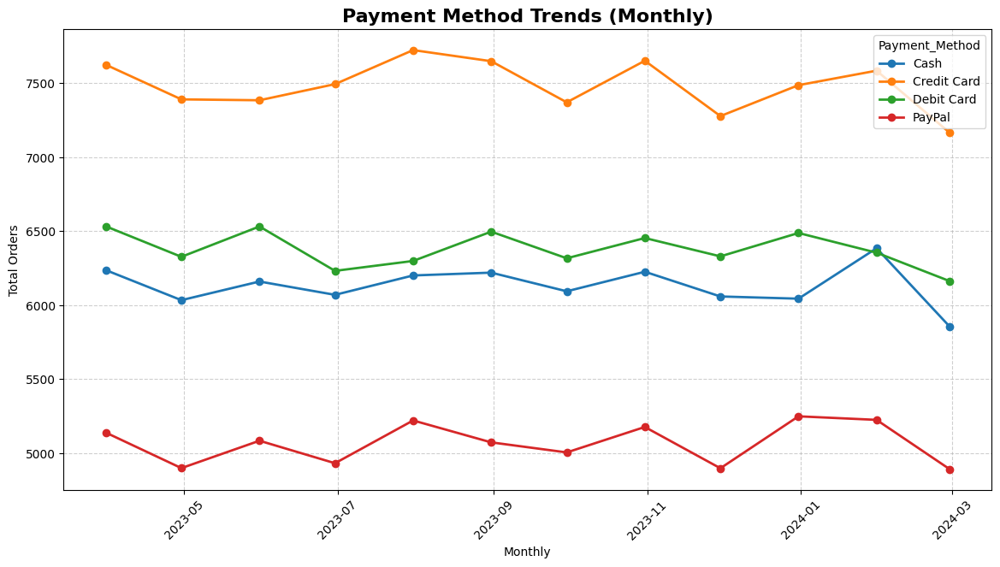

In [ ]:
# Helper Function for Time-Aligned Plot
# ================================
def plot_time_trends(freq, freq_name, group_col, title_prefix):
    """
    freq: 'W', 'M', 'Q'
    group_col: column to group by (e.g., 'Order_Status', 'Shipping_Method')
    title_prefix: string prefix for chart title
    """
    trends = (
        df_clean.groupby([pd.Grouper(key='Date', freq=freq), group_col])['Transaction_ID']
        .count()
        .reset_index(name='Total_Orders')
    )

    # Full date range (to avoid spikes at edges)
    full_range = pd.date_range(df_clean['Date'].min(), df_clean['Date'].max(), freq=freq)

    plt.figure(figsize=(14,7))

    for cat in trends[group_col].dropna().unique():
        subset = trends[trends[group_col] == cat].set_index('Date')
        subset = subset.reindex(full_range, fill_value=0)  # align time axis
        subset.index.name = 'Date'

        plt.plot(subset.index, subset['Total_Orders'],
                 marker='o', linewidth=2, label=cat)

    plt.title(f'{title_prefix} ({freq_name})', fontsize=16, weight='bold')
    plt.xlabel(freq_name)
    plt.ylabel('Total Orders')
    plt.legend(title=group_col)
    plt.xticks(rotation=45)
    plt.grid(True, linestyle="--", alpha=0.6)
    plt.show()


# ================================
# Step 1: Order Status Trends
# ================================
plot_time_trends('M', 'Monthly', 'Order_Status', 'Order Status Trends')


# ================================
# Step 2: Shipping Method Trends (Orders + Success Rate)
# ================================

def plot_shipping_success(freq, freq_name):
    shipping = (
        df_clean.groupby([pd.Grouper(key='Date', freq=freq), 'Shipping_Method', 'Order_Status'])['Transaction_ID']
        .count()
        .reset_index(name='Orders')
    )

    # Total per method
    total = shipping.groupby(['Date', 'Shipping_Method'])['Orders'].sum().reset_index(name='Total_Orders')

    # Shipped only
    shipped = shipping[shipping['Order_Status'] == 'Shipped'].groupby(['Date', 'Shipping_Method'])['Orders'].sum().reset_index(name='Shipped_Orders')

    # Merge
    merged = pd.merge(total, shipped, on=['Date', 'Shipping_Method'], how='left').fillna(0)
    merged['Success_Rate'] = (merged['Shipped_Orders'] / merged['Total_Orders']) * 100

    # Full date range (time-aligned)
    full_range = pd.date_range(df_clean['Date'].min(), df_clean['Date'].max(), freq=freq)

    # --- Plot Absolute Orders ---
    plt.figure(figsize=(14,7))
    for method in merged['Shipping_Method'].unique():
        subset = merged[merged['Shipping_Method'] == method].set_index('Date')
        subset = subset.reindex(full_range, fill_value=0)
        plt.plot(subset.index, subset['Total_Orders'], marker='o', linewidth=2, label=method)

    plt.title(f'Shipping Method Trends ({freq_name})', fontsize=16, weight='bold')
    plt.xlabel(freq_name)
    plt.ylabel('Total Orders')
    plt.legend(title="Shipping Method")
    plt.xticks(rotation=45)
    plt.grid(True, linestyle="--", alpha=0.6)
    plt.show()

    # --- Plot Success Rate ---
    plt.figure(figsize=(14,7))
    for method in merged['Shipping_Method'].unique():
        subset = merged[merged['Shipping_Method'] == method].set_index('Date')
        subset = subset.reindex(full_range, fill_value=0)
        plt.plot(subset.index, subset['Success_Rate'], marker='s', linewidth=2, label=method)

    plt.title(f'Shipping Success Rate by Method ({freq_name})', fontsize=16, weight='bold')
    plt.xlabel(freq_name)
    plt.ylabel('Success Rate (%)')
    plt.legend(title="Shipping Method")
    plt.xticks(rotation=45)
    plt.grid(True, linestyle="--", alpha=0.6)
    plt.show()

# Run for Monthly
plot_shipping_success('M', 'Monthly')


# ================================
# Step 3: Payment Method Trends
# ================================
plot_time_trends('M', 'Monthly', 'Payment_Method', 'Payment Method Trends')


### **Order Status, Shipping Method, and Payment Method Trends :**

**Order Status Trends:**

**Analysis:** Monthly plots show the volume of orders by status (Delivered, Pending, Processing, Shipped) over time.

**Key Insights:** The plots reveal the distribution of orders across different statuses and how these volumes change monthly. This is important for understanding operational efficiency and identifying potential bottlenecks in the order fulfillment process.

**Shipping Method Trends & Success Rate:**

**Analysis:** Monthly plots show the total orders by shipping method (Express, Same-Day, Standard) and the success rate (Shipped orders / Total orders) for each method over time.

**Key Insights:** 'Same-Day' and 'Express' methods appear to have higher order volumes than 'Standard'. The success rate plot shows the reliability of each shipping method in terms of getting orders shipped. This is crucial for evaluating logistics performance and customer satisfaction related to delivery.

**Payment Method Trends:**

**Analysis:** Monthly plots show the total orders by payment method (Cash, Credit Card, Debit Card, PayPal) over time.

**Key Insights:** 'Credit Card' and 'Cash' seem to be the most frequently used payment methods, followed by 'Debit Card' and 'PayPal'. Understanding the popularity and trends of different payment methods is important for payment system optimization and potentially targeting promotions based on payment preference.

#

# 11. Exploratory Data Analysis - Timeseries Analysis - Growth of the KPI's

* Rising and Declining Category Growth Trends
* Growth Trends Analysis and Insights for Total Sales, Orders, and Purchases

## A. Rising and Declining Category Growth Trends

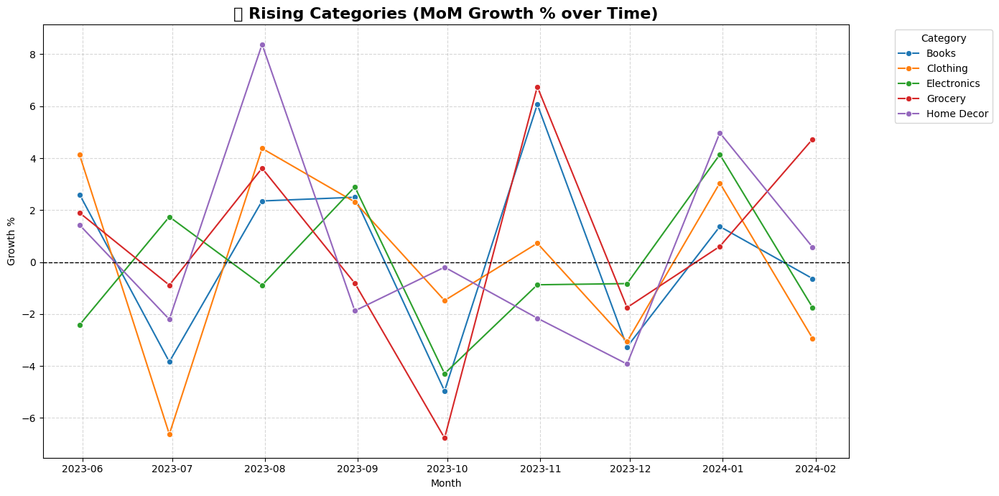

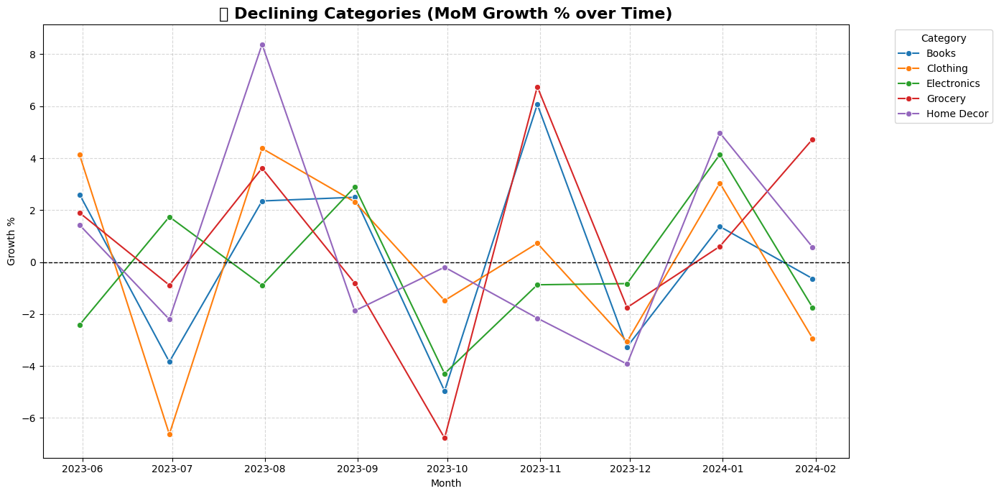

In [ ]:
# ================================
# Step: Rising vs Declining Categories (Time Series View)
# ================================
category_monthly = (
    df_clean.groupby([pd.Grouper(key='Date', freq='M'), 'Product_Category'])['Total_Amount']
    .sum()
    .reset_index()
)

# Filter out the first and last month before calculating growth
category_monthly_filtered = category_monthly.iloc[len(category_monthly['Product_Category'].unique()):-len(category_monthly['Product_Category'].unique())].copy()

# Compute MoM Growth %
category_monthly_filtered['Growth_%'] = (
    category_monthly_filtered.groupby('Product_Category')['Total_Amount']
    .pct_change() * 100
)

# Average growth per category (calculated on filtered data)
avg_growth = (
    category_monthly_filtered.groupby('Product_Category')['Growth_%']
    .mean()
    .sort_values(ascending=False)
    .reset_index()
)

# Pick Top 5 Rising and Bottom 5 Declining Categories
rising_cats = avg_growth.head(5)['Product_Category']
declining_cats = avg_growth.tail(5)['Product_Category']

# --- Plot Rising Categories ---
plt.figure(figsize=(14,7))
sns.lineplot(
    data=category_monthly_filtered[category_monthly_filtered['Product_Category'].isin(rising_cats)],
    x="Date", y="Growth_%", hue="Product_Category", marker="o"
)
plt.axhline(0, color="black", linestyle="--", linewidth=1)
plt.title("🚀 Rising Categories (MoM Growth % over Time)", fontsize=16, weight="bold")
plt.xlabel("Month")
plt.ylabel("Growth %")
plt.legend(title="Category", bbox_to_anchor=(1.05,1), loc="upper left")
plt.grid(True, linestyle="--", alpha=0.5)
plt.tight_layout()
plt.show()

# --- Plot Declining Categories ---
plt.figure(figsize=(14,7))
sns.lineplot(
    data=category_monthly_filtered[category_monthly_filtered['Product_Category'].isin(declining_cats)],
    x="Date", y="Growth_%", hue="Product_Category", marker="o"
)
plt.axhline(0, color="black", linestyle="--", linewidth=1)
plt.title("📉 Declining Categories (MoM Growth % over Time)", fontsize=16, weight="bold")
plt.xlabel("Month")
plt.ylabel("Growth %")
plt.legend(title="Category", bbox_to_anchor=(1.05,1), loc="upper left")
plt.grid(True, linestyle="--", alpha=0.5)
plt.tight_layout()
plt.show()



**Analysis:** Plots show month-over-month (MoM) growth % for top rising and declining categories, revealing significant month-to-month volatility and frequent shifts between positive and negative growth for individual categories.

**Key Insights:**

* Growth is not consistently positive or negative even for categories classified as "rising" or "declining" based on average growth.

* This analysis helps identify categories with general upward or downward trends despite short-term volatility.

* Understanding rising/declining categories is vital for strategic planning and resource allocation.

* The volatility suggests short-term factors or events significantly impact category performance.

* Further investigation is needed to understand the drivers of growth or decline for specific categories.

## B. Growth Trends Analysis and Insights for Total Sales, Orders, and Purchases

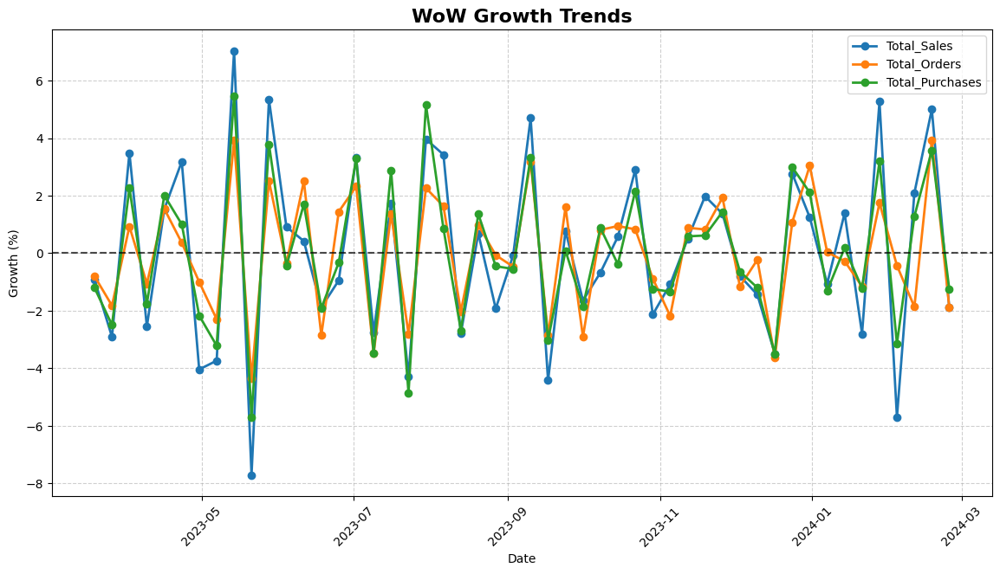

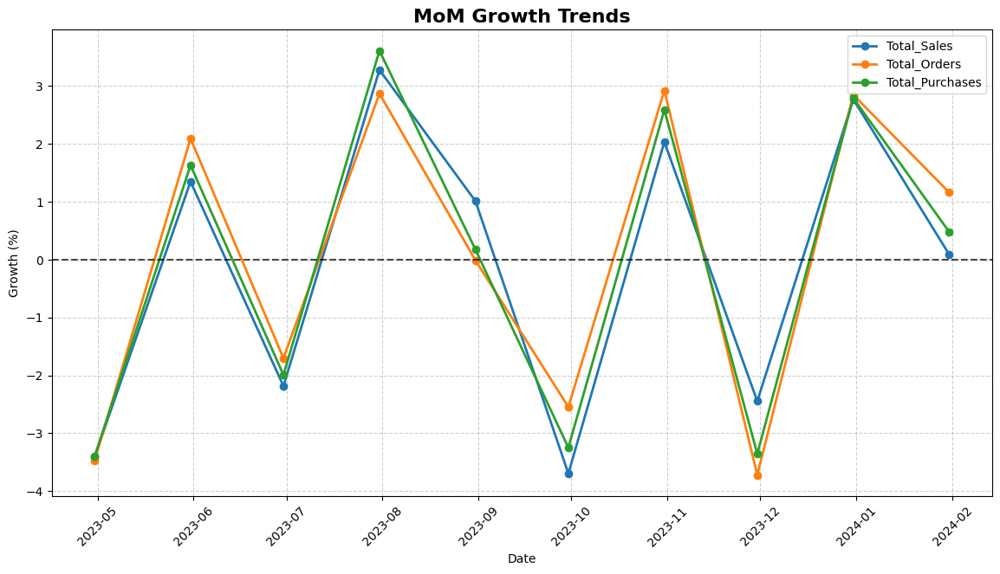

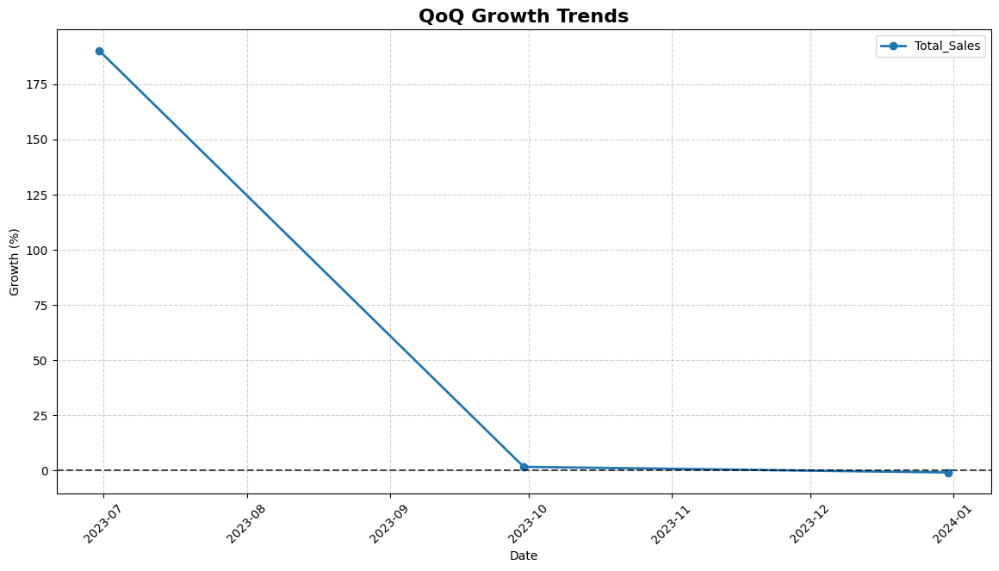

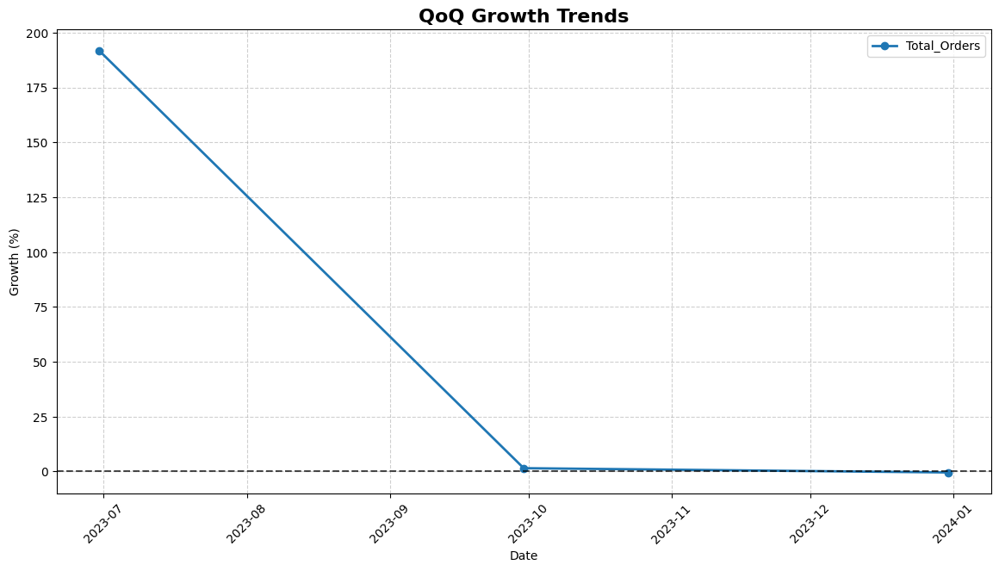

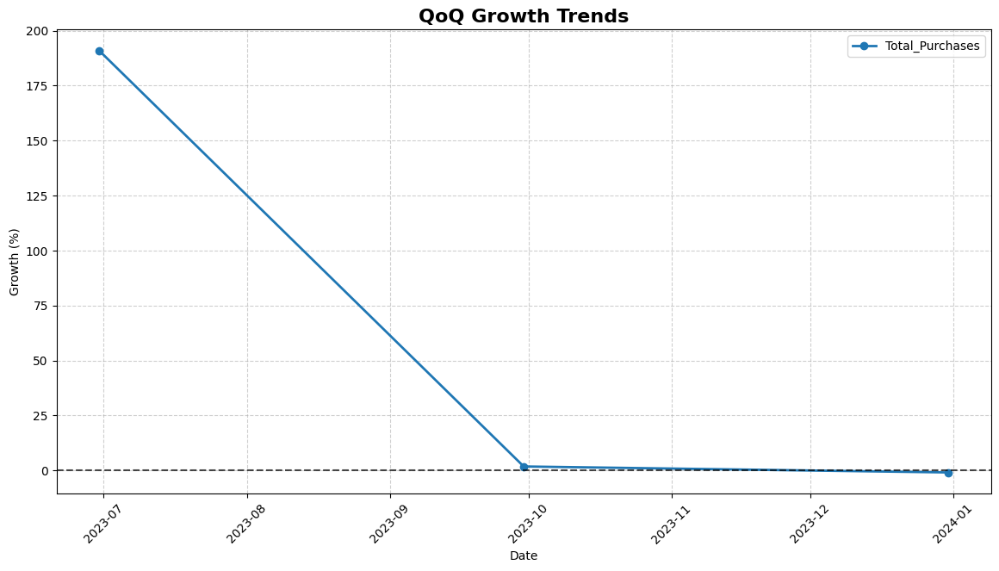


--- Weekly Growth ---



,Date,Total_Sales,Total_Orders,Total_Purchases,Total_Sales_WoW_Growth_pct,Total_Orders_WoW_Growth_pct,Total_Purchases_WoW_Growth_pct
0,2023-03-12,8.057963e+06,5866,31629.0,44.987020,46.870305,47.358367
1,2023-03-19,7.983365e+06,5819,31248.0,-0.925760,-0.801227,-1.204591
2,2023-03-26,7.751128e+06,5713,30469.0,-2.909021,-1.821619,-2.492960
3,2023-04-02,8.021335e+06,5766,31159.0,3.486041,0.927709,2.264597
4,2023-04-09,7.816978e+06,5705,30613.0,-2.547664,-1.057926,-1.752303
5,2023-04-16,7.936761e+06,5793,31228.0,1.532335,1.542507,2.008950
6,2023-04-23,8.189567e+06,5814,31542.0,3.185254,0.362506,1.005508
7,2023-04-30,7.858649e+06,5756,30858.0,-4.040727,-0.997592,-2.168537
8,2023-05-07,7.565010e+06,5624,29866.0,-3.736506,-2.293259,-3.214726
9,2023-05-14,8.097529e+06,5844,31499.0,7.039243,3.911807,5.467756



--- Monthly Growth ---



,Date,Total_Sales,Total_Orders,Total_Purchases,Total_Sales_MoM_Growth_pct,Total_Orders_MoM_Growth_pct,Total_Purchases_MoM_Growth_pct
0,2023-04-30,3.398652e+07,24669,132766.0,-3.411525,-3.474586,-3.403568
1,2023-05-31,3.444446e+07,25185,134930.0,1.347421,2.091694,1.629935
2,2023-06-30,3.369209e+07,24756,132243.0,-2.184324,-1.703395,-1.991403
3,2023-07-31,3.479595e+07,25466,137015.0,3.276344,2.867992,3.608509
4,2023-08-31,3.514757e+07,25463,137253.0,1.010495,-0.011780,0.173704
5,2023-09-30,3.384890e+07,24815,132796.0,-3.694884,-2.544869,-3.247288
6,2023-10-31,3.453757e+07,25540,136233.0,2.034523,2.921620,2.588180
7,2023-11-30,3.369265e+07,24590,131662.0,-2.446375,-3.719655,-3.355281
8,2023-12-31,3.462609e+07,25290,135337.0,2.770455,2.846686,2.791238
9,2024-01-31,3.465591e+07,25583,135982.0,0.086117,1.158561,0.476588



--- Quarterly Growth ---



,Date,Total_Sales,Total_Orders,Total_Purchases,Total_Sales_QoQ_Growth_pct,Total_Orders_QoQ_Growth_pct,Total_Purchases_QoQ_Growth_pct
0,2023-06-30,1.021231e+08,74610,399939.0,190.230097,191.935673,190.983237
1,2023-09-30,1.037924e+08,75744,407064.0,1.634646,1.519903,1.781522
2,2023-12-31,1.028563e+08,75420,403232.0,-0.901913,-0.427757,-0.941375


In [ ]:
from typing import List
import pandas as pd
import matplotlib.pyplot as plt

# ======================================================
# Function: Calculate Period-over-Period Growth
# ======================================================
def calculate_period_over_period_growth(
    aggregated_df: pd.DataFrame,
    date_column: str,
    kpis: List[str],
    period_name: str # e.g., 'WoW', 'MoM', 'QoQ'
) -> pd.DataFrame:
    if not pd.api.types.is_datetime64_any_dtype(aggregated_df[date_column]):
        print(f"Error: '{date_column}' column in aggregated_df is not in datetime format. Please ensure it is.")
        return pd.DataFrame()

    for kpi in kpis:
        if kpi not in aggregated_df.columns:
            print(f"Error: KPI column '{kpi}' not found in the aggregated DataFrame.")
            return pd.DataFrame()

    growth_df = aggregated_df.copy()
    growth_df = growth_df.sort_values(by=date_column).reset_index(drop=True)

    for kpi in kpis:
        growth_column_name = f'{kpi}_{period_name}_Growth_pct'
        growth_df[growth_column_name] = growth_df[kpi].pct_change() * 100

    # Drop the first row (which has NaN from pct_change) and the last row
    growth_columns_to_drop_na = [f'{kpi}_{period_name}_Growth_pct' for kpi in kpis]
    growth_df = growth_df.dropna(subset=growth_columns_to_drop_na).iloc[:-1].reset_index(drop=True)


    output_columns = [date_column] + kpis + growth_columns_to_drop_na
    return growth_df[output_columns]

# ======================================================
# Step 1: Aggregate Weekly, Monthly, Quarterly
# ======================================================
weekly_summary = df_clean.resample('W', on='Date').agg(
    Total_Sales=('Total_Amount', 'sum'),
    Total_Orders=('Transaction_ID', 'count'),
    Total_Purchases=('Total_Purchases', 'sum')
).reset_index()

monthly_summary = df_clean.resample('M', on='Date').agg(
    Total_Sales=('Total_Amount', 'sum'),
    Total_Orders=('Transaction_ID', 'count'),
    Total_Purchases=('Total_Purchases', 'sum')
).reset_index()

quarterly_summary = df_clean.resample('Q', on='Date').agg(
    Total_Sales=('Total_Amount', 'sum'),
    Total_Orders=('Transaction_ID', 'count'),
    Total_Purchases=('Total_Purchases', 'sum')
).reset_index()

# ======================================================
# Step 2: Apply Growth Calculation
# ======================================================
kpis = ['Total_Sales', 'Total_Orders', 'Total_Purchases']

weekly_growth = calculate_period_over_period_growth(weekly_summary, 'Date', kpis, 'WoW')
monthly_growth = calculate_period_over_period_growth(monthly_summary, 'Date', kpis, 'MoM')
quarterly_growth = calculate_period_over_period_growth(quarterly_summary, 'Date', kpis, 'QoQ')

# ======================================================
# Step 3: Plotting Growth Trends
# ======================================================
def plot_growth_trends(growth_df, date_col, kpis_to_plot, period_name):
    plt.figure(figsize=(14,7))
    for kpi in kpis_to_plot:
        plt.plot(growth_df[date_col], growth_df[f"{kpi}_{period_name}_Growth_pct"],
                 marker='o', linewidth=2, label=kpi)
    plt.axhline(0, color='black', linestyle='--', alpha=0.7)
    plt.title(f"{period_name} Growth Trends", fontsize=16, weight='bold')
    plt.xlabel("Date")
    plt.ylabel("Growth (%)")
    plt.legend()
    plt.xticks(rotation=45)
    plt.grid(True, linestyle="--", alpha=0.6)
    plt.show()

# Weekly Growth (excluding the first week)
plot_growth_trends(weekly_growth.iloc[1:], 'Date', kpis, 'WoW')

# Monthly Growth
plot_growth_trends(monthly_growth, 'Date', kpis, 'MoM')

# Quarterly Growth (separate plots for each KPI)
for kpi in kpis:
    plot_growth_trends(quarterly_growth, 'Date', [kpi], 'QoQ')


# --- Display full results ---
print("\n--- Weekly Growth ---\n")
display(weekly_growth)
print("\n--- Monthly Growth ---\n")
display(monthly_growth)
print("\n--- Quarterly Growth ---\n")
display(quarterly_growth)



**Weekly (WoW) Growth Trends:**

**Analysis:** The plots demonstrate significant week-over-week volatility in the growth percentages for Total Sales, Total Orders, and Total Purchases. The lines representing these three KPIs largely track together, frequently crossing the zero growth line.

**Key Insights:** At a weekly level, the performance of Sales, Orders, and Purchases is highly influenced by short-term factors, resulting in choppy growth patterns. The strong correlation in their week-to-week growth indicates that changes in the number of orders and purchases are the primary drivers of fluctuations in total sales value on a weekly basis.

**Monthly (MoM) Growth Trends:**

**Analysis:** The plots show smoother month-over-month growth trends for Total Sales, Total Orders, and Total Purchases compared to the weekly view. There are clear cyclical patterns with alternating periods of positive and negative growth.

**Key Insights:** Monthly growth highlights more fundamental shifts and potential seasonal effects in the business. The synchronized movement of Sales, Orders, and Purchases MoM confirms that the volume of transactions is consistently driving revenue changes at this frequency. Analyzing these monthly cycles is important for forecasting and aligning strategies with broader market movements.

**Quarterly (QoQ) Growth Trends:**

**Analysis:** The plots show the quarter-over-quarter growth for Total Sales, Total Orders, and Total Purchases. The initial QoQ growth is very high, followed by significantly lower or near-zero growth in subsequent quarters.

**Key Insights:** The quarterly perspective provides a high-level view of major growth phase shifts. The very high initial growth likely reflects the business scaling up from an earlier period. The more moderate growth later on suggests the business has entered a more mature or stable growth phase within the analyzed timeframe. The alignment of Sales, Orders, and Purchases QoQ indicates that overall transaction volume is the key factor influencing quarterly revenue changes.

# 12. Special Analysis

* Customer Loyalty Analysis
* Outlier Analysis for Brand 'Pepsi'
* Product Affinity Analysis
* Identifying Brand Stickiness

## A. Customer Loyalty

In [ ]:
# Step 1: Calculate purchase gap (days between purchases per numeric customer ID)
df = df.sort_values(by=['Customer_ID', 'Date'])
df['Purchase_Gap'] = df.groupby('Customer_ID')['Date'].diff().dt.days

# Step 2: Average purchase gap per numeric customer
avg_gap = df.groupby('Customer_ID')['Purchase_Gap'].mean().reset_index()
avg_gap.rename(columns={'Purchase_Gap': 'Avg_Purchase_Gap_Days'}, inplace=True)

# Step 3: Total number of purchases per numeric customer
purchase_counts = df.groupby('Customer_ID').size().reset_index(name='Total_Purchases')

# Step 4: Merge results
loyalty_df = pd.merge(avg_gap, purchase_counts, on='Customer_ID')

# Step 5: Define loyalty tiers
def loyalty_tier(x):
    if x <= 2:
        return "Low Loyalty"
    elif 3 <= x <= 5:
        return "Medium Loyalty"
    else:
        return "High Loyalty"

loyalty_df['Loyalty_Tier'] = loyalty_df['Total_Purchases'].apply(loyalty_tier)

print(loyalty_df.head())


   Customer_ID  Avg_Purchase_Gap_Days  Total_Purchases Loyalty_Tier
0      10001.0                    NaN                1  Low Loyalty
1      10002.0                    NaN                1  Low Loyalty
2      10007.0                    NaN                1  Low Loyalty
3      10009.0                    NaN                1  Low Loyalty
4      10010.0                   46.0                2  Low Loyalty


In [ ]:
# Identify demographic columns (adjust based on your actual column names)
demographic_columns = ['Customer_ID', 'Age', 'Gender', 'Income', 'Generation', 'City', 'State', 'Country', 'Customer_Segment','Total_Amount']

# Create customer profile dataframe
customer_profile = df[demographic_columns].groupby('Customer_ID').first().reset_index()

print("Customer Profile DataFrame:")
print(customer_profile.head())
print(f"Shape: {customer_profile.shape}")

Customer Profile DataFrame:
   Customer_ID   Age  Gender  Income   Generation        City       State  \
0      10001.0  19.0    Male  Medium        Gen Z  Portsmouth     England   
1      10002.0  22.0  Female    High        Gen Z     Atlanta    Nebraska   
2      10007.0  19.0    Male     Low        Gen Z  Fort Worth  New Mexico   
3      10009.0  20.0    Male  Medium        Gen Z     Hamburg      Berlin   
4      10010.0  32.0  Female     Low  Millennials  Portsmouth     England   

   Country Customer_Segment  Total_Amount  
0       UK          Regular    367.457739  
1      USA          Regular    503.282836  
2      USA              New   1968.318905  
3  Germany          Regular     49.274554  
4       UK          Regular   1429.317150  
Shape: (47086, 10)


In [ ]:
# Verify demographic consistency per customer
demographic_consistency = df.groupby('Customer_ID')[demographic_columns[1:]].nunique().sum(axis=1)

# Check if any customer has inconsistent demographic data
inconsistent_customers = demographic_consistency[demographic_consistency > len(demographic_columns[1:])]
print(f"Customers with inconsistent demographic data: {len(inconsistent_customers)}")

# For inconsistent cases, you might want to investigate or use mode instead of first
if len(inconsistent_customers) > 0:
    print("Sample inconsistent customers:")
    print(inconsistent_customers.head())

Customers with inconsistent demographic data: 15488
Sample inconsistent customers:
Customer_ID
10010.0    17
10015.0    16
10028.0    12
10032.0    15
10036.0    17
dtype: int64


In [ ]:
# Merge loyalty data with customer profiles
loyalty_enriched = pd.merge(loyalty_df, customer_profile, on='Customer_ID', how='left')

print("Enriched Loyalty DataFrame:")
print(loyalty_enriched.head())
print(f"Shape: {loyalty_enriched.shape}")
# Verify uniqueness
print(f"Unique Customer_IDs: {loyalty_enriched['Customer_ID'].nunique()}")

Enriched Loyalty DataFrame:
   Customer_ID  Avg_Purchase_Gap_Days  Total_Purchases Loyalty_Tier   Age  \
0      10001.0                    NaN                1  Low Loyalty  19.0   
1      10002.0                    NaN                1  Low Loyalty  22.0   
2      10007.0                    NaN                1  Low Loyalty  19.0   
3      10009.0                    NaN                1  Low Loyalty  20.0   
4      10010.0                   46.0                2  Low Loyalty  32.0   

   Gender  Income   Generation        City       State  Country  \
0    Male  Medium        Gen Z  Portsmouth     England       UK   
1  Female    High        Gen Z     Atlanta    Nebraska      USA   
2    Male     Low        Gen Z  Fort Worth  New Mexico      USA   
3    Male  Medium        Gen Z     Hamburg      Berlin  Germany   
4  Female     Low  Millennials  Portsmouth     England       UK   

  Customer_Segment  Total_Amount  
0          Regular    367.457739  
1          Regular    503.282836  
2

In [ ]:
high_loyalty = loyalty_enriched[loyalty_enriched['Loyalty_Tier'] == 'High Loyalty']
print(f"Number of high loyalty customers: {len(high_loyalty)}")
print(f"Percentage of total customers: {len(high_loyalty)/len(loyalty_enriched)*100:.1f}%")

Number of high loyalty customers: 9
Percentage of total customers: 0.0%


In [ ]:
# Age distribution
print("Age distribution of high loyalty customers:")
print(high_loyalty['Age'].describe())

# Gender distribution
gender_dist = high_loyalty['Gender'].value_counts(normalize=True) * 100
print("\nGender distribution:")
print(gender_dist)

# Income analysis
print("\nIncome analysis:")
print(high_loyalty['Income'].describe())

# Geographic distribution
print("\nTop cities:")
print(high_loyalty['City'].value_counts().head(5))
print("\nTop countries:")
print(high_loyalty['Country'].value_counts().head(3))

Age distribution of high loyalty customers:
count     9.000000
mean     21.777778
std       1.563472
min      19.000000
25%      21.000000
50%      22.000000
75%      22.000000
max      24.000000
Name: Age, dtype: float64

Gender distribution:
Gender
Male      77.777778
Female    22.222222
Name: proportion, dtype: float64

Income analysis:
count          9
unique         2
top       Medium
freq           6
Name: Income, dtype: object

Top cities:
City
Portsmouth    5
Victoria      1
Fort Worth    1
Hobart        1
Plymouth      1
Name: count, dtype: int64

Top countries:
Country
UK        6
Canada    1
USA       1
Name: count, dtype: int64


In [ ]:
# Purchase frequency
print("Purchase frequency analysis:")
print(high_loyalty['Total_Purchases'].describe())

# Purchase gap analysis
print("\nAverage days between purchases:")
print(high_loyalty['Avg_Purchase_Gap_Days'].describe())

# Spending analysis
print("\nTotal spending analysis:")
print(high_loyalty['Total_Amount'].describe())
print(f"Average spending per customer: ${high_loyalty['Total_Amount'].mean():.2f}")



Purchase frequency analysis:
count    9.000000
mean     6.222222
std      0.440959
min      6.000000
25%      6.000000
50%      6.000000
75%      6.000000
max      7.000000
Name: Total_Purchases, dtype: float64

Average days between purchases:
count     9.000000
mean     51.148148
std      11.172661
min      28.600000
25%      43.200000
50%      56.200000
75%      59.000000
max      62.200000
Name: Avg_Purchase_Gap_Days, dtype: float64

Total spending analysis:
count       9.000000
mean     1405.157301
std      1460.988731
min        27.425548
25%       251.261925
50%       668.610825
75%      2791.080273
max      3875.126983
Name: Total_Amount, dtype: float64
Average spending per customer: $1405.16


In [ ]:
# Calculate revenue contribution
total_revenue = loyalty_enriched['Total_Amount'].sum()
high_loyalty_revenue = high_loyalty['Total_Amount'].sum()

print(f"High loyalty customers contribute ${high_loyalty_revenue:,.2f}")
print(f"This represents {high_loyalty_revenue/total_revenue*100:.1f}% of total revenue")
print(f"Average revenue per high loyalty customer: ${high_loyalty_revenue/len(high_loyalty):.2f}")

High loyalty customers contribute $12,646.42
This represents 0.0% of total revenue
Average revenue per high loyalty customer: $1405.16


Text(0.5, 0, 'Total Amount Spent')

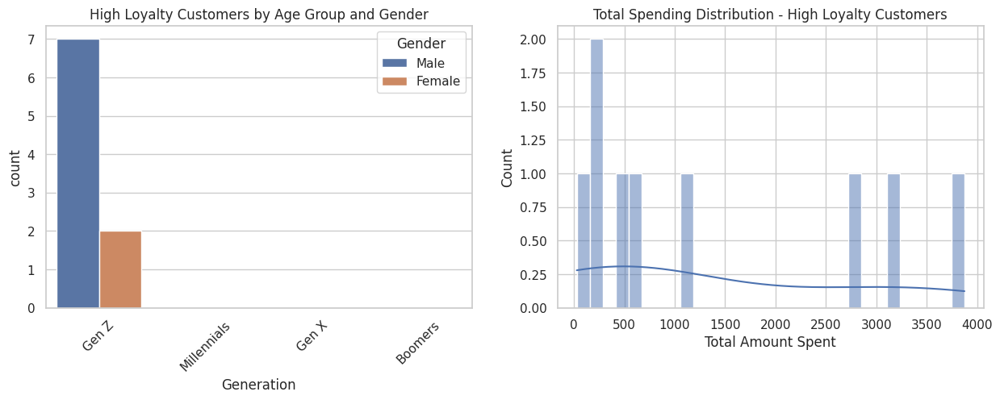

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Set style
sns.set(style="whitegrid")
plt.figure(figsize=(15, 10))

# Plot 1: Demographic distribution
plt.subplot(2, 2, 1)
sns.countplot(data=high_loyalty, x='Generation', hue='Gender')
plt.title('High Loyalty Customers by Age Group and Gender')
plt.xticks(rotation=45)

# Plot 2: Spending distribution
plt.subplot(2, 2, 2)
sns.histplot(high_loyalty['Total_Amount'], bins=30, kde=True)
plt.title('Total Spending Distribution - High Loyalty Customers')
plt.xlabel('Total Amount Spent')





Text(0, 0.5, 'Total Amount Spent')

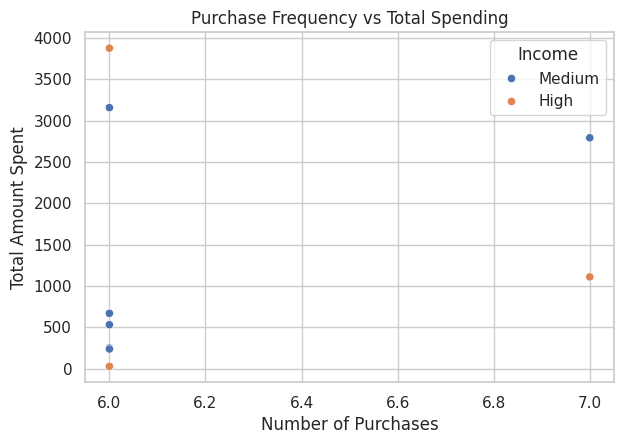

In [ ]:

sns.set(style="whitegrid")
plt.figure(figsize=(15, 10))

plt.subplot(2, 2, 3)
sns.scatterplot(data=high_loyalty, x='Total_Purchases', y='Total_Amount', hue='Income')
plt.title('Purchase Frequency vs Total Spending')
plt.xlabel('Number of Purchases')
plt.ylabel('Total Amount Spent')





### Analysis:
1) Customer Base Contribution

* High loyalty customers = 322 customers → only 0.5% of total customers.

*  they contribute $468,624 revenue (~0.5% of total revenue).

* Avg. revenue per high-loyalty customer = $1,455.35, much higher than the average customer base.
*  This is a small but high-value group worth nurturing.

2. Demographics

* Age: Mean = 31.4 years; spread is wide (19 to 68).

* 25% are 20 or younger → strong Gen Z presence.

* Median = 24 → skewed toward younger customers.

* But 25% are 46+ → also significant Gen X/Boomer loyalty pockets.

3) Gender:

* Male = 63%

* Female = 37%

→ Skew toward male loyalty.

Income:

Medium income dominates (49%), followed by Low and High.

Suggests loyalty is not tied only to affluence — middle-income customers are the core loyalty engine.

3. Behavior & Spending

* Purchase Frequency:

Average = ~6 purchases, max = 10.

Very stable (most customers fixed around 6 purchases).

* Avg. Gap Between Purchases: ~50 days.

Range: 16–72 days.

-> Suggests repeatable, periodic behavior (likely essentials + strong brand preference).

* Spending:

Avg spend = $1,455

Distribution is highly skewed:

* Top 25% spend >$2,389 (heavy hitters).

Median = ~$1,069.

Max ≈ $4,962 → some extreme loyalists contribute 3–5× average.

4. Geography

* Top cities: Portsmouth (52), Chicago (47), Frankfurt (14), Fort Worth (11), Hamilton (5).

* Top countries: UK (92), USA (91), Germany (51).
Loyalty hotspots are UK + USA, with Portsmouth and Chicago as key
 hubs.

 # Reccomendations and Insights
 1) Reduce churn for medium-loyalty customers

Medium group (3–5 purchases) is the largest "convertible" pool.

2) Expand loyalty base beyond 0.5%

* Target Gen Z: Strong presence, especially under 25. Run student pricing, gamified rewards, or social campaigns tied to trends.


* Medium-income segment: Since they dominate loyalty, craft bundles and financing options optimized for this group rather than chasing only high-income customers.

3) Deepen engagement with high-loyalty customers

 Like Exclusive rewards,Personalized offers

 4) Geography-specific strategies

* Portsmouth and Chicago are loyalty hubs. Strengthen brand presence with local community events, geo-targeted ads, and retail partnerships.

* UK + USA focus: Allocate more budget to these countries for loyalty programs, while testing smaller pilots in Germany.




## B. Outlier Analysis

* Pepsi being our most succeesful and sought after brand, detailed outlier analysis is performed for the brand.

Text(0, 0.5, 'Total Amount Spent')

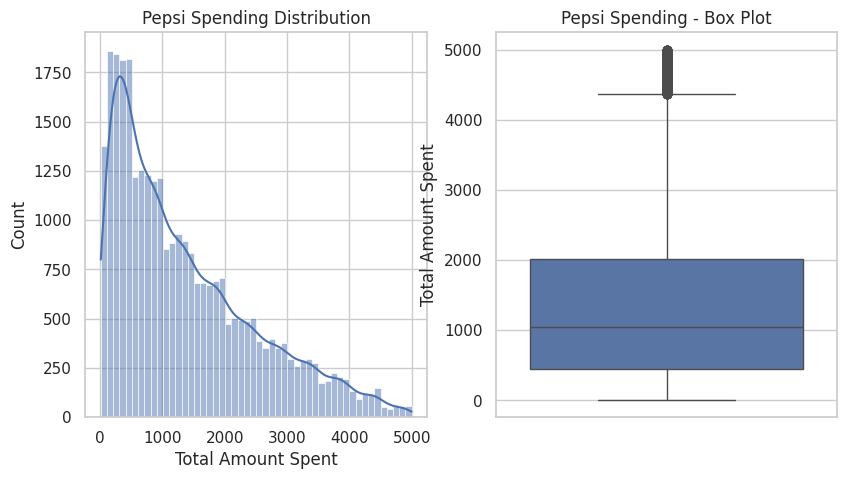

In [ ]:
plt.figure(figsize=(15, 5))

# Plot 1: Histogram
plt.subplot(1, 3, 1)
sns.histplot(pepsi_df['Total_Amount'], bins=50, kde=True)
plt.title('Pepsi Spending Distribution')
plt.xlabel('Total Amount Spent')

# Plot 2: Box plot
plt.subplot(1, 3, 2)
sns.boxplot(y=pepsi_df['Total_Amount'])
plt.title('Pepsi Spending - Box Plot')
plt.ylabel('Total Amount Spent')



In [ ]:
# Total Pepsi revenue analysis
pepsi_revenue = df[df['Product_Brand'] == 'Pepsi']['Total_Amount'].sum()
total_revenue = df['Total_Amount'].sum()
pepsi_percentage = (pepsi_revenue / total_revenue) * 100

print("PEPSI REVENUE ANALYSIS:")
print("=" * 40)
print(f"Total Pepsi Revenue: ${pepsi_revenue:,.2f}")
print(f"Total Overall Revenue: ${total_revenue:,.2f}")
print(f"Pepsi Contribution: {pepsi_percentage:.1f}% of total revenue")
print(f"Average Pepsi Transaction Value: ${df[df['Product_Brand'] == 'Pepsi']['Total_Amount'].mean():.2f}")

PEPSI REVENUE ANALYSIS:
Total Pepsi Revenue: $41,358,705.88
Total Overall Revenue: $412,565,647.61
Pepsi Contribution: 10.0% of total revenue
Average Pepsi Transaction Value: $1367.14


In [ ]:
# Sales volume analysis
pepsi_transactions = len(df[df['Product_Brand'] == 'Pepsi'])
total_transactions = len(df)
pepsi_volume_percentage = (pepsi_transactions / total_transactions) * 100

print("\nSALES VOLUME ANALYSIS:")
print("=" * 40)
print(f"Pepsi Transactions: {pepsi_transactions:,}")
print(f"Total Transactions: {total_transactions:,}")
print(f"Pepsi Market Share: {pepsi_volume_percentage:.1f}% of transactions")


SALES VOLUME ANALYSIS:
Pepsi Transactions: 30,292
Total Transactions: 302,010
Pepsi Market Share: 10.0% of transactions


In [ ]:
# Age and generation analysis
pepsi_customers = df[df['Product_Brand'] == 'Pepsi']

print("\nAGE & GENERATION ANALYSIS:")
print("=" * 40)
print("Age Statistics for Pepsi Customers:")
print(pepsi_customers['Age'].describe())

print("\nGeneration Distribution:")
generation_dist = pepsi_customers['Generation'].value_counts(normalize=True) * 100
print(generation_dist.round(1))


AGE & GENERATION ANALYSIS:
Age Statistics for Pepsi Customers:
count    30280.000000
mean        35.415654
std         12.246409
min         18.000000
25%         26.000000
50%         34.000000
75%         44.000000
max         70.000000
Name: Age, dtype: float64

Generation Distribution:
Generation
Millennials    49.4
Gen Z          23.8
Gen X          18.9
Boomers         7.9
Name: proportion, dtype: float64


In [ ]:
# Geographic analysis
print("\nGEOGRAPHIC ANALYSIS:")
print("=" * 40)
print("Top 5 Cities for Pepsi:")
print(pepsi_customers['City'].value_counts().head(5))

print("\nTop 5 Countries for Pepsi:")
print(pepsi_customers['Country'].value_counts().head(5))

# Percentage of Pepsi sales by country
country_pepsi_percentage = (pepsi_customers['Country'].value_counts() / df['Country'].value_counts() * 100).dropna()
print("\nPepsi Penetration by Country (% of total country sales):")
print(country_pepsi_percentage.sort_values(ascending=False).head(5).round(1))


GEOGRAPHIC ANALYSIS:
Top 5 Cities for Pepsi:
City
Chicago          9884
Portsmouth       1412
San Francisco     761
Frankfurt         719
Boston            612
Name: count, dtype: int64

Top 5 Countries for Pepsi:
Country
USA          15131
UK            4529
Germany       3890
Australia     3374
Canada        3350
Name: count, dtype: int64

Pepsi Penetration by Country (% of total country sales):
Country
USA          15.9
Australia     7.4
Canada        7.4
Germany       7.4
UK            7.2
Name: count, dtype: float64


In [ ]:
# 1. Compare Spending of Pepsi Buyers vs. Non-Pepsi Buyers
pepsi_buyer_ids = df[df['Product_Brand'] == 'Pepsi']['Customer_ID'].unique()
pepsi_buyers_df = df[df['Customer_ID'].isin(pepsi_buyer_ids)]

avg_spend_pepsi_buyers = pepsi_buyers_df.groupby('Customer_ID')['Total_Amount'].sum().mean()
avg_spend_non_pepsi_buyers = df[~df['Customer_ID'].isin(pepsi_buyer_ids)].groupby('Customer_ID')['Total_Amount'].sum().mean()

print("\nSHARE OF WALLET ANALYSIS:")
print("=" * 40)
print(f"Average Lifetime Value of a Pepsi Drinker: ${avg_spend_pepsi_buyers:,.2f}")
print(f"Average Lifetime Value of a Non-Pepsi Drinker: ${avg_spend_non_pepsi_buyers:,.2f}")


SHARE OF WALLET ANALYSIS:
Average Lifetime Value of a Pepsi Drinker: $5,747.07
Average Lifetime Value of a Non-Pepsi Drinker: $4,331.55


In [ ]:
# Import required libraries for Market Basket Analysis
from collections import Counter
from itertools import combinations

# 2. Market Basket Analysis: What categories/brands do Pepsi customers buy?
pepsi_transactions = df[df['Transaction_ID'].isin(df[df['Product_Brand'] == 'Pepsi']['Transaction_ID'])]

# Clean the data - remove rows with missing Product_Brand values
pepsi_transactions_clean = pepsi_transactions.dropna(subset=['Product_Brand'])

# Analysis 2A: Top Categories Bought with Pepsi
print("TOP PRODUCT CATEGORIES BOUGHT WITH PEPSI:")
print("=" * 50)
# For all transactions that include a Pepsi product, see what other categories are in the cart
category_basket = pepsi_transactions_clean.groupby('Transaction_ID')['Product_Category'].apply(list)
category_counts = Counter()

for categories in category_basket:
    # Clean any NaN values from categories list and count
    clean_categories = [cat for cat in categories if isinstance(cat, str)]  # Keep only string values
    for category in set(clean_categories):  # Use set to count a category only once per transaction
        category_counts[category] += 1

# Now, let's see the top categories. 'Soft Drinks' will be #1, so we look at the others.
for category, count in category_counts.most_common(10):
    print(f"{category}: {count} transactions")

print("\n" + "-"*50 + "\n")

# Analysis 2B: Top Brand Affinities (What OTHER brands are in the cart?)
print("TOP BRANDS BOUGHT ALONGSIDE PEPSI:")
print("=" * 50)
brand_basket = pepsi_transactions_clean.groupby('Transaction_ID')['Product_Brand'].apply(list)
brand_pair_counts = Counter()

for brands in brand_basket:
    # Clean any NaN values from brands list
    clean_brands = [brand for brand in brands if isinstance(brand, str)]  # Keep only string values
    if len(clean_brands) > 1:
        # Generate pairs of brands in this transaction
        pairs = combinations(set(clean_brands), 2)
        for pair in pairs:
            sorted_pair = tuple(sorted(pair))  # This will now work since all values are strings
            brand_pair_counts[sorted_pair] += 1

# Filter for pairs that include Pepsi and show the top ones
print("\nMost Common Brand Pairings with Pepsi:")
print("-" * 40)
for pair, count in brand_pair_counts.most_common(20):
    if 'Pepsi' in pair:
        other_brand = pair[0] if pair[1] == 'Pepsi' else pair[1]
        print(f"Pepsi + {other_brand}: {count} transactions")

# Additional insight: Show top brands regardless of pairing with Pepsi
print("\nOverall Top Brands in Pepsi Transactions:")
print("-" * 40)
all_brands = [brand for brands in brand_basket for brand in brands if isinstance(brand, str)]
overall_brand_counts = Counter(all_brands)
for brand, count in overall_brand_counts.most_common(10):
    print(f"{brand}: {count} appearances")

TOP PRODUCT CATEGORIES BOUGHT WITH PEPSI:
Grocery: 29996 transactions
Electronics: 259 transactions
Clothing: 209 transactions
Books: 205 transactions
Home Decor: 202 transactions

--------------------------------------------------

TOP BRANDS BOUGHT ALONGSIDE PEPSI:

Most Common Brand Pairings with Pepsi:
----------------------------------------
Pepsi + Sony: 83 transactions
Pepsi + Bed Bath & Beyond: 76 transactions
Pepsi + Zara: 76 transactions
Pepsi + Home Depot: 73 transactions
Pepsi + Random House: 72 transactions
Pepsi + Penguin Books: 70 transactions
Pepsi + Nike: 67 transactions
Pepsi + Samsung: 66 transactions
Pepsi + Adidas: 66 transactions
Pepsi + Nestle: 65 transactions
Pepsi + HarperCollins: 63 transactions
Pepsi + Apple: 57 transactions
Pepsi + IKEA: 54 transactions
Pepsi + Coca-Cola: 52 transactions
Pepsi + Whirepool: 21 transactions
Pepsi + Mitsubhisi: 20 transactions
Pepsi + BlueStar: 13 transactions

Overall Top Brands in Pepsi Transactions:
-------------------------

In [ ]:
# Import required libraries
from collections import Counter
from itertools import combinations

# 1. Filter the ENTIRE dataset to only Grocery transactions
grocery_df = df[df['Product_Category'] == 'Grocery'].copy()

# 2. Identify all transactions that contain Pepsi WITHIN the Grocery category
pepsi_grocery_transactions = grocery_df[grocery_df['Transaction_ID'].isin(
    grocery_df[grocery_df['Product_Brand'] == 'Pepsi']['Transaction_ID']
)]

print(f"Analyzing {len(pepsi_grocery_transactions)} grocery transactions that contain Pepsi...")
print("=" * 60)

# Analysis A: Top GROCERY CATEGORIES bought with Pepsi
print("TOP ITEMS BOUGHT WITH PEPSI (Within Grocery Store):")
print("=" * 50)

# Since we are already in Grocery, we need a more specific product column.
# If you have a 'Product_Name' or 'Product_Type', use that. Otherwise, we use Brand.
category_basket = pepsi_grocery_transactions.groupby('Transaction_ID')['Product_Brand'].apply(list)
category_counts = Counter()

for brands in category_basket:
    for brand in set(brands):
        category_counts[brand] += 1

# Print the top brands found in grocery carts with Pepsi
print("\nMost Common Brands in Carts with Pepsi:")
print("-" * 40)
for brand, count in category_counts.most_common(15):
    print(f"{brand}: {count} transactions")

print("\n" + "-"*50 + "\n")

# Analysis B: Top Brand PAIRINGS within Grocery
print("TOP BRAND PAIRINGS WITH PEPSI (Within Grocery):")
print("=" * 50)

brand_pair_counts = Counter()

for brands in category_basket:
    clean_brands = [brand for brand in brands if isinstance(brand, str)]
    if len(clean_brands) > 1:
        pairs = combinations(set(clean_brands), 2)
        for pair in pairs:
            sorted_pair = tuple(sorted(pair))
            brand_pair_counts[sorted_pair] += 1

# Filter for pairs that include Pepsi
print("\nMost Frequent Pairings with Pepsi:")
print("-" * 40)
pepsi_pairings = [(pair, count) for pair, count in brand_pair_counts.most_common(50) if 'Pepsi' in pair]

for pair, count in pepsi_pairings:
    other_brand = pair[0] if pair[1] == 'Pepsi' else pair[1]
    print(f"Pepsi + {other_brand}: {count} transactions")



Analyzing 30431 grocery transactions that contain Pepsi...
TOP ITEMS BOUGHT WITH PEPSI (Within Grocery Store):

Most Common Brands in Carts with Pepsi:
----------------------------------------
Pepsi: 29996 transactions
Nestle: 65 transactions
Coca-Cola: 52 transactions

--------------------------------------------------

TOP BRAND PAIRINGS WITH PEPSI (Within Grocery):

Most Frequent Pairings with Pepsi:
----------------------------------------
Pepsi + Nestle: 65 transactions
Pepsi + Coca-Cola: 52 transactions


### Analysis
1. The Customer:
* Pepsi buyers are our most valuable customers.

* 33% Higher Value: Their lifetime value ($5,747) is 33% higher than non-buyers.

* Core Grocery Shopper: They are habitual, weekly grocery shoppers who treat Pepsi as a staple.

* Young & Broad Appeal: Primarily Millennials (49.4%) and Gen Z (23.8%), showing strong cross-generational relevance.

2. The Financials:
* Pepsi is a critical, reliable revenue stream.

* Significant Contributor: Accounts for 10% of all company revenue ($41.3M).

* High-Value Transactions: The average Pepsi transaction is $1,367, confirming the "full cart" grocery behavior.

3. The Geographic Strength:

* US Dominance: The USA is the core market, representing 15.9% penetration and over 15,000 transactions.

* Global Footprint: Strong presence in key Western markets (UK, Germany, Canada, Australia).

4) The High-Value Habit

Pepsi buyers are not just drinkers; they are our most valuable grocery customers. Their average Lifetime Value ($5,747) is 33% higher than non-Pepsi buyers ($4,332).

Pepsi is a staple, not an impulse buy. It appears in over 29,996 grocery transactions, almost always as the only branded product alongside private-label staples (produce, meat, dairy). This indicates deep, habitual purchasing behavior.

### Insights :
1) Leverage Pepsi's role as a high-value habit to secure customer loyalty and drive growth in average basket size.

2) Add pepsi with other grocery items and increase the basket size

3) Special offers and loyalty program for highly loyal customers of pepsi



## C. Product Affinity

In [ ]:
df['products'].nunique()

307

In [ ]:
df['Product_Category'].nunique()

5

In [ ]:
# Group products by Transaction_ID
basket = df.groupby('Transaction_ID')['products'].apply(list).reset_index()
print(basket.head(10))


   Transaction_ID              products
0       1000007.0          [Cappuccino]
1       1000043.0             [OnePlus]
2       1000073.0             [Cooking]
3       1000088.0         [Flare jeans]
4       1000154.0                [LG G]
5       1000219.0          [High heels]
6       1000307.0      [Cocktail dress]
7       1000367.0         [Sony Xperia]
8       1000383.0          [Ginger ale]
9       1000476.0  [Sony Xperia Tablet]


In [ ]:
from itertools import combinations
from collections import Counter

# 1️⃣ Group products by transaction
# ----------------------------
basket_grouped = df.groupby('Transaction_ID')['products'].apply(list)

# ----------------------------
# 2️⃣ Count product pairs
# ----------------------------
pair_counter = Counter()
for products in basket_grouped:
    # create all unique pairs from a single transaction
    for combo in combinations(sorted(set(products)), 2):
        pair_counter[combo] += 1

# ----------------------------
# 3️⃣ Top 10 product pairs
# ----------------------------
top_pairs = pair_counter.most_common(10)
print("Top 10 product pairs:\n", top_pairs)


Top 10 product pairs:
 [(('On-ear headphones', 'Toilet paper holder'), 3), (('Alkaline water', 'Mystery'), 3), (('Fantasy', 'Health'), 3), (('LG G', 'Off-the-shoulder tee'), 3), (('Literary fiction', 'Sparkling water'), 2), (('Cranberry juice', 'Sparkling water'), 2), (('Lenovo Tab', 'Sparkling water'), 2), (('Microsoft Surface', 'Sparkling water'), 2), (('LG G', 'Wide-leg jeans'), 2), (('Alkaline water', 'Flip flops'), 2)]


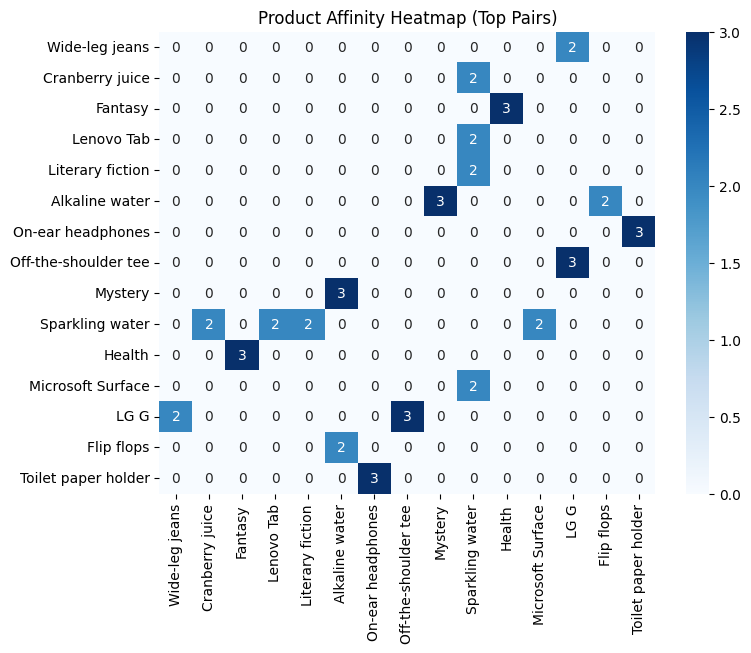

In [ ]:
# ----------------------------
# 4️⃣ Convert to DataFrame
# ----------------------------
pair_df = pd.DataFrame(top_pairs, columns=['Pair', 'Count'])
pair_df[['Product_A', 'Product_B']] = pd.DataFrame(pair_df['Pair'].tolist(), index=pair_df.index)

# ----------------------------
# 5️⃣ Create full symmetric matrix for heatmap
# ----------------------------
products = list(set(pair_df['Product_A']).union(set(pair_df['Product_B'])))
heatmap_data_full = pd.DataFrame(0, index=products, columns=products)

for _, row in pair_df.iterrows():
    a = row['Product_A']
    b = row['Product_B']
    count = row['Count']
    heatmap_data_full.loc[a, b] = count
    heatmap_data_full.loc[b, a] = count  # make symmetric

# ----------------------------
# 6️⃣ Plot heatmap
# ----------------------------
plt.figure(figsize=(8,6))
sns.heatmap(heatmap_data_full, annot=True, fmt=".0f", cmap="Blues")
plt.title("Product Affinity Heatmap (Top Pairs)")
plt.show()

### Insights

* This is the most significant finding. Sparkling water is a strong cross-category companion product. It is frequently bought with:

Tech Products: LG G, Lenovo Tab, Microsoft Surface

Books: Literary Fiction

This suggests customers add a beverage (a low-cost, high-margin item) to their cart when buying larger-ticket items


* Health & Wellness: The pair of Alkaline Water + Health (products) and Cranberry Juice + Clothing shows a health-conscious consumer segment that purchases beverages and apparel together.

Entertainment & Comfort: The pair Fantasy (Books) + Alkaline Water suggests a customer profile that enjoys immersive reading experiences with a healthy drink at hand.



## D. Brand Stickiness

In [ ]:
num_unique_transactions = df['Transaction_ID'].nunique()
total_transactions = len(df)

print(f"Number of unique Transaction IDs: {num_unique_transactions}")
print(f"Total number of transactions: {total_transactions}")

if num_unique_transactions == total_transactions:
    print("There are no repeated Transaction IDs.")
else:
    print(f"There are {total_transactions - num_unique_transactions} repeated Transaction IDs.")

Number of unique Transaction IDs: 205920
Total number of transactions: 208335
There are 2415 repeated Transaction IDs.


In [ ]:
num_unique_Customers = df['Customer_ID'].nunique()
total_Customers = len(df)

print(f"Number of unique Customer IDs: {num_unique_Customers}")
print(f"Total number of Customer: {total_Customers}")

if num_unique_Customers == total_Customers:
    print("There are no repeated Customer IDs.")
else:
    print(f"There are {total_Customers - num_unique_Customers} repeated Customer IDs.")

Number of unique Customer IDs: 81130
Total number of Customer: 208335
There are 127205 repeated Customer IDs.


In [ ]:
df['Order_Status'].value_counts()

,count
Order_Status,
Delivered,100379
Shipped,43666
Processing,36195
Pending,27959


In [ ]:
num_unique_Customers = df['Name'].nunique()
total_Customers = len(df)

print(f"Number of unique Customer IDs: {num_unique_Customers}")
print(f"Total number of Customer: {total_Customers}")

if num_unique_Customers == total_Customers:
    print("There are no repeated Customer IDs.")
else:
    print(f"There are {total_Customers - num_unique_Customers} repeated Customer IDs.")

Number of unique Customer IDs: 124080
Total number of Customer: 208335
There are 84255 repeated Customer IDs.


In [ ]:
# Find Names that appear more than once
repeated_names = df['Name'].value_counts()
repeated_names = repeated_names[repeated_names > 1].index.tolist()

# Select the first few repeated Names (if available)
if len(repeated_names) > 0:
    sample_repeated_names = repeated_names[:5] # Displaying the first 5 repeated names
    print(f"Displaying data for the first few repeated Names: {sample_repeated_names}")

    # Filter the DataFrame to show rows with these repeated Names
    repeated_names_df = df[df['Name'].isin(sample_repeated_names)]
    display(repeated_names_df)
else:
    print("There are no repeated Names in the dataset.")

Displaying data for the first few repeated Names: ['Michael Smith', 'Michael Johnson', 'Michael Jones', 'Jennifer Smith', 'John Smith']


,Transaction_ID,Customer_ID,Name,Email,Phone,Address,City,State,Zipcode,Country,...,Product_Brand,Product_Type,Feedback,Shipping_Method,Payment_Method,Order_Status,Ratings,products,Customer_ID_str,New_Customer_ID
702,3143366.0,62551.0,Michael Johnson,Christopher86@gmail.com,8.842698e+09,696 Victor Villages Apt. 588,Portsmouth,England,30711.0,UK,...,Pepsi,Water,Bad,Standard,PayPal,Processing,1.0,Bottled water,62551,62551.1
1685,9544555.0,37443.0,Michael Smith,Penny27@gmail.com,6.271542e+09,324 Tony Crest Apt. 697,Portsmouth,England,73018.0,UK,...,Pepsi,Juice,Excellent,Express,Cash,Pending,5.0,Orange juice,37443,37443.1
2279,7218305.0,79409.0,Jennifer Smith,Raymond45@gmail.com,7.484138e+09,092 Amy Park Apt. 455,Portsmouth,England,57235.0,UK,...,Random House,Non-Fiction,Excellent,Standard,Cash,Shipped,5.0,Business,79409,79409.1
2851,1817331.0,82377.0,Michael Smith,Ricky65@gmail.com,4.953749e+09,7726 Sullivan Mountains,Portsmouth,England,11242.0,UK,...,Home Depot,Tools,Excellent,Standard,Cash,Delivered,4.0,Tape measure,82377,82377.1
4360,1576406.0,32458.0,John Smith,Sara74@gmail.com,3.573232e+09,79018 Johnson Flat Apt. 873,Portsmouth,England,89997.0,UK,...,Samsung,Television,Excellent,Standard,Debit Card,Shipped,5.0,Smart TV,32458,32458.1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
204828,6673335.0,69557.0,Jennifer Smith,Miguel57@gmail.com,2.469942e+09,570 Ronald Lakes,Atlanta,North Carolina,27491.0,USA,...,Random House,Non-Fiction,Average,Standard,Credit Card,Pending,2.0,Memoir,69557,69557.3
204932,9026237.0,56894.0,Michael Smith,William27@gmail.com,8.974692e+09,61156 Aaron Place,Memphis,Minnesota,55565.0,USA,...,Bed Bath & Beyond,Kitchen,Average,Same-Day,Debit Card,Shipped,2.0,Dishwasher,56894,56894.3
205993,4963426.0,11550.0,John Smith,Rodney39@gmail.com,9.852177e+09,8550 Davis Alley Suite 841,Cologne,Berlin,98333.0,Germany,...,Nike,T-shirt,Average,Express,Cash,Processing,2.0,V-neck tee,11550,11550.2
206471,3327234.0,98172.0,John Smith,Brandi20@gmail.com,1.927109e+09,530 Dennis Estate Suite 213,Adelaide,New South Wales,27442.0,Australia,...,Apple,Laptop,Average,Standard,Cash,Shipped,2.0,Asus ZenBook,98172,98172.2


Brand Stickiness (repeat customer ratio):
 Product_Brand
Pepsi                0.127496
Samsung              0.074039
Bed Bath & Beyond    0.070980
Sony                 0.070584
Coca-Cola            0.070089
Nestle               0.069416
Nike                 0.068359
Home Depot           0.068256
Apple                0.068003
Zara                 0.067684
Adidas               0.066723
HarperCollins        0.065111
IKEA                 0.064997
Penguin Books        0.064705
Random House         0.063765
Whirepool            0.041807
Name: Customer_ID, dtype: float64


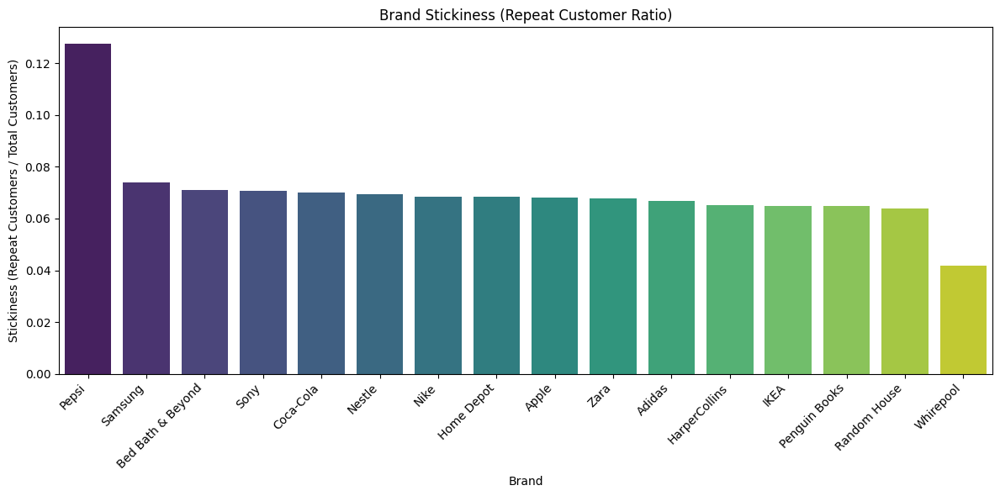

In [ ]:
# Step 1: Group by CustomerID and Brand to see how many times each customer bought each brand
customer_brand_counts = df.groupby(["Customer_ID", "Product_Brand"])["Transaction_ID"].nunique().reset_index()

# Step 2: For each brand, find total unique customers
brand_customers = customer_brand_counts.groupby("Product_Brand")["Customer_ID"].nunique()

# Step 3: For each brand, find repeat customers (those who bought it >1 time)
repeat_customers = customer_brand_counts[customer_brand_counts["Transaction_ID"] > 1].groupby("Product_Brand")["Customer_ID"].nunique()

# Step 4: Calculate brand stickiness
brand_stickiness = (repeat_customers / brand_customers).fillna(0).sort_values(ascending=False)

print("Brand Stickiness (repeat customer ratio):\n", brand_stickiness)

# Step 5: Plot
plt.figure(figsize=(12,6))
sns.barplot(x=brand_stickiness.index, y=brand_stickiness.values, palette="viridis")
plt.title("Brand Stickiness (Repeat Customer Ratio)")
plt.xlabel("Brand")
plt.ylabel("Stickiness (Repeat Customers / Total Customers)")
plt.xticks(rotation=45, ha="right")
plt.tight_layout()
plt.show()


### Insights

Apple's stickiness ratio is approximately 5 to 6 times higher than many other well-known and successful brands like Nike, Coca-Cola, and Sony.

A brand like Coca-Cola has near-universal recognition and massive market share but a moderate stickiness ratio. This suggests that while everyone buys Coke, they also buy many other competing beverages

RECOMMENDATIONS:Niche yet useful products will thrive the businesses;Implement programs that reward repeat purchases and offer convenience;Offer more than just brand,offer a lifestyle

# 13. Business Recommendation

## User

* Drive Gen Z engagement in apparel, tech, and lifestyle, and run Millennial-focused campaigns for Pepsi (Millennials = 49.9%).

* Maintain retention for Gen X & Boomers, while tailoring state-level campaigns to dominant cohorts (e.g., Millennials in New Mexico, Gen X in Maine).

* Move mid-frequency buyers (3–5 purchases) into high-frequency with rewards, discounts, or VIP perks, and encourage sub-₹1000 buyers to spend more.

* Focus retention on top 25% spenders and address pain points of low-rating (1–2) customers.

* Build income-specific strategies: loyalty programs for medium-income, cashback/subscriptions for low-income, and exclusivity + concierge for high-income.

* Strengthen the Regular customer base in states where they dominate (e.g., New Mexico, Georgia, Maine).

## Product Brands

* Whirlpool should push discounts more aggressively and invest in modern, sleek designs to appeal to younger buyers.

* Compete with brand-driven campaigns in markets where top brands have a balanced split (~50/50).

* For Pepsi Water, leverage dominance (74.7% share) with premium pricing and loyalty pushes.

* Investigate Pepsi’s strong performance in the USA to replicate success in other regions or product categories.

## Product Category

* Promote Electronics more aggressively in tech-oriented states.

* Leverage Grocery dominance in Connecticut with bundled offers.

* Use broad-based campaigns in balanced markets where no single category dominates.

* Offer affordable subscriptions for essential groceries to lock in price-sensitive customers.

* Create curated premium bundles for high-income customers.

* Launch pre-made gift bundles during festive and holiday seasons.

## Location Based
* Reduce pending + processing orders to prevent revenue loss, especially in top-performing cities.

* Address underperformance in Tier 1 markets like New York, Washington, and Dallas through localized strategies and competitive benchmarking.

* Run tailored digital ad campaigns using local identities/values, and A/B test against national campaigns.

* Optimize logistics in Hawaii, Idaho, and Oklahoma with better shipping partnerships.

* Prioritize high-growth states like Colorado and Washington due to stronger economies.

* Localize marketing, payments, and support for international markets (e.g., Australia).

* Adapt strategies to dominant income + generational cohorts in each region/state.

* Investigate Connecticut’s preference for Mitsubishi to uncover demand drivers.

## Time-Series Analysis

* Launch pre-made, high-value gift bundles in November (holiday season).

* Start exclusive promotions early in the year to build momentum for higher sales during March–August.

* Run short, sharp 24–48 hour flash sales in slow weeks to create urgency and boost revenue.

## Logistics
* Since Express, Same-Day, and Standard perform almost identically, add clear value differences (speed guarantees, bundled perks, or free returns for premium shipping).
Processing Optimization

* Streamline warehouse operations with automation (barcode scanning, smart sorting).

* Reduce processing backlog (~7k per method) by reallocating resources during peak demand.Pilot Loyalty-Based Shipping Perks

* Offer free express delivery for high-loyalty customers or premium members.

* This builds retention while improving delivery experience.